# Generative Models (160 + 40 points)

## Diffusion Models vs. GANs vs. VAE

### HW4 @ DL Course, Dr. Soleymani, Spring 2023

*Full Name:* HamidReza Yaghoubi Araghi

*SID:* 98109786

In this notebook, we are going to implement Variational AutoEncoder (VAE), Denoising Diffusion Probabilistic Model (DDPM) and Generative Adversarial Network (GAN) on the FashionMNIST dataset. To generate images, these models convert noise to images from the training distribution, but the key difference is that Diffusion models denoise the image gradually. The following sections briefly describe each model.

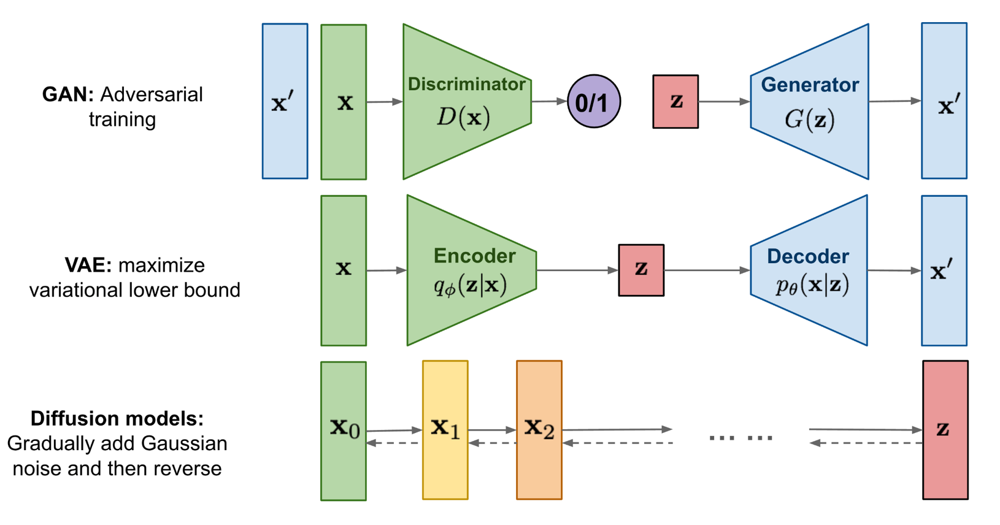

**NOTICE:** 
+ Please complete the code in the given structure. You may change the hyperparameters according to your computing power as long as the results indicate the desired performance.
+ Complete the `TODO` parts in the code accordingly. 
+ Remember to answer the conceptual questions. 

## Dataset

We are going to work on the FashionMNIST dataset. FashionMNIST consists of a training set of 60,000 examples and a test set of 10,000 samples. Each sample is a 28x28 grayscale image associated with a label from 10 classes. We are going to use the training split in this notebook. You can use `dataloader` to train your models. Also, you can use `plot_samples` to plot a sequence of images (e.g. iteratively denoised images by DDPM).

In [ ]:
from torchvision import transforms 
from torch.utils.data import DataLoader
from torch import optim
from tqdm.notebook import tqdm
from torch.autograd import Variable 

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import matplotlib.pyplot as plt

BATCH_SIZE = 1024
IMG_SIZE = 32 
C_IN = 1 # Number of input channels
LR = 2e-5
EPOCHS = 40

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

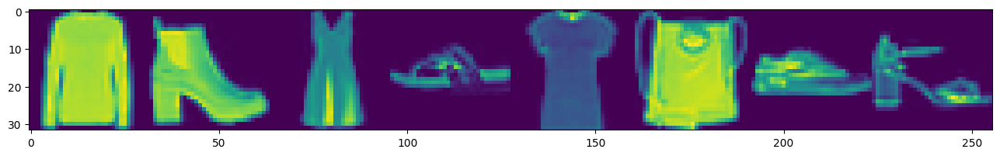

In [ ]:
def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),  
        transforms.Lambda(lambda t: (t * 2) - 1) 
    ]

    data_transform = transforms.Compose(data_transforms)

    data = torchvision.datasets.FashionMNIST(root=".", download=True, 
                                         train=True, transform=data_transform)
    return data


def plot_images(images):
    plt.figure(figsize=(16, 3))
    plt.imshow(torch.cat([
        torch.cat([i for i in images], dim=-1)
    ], dim=-2).permute(1, 2, 0).cpu())
    plt.show()


data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, 
                        shuffle=True, drop_last=True)
batch_x, batch_y = next(iter(dataloader))
plot_images(batch_x[:8])

## VAE (38 points)

VAE is a generative model consisting of an encoder network and a decoder network. The encoder maps the input data into a latent space, where the data is represented by probability distributions. A decoder network generates the output data from samples of the latent space.

VAE is trained using a variational inference approach, where the goal is to maximize the evidence lower bound (ELBO) of the log-likelihood of the data. The ELBO consists of two terms: the reconstruction loss, which measures how well the decoder can reconstruct the input data from the latent space, and the KL divergence between the prior (considered Gaussian) and posterior distributions over the latent space. The posterior distribution is usually considered Gaussian, and the encoder only tries to learn its mean and variance. Given the mean and the variance, one can use the reparameterization trick to sample from the encoder.

### ❓ **Question 1**
*(8 points)*
+ What is the reparameterization trick? How does it affect the sampling and the gradient backpropagation processes?
+ What are the advantages of VAEs over regular Autoencoders?



*   The reparameterization trick is a technique used to enable efficient sampling and gradient backpropagation during training. It addresses the challenge of estimating gradients in the presence of stochastic nodes, which are necessary for generating diverse samples.
  1.   Sampling: The reparameterization trick transforms the sampling process into a deterministic operation. It allows the network to sample latent variables by incorporating random noise while maintaining differentiability, enabling efficient gradient-based optimization.
  2.   Gradient backpropagation: the gradients can be computed with respect to the encoder parameters. The gradients flow through the encoder, decoder, and the reparameterization step, facilitating end-to-end training.


*   VAE have different advantages which I mention them bellow but, one of the main advantages over regular atuoencoders is VAE model can sample from embedded distribution so, they can generate new data from their distribiution.

  1.   Generative modeling: VAEs can generate new data samples
  2.   End-to-end training: VAEs can be trained using standard backpropagation algorithms, simplifying the training process and enabling joint optimization of the encoder and decoder networks.
  3.   Structured latent space: VAEs learn a structured and continuous latent space, allowing for better control and interpolation between samples.
  4.   Flexibility: VAEs can model complex distributions and capture non-linear and non-Gaussian latent spaces.

In [ ]:
class VariationalEncoder(nn.Module):
    def __init__(self, hidden_dim, latent_dim):
        super(VariationalEncoder, self).__init__()

        ##########################################################
        # TODO (4 points): 
        # Define your variational encoder layers. You may use 
        # linear layers, normalization layers, and activation layers. 
        ##########################################################
        self.latent_dim = latent_dim
        
        self.fc1 = nn.Linear(32 * 32, hidden_dim)
        self.fc2_mean = nn.Linear(hidden_dim, self.latent_dim)
        self.fc2_logvar = nn.Linear(hidden_dim, self.latent_dim)
        

    def forward(self, x):

        z = None
 
        ##########################################################
        # TODO (8 points): 
        # Convert `x` to the latent `z`. You should first calculate 
        # the mean and the variance for the current input `x` 
        # and then, sample a standard Gaussian noise. Finally convert 
        # the noise to `z` using the mean and the variance.
        ##########################################################

        x = x.view(-1, 32 * 32)
        h1 = F.relu(self.fc1(x))
        # h2 = F.relu(self.fc2(h1))
        mu = self.fc2_mean(h1)
        logvar = self.fc2_logvar(h1)

        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        z = mu + eps * std 

        return z, mu, logvar

class Decoder(nn.Module):
    def __init__(self, hidden_dim, latent_dim):
        super(Decoder, self).__init__()        
        
        ##########################################################
        # TODO (2 points): 
        # Define your decoder layers. You may use linear layers, 
        # normalization layers, and activation layers. 
        ##########################################################

        self.latent_dim = latent_dim
        
        self.fc1 = nn.Linear(self.latent_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, 32 * 32)
        
    def forward(self, z):

        img = None

        ##########################################################
        # TODO (2 points): 
        # Decode the latent vector `z` to images.
        ##########################################################

        z = F.relu(self.fc1(z))
        z = torch.tanh(self.fc2(z))
        return z
        
class VariationalAutoEncoder(nn.Module):
    def __init__(self, hidden_dim, latent_dims):
        super(VariationalAutoEncoder, self).__init__()

        ##########################################################
        # TODO (2 points): 
        # Instantiate the encoder and the decoder.
        ##########################################################

        self.encoder = VariationalEncoder(hidden_dim=hidden_dim, latent_dim=latent_dims)
        self.decoder = Decoder(hidden_dim=hidden_dim, latent_dim=latent_dims)

    def forward(self, x):
        z, mu, logvar = self.encoder(x)
        return self.decoder(z), mu, logvar

from torch.nn import functional as F

class VAEManager():
    def __init__(self, hidden_dim=256, latent_dims=20, lr=0.001):

        ##########################################################
        # TODO (1 points): 
        # Define the VAE and the optimizer. You can use Adam.
        ##########################################################
        self.latent_dims = latent_dims

        self.vae = VariationalAutoEncoder(hidden_dim, latent_dims).to(DEVICE)
        self.optimizer = optim.Adam(self.vae.parameters(), lr=lr)
    


    def loss_function(self, generated_x, x, mu, logvar):
      BCE = F.mse_loss(generated_x, x.view(-1, 1024), reduction='sum')
      KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

      return BCE + KLD

    def train(self, dataloader, **kwargs):

        history = dict(loss=[])
        for epoch in range(EPOCHS):
            total_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE) 

                ##########################################################
                # TODO (8 points): 
                # Calculate the loss.
                # Then, perform the optimization on `batch_x`.
                ##########################################################
                self.optimizer.zero_grad()
                generated_x, mu, logvar = self.vae(batch_x)
                loss = self.loss_function(generated_x, batch_x, mu, logvar)
                loss = loss / batch_x.shape[0]

                loss.backward()
                total_loss.append(loss.item())

                self.optimizer.step()

            mean_loss = np.mean(total_loss)

            print(
                "[Epoch: %d/%d] [loss: %.4f]"
                % (epoch+1, EPOCHS, mean_loss)
            )

            self.sample(8, plot=True)

            history['loss'].append(mean_loss)

        return history

    def sample(self, n, plot=True):

        ##########################################################
        # TODO (3 points): 
        # Interpolate between two randomly chosen points in the latent space,
        # and choose `n` equally-distant latent points between the random points.
        # You should save an array of random latent points in `zs`.
        ##########################################################

        a = torch.randn(self.latent_dims).to(DEVICE)
        b = torch.randn(self.latent_dims).to(DEVICE)
        diff = (b - a) / (n - 1)
        zs = []
        for i in range(n):
          zs.append(a + i * diff)
        print("Hamidreza")
        with torch.no_grad():
            first_image = self.vae.decoder(zs[0])
            images = torch.cat([self.vae.decoder(z).view(-1, 1, 32, 32) for z in zs], dim=0).detach()
            if plot:
                plot_images(images)
            return images

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/40] [loss: 233.7259]
Hamidreza


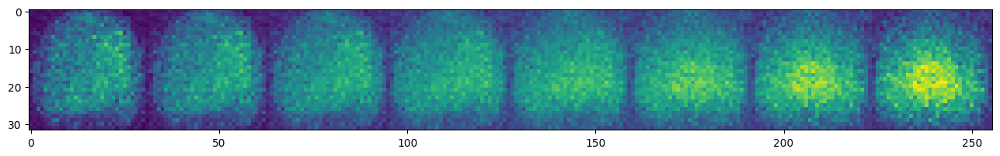

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/40] [loss: 108.0888]
Hamidreza


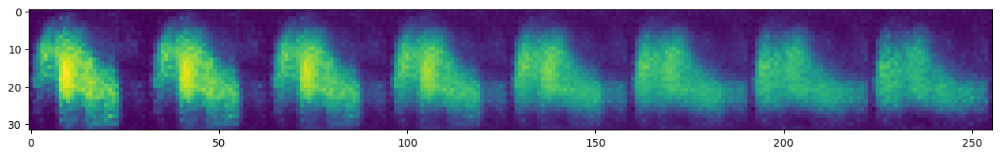

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/40] [loss: 92.9813]
Hamidreza


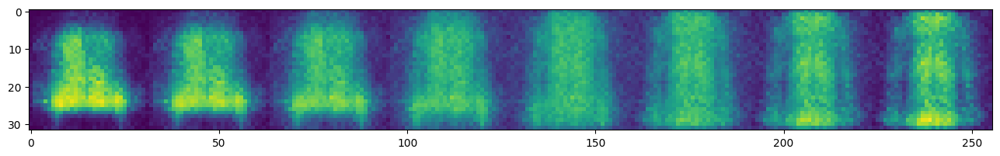

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/40] [loss: 85.9420]
Hamidreza


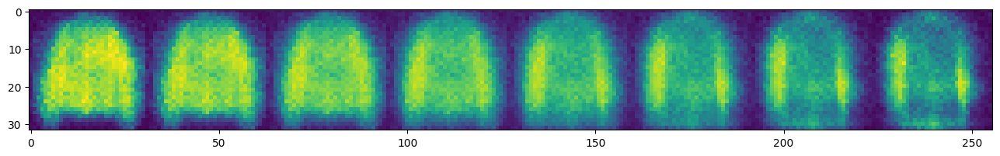

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/40] [loss: 81.3957]
Hamidreza


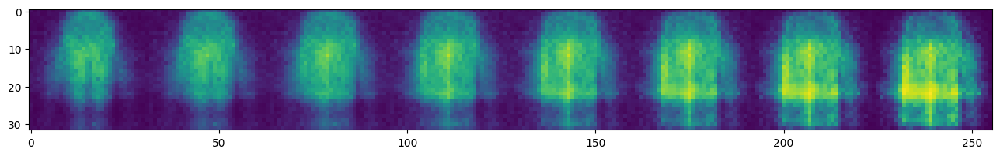

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/40] [loss: 78.1720]
Hamidreza


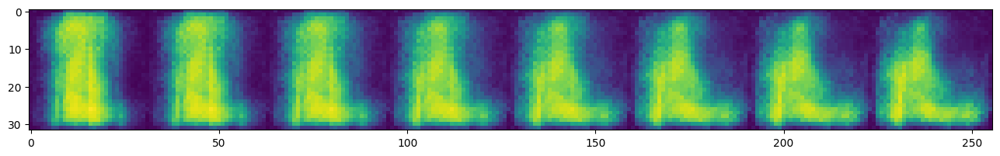

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/40] [loss: 75.7061]
Hamidreza


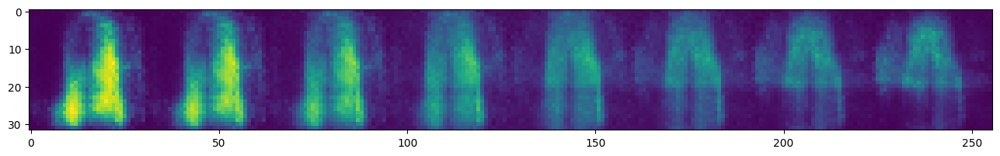

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/40] [loss: 73.8879]
Hamidreza


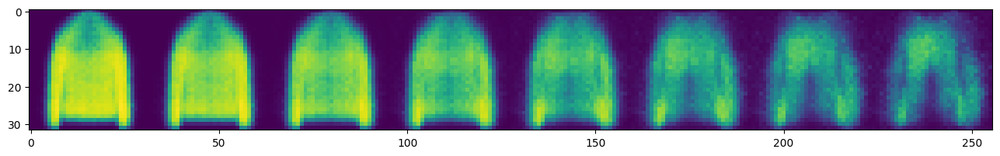

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/40] [loss: 72.2837]
Hamidreza


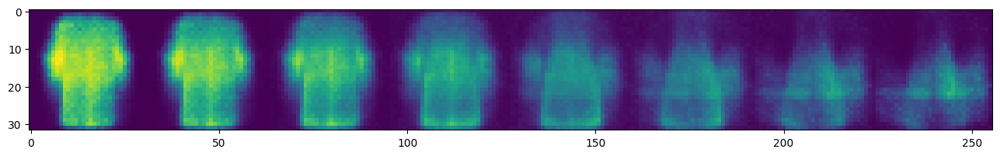

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/40] [loss: 71.2035]
Hamidreza


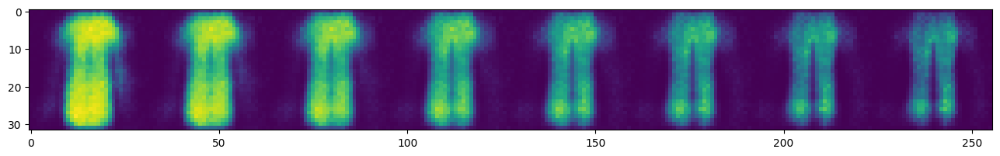

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/40] [loss: 70.0895]
Hamidreza


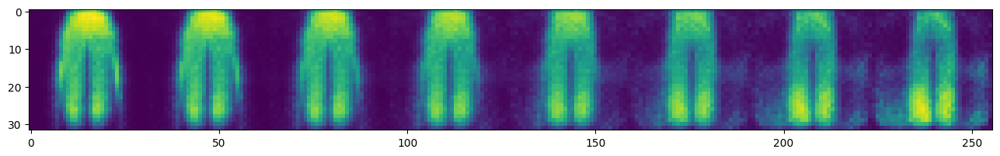

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/40] [loss: 69.1922]
Hamidreza


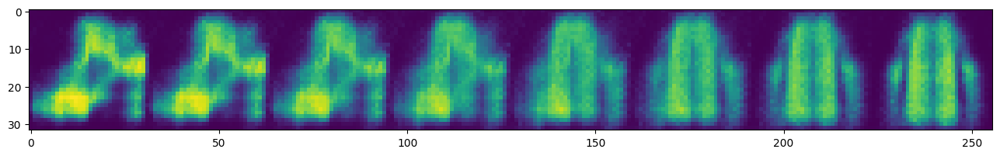

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/40] [loss: 68.4047]
Hamidreza


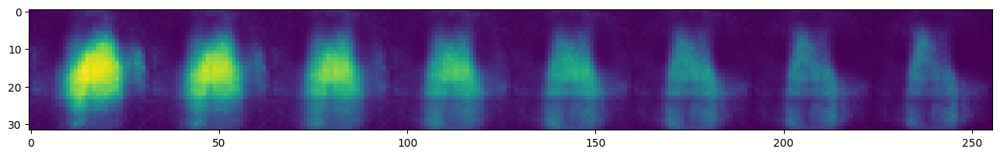

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/40] [loss: 67.8240]
Hamidreza


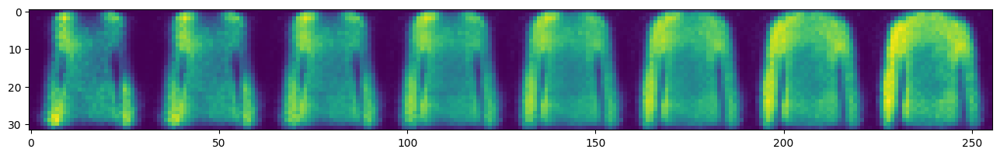

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/40] [loss: 67.2434]
Hamidreza


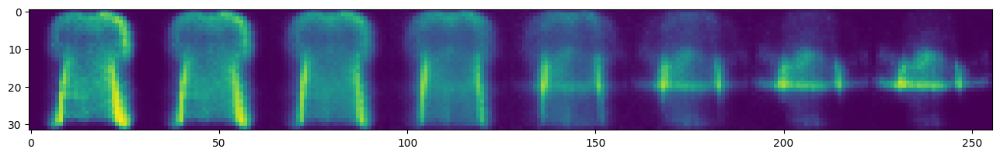

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/40] [loss: 66.7103]
Hamidreza


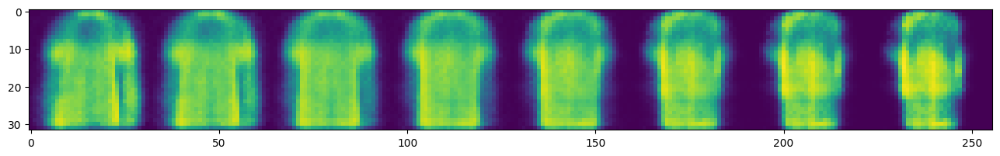

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/40] [loss: 66.2160]
Hamidreza


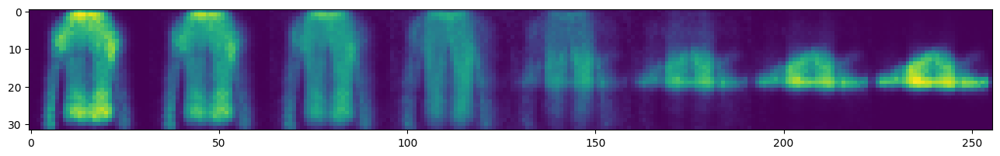

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/40] [loss: 65.7799]
Hamidreza


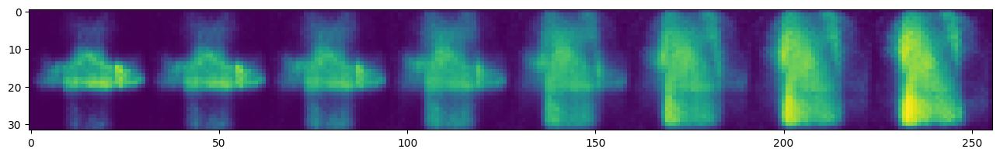

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/40] [loss: 65.5117]
Hamidreza


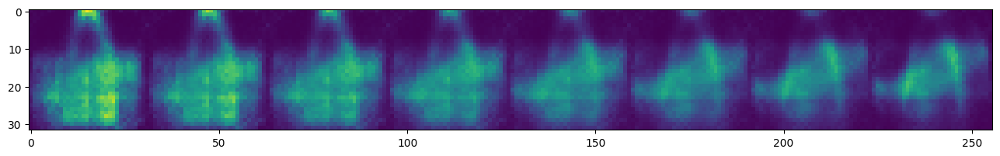

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/40] [loss: 65.1294]
Hamidreza


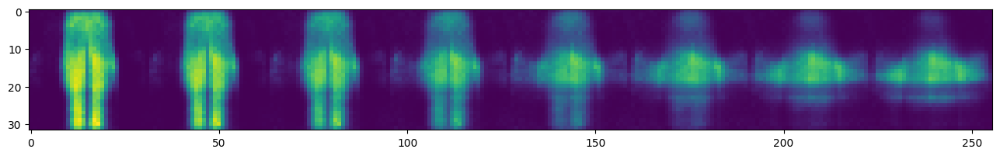

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/40] [loss: 64.7853]
Hamidreza


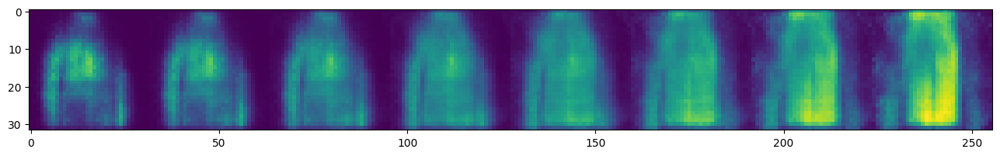

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/40] [loss: 64.4314]
Hamidreza


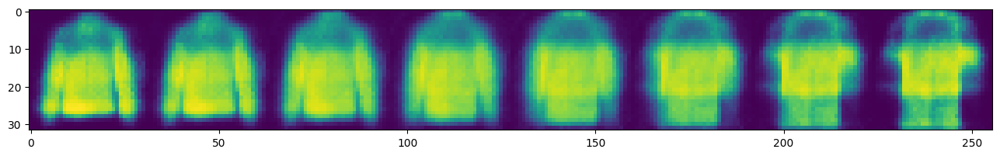

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/40] [loss: 64.1241]
Hamidreza


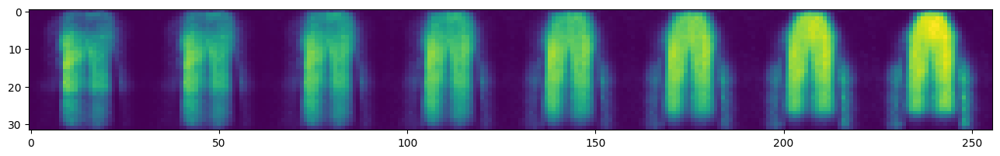

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/40] [loss: 63.7735]
Hamidreza


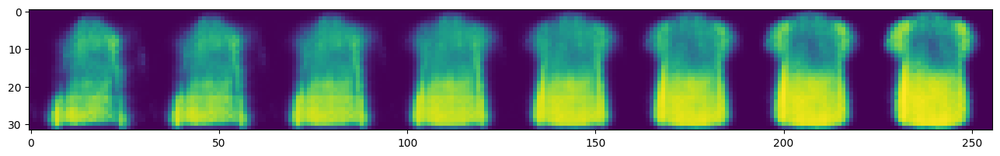

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/40] [loss: 63.5505]
Hamidreza


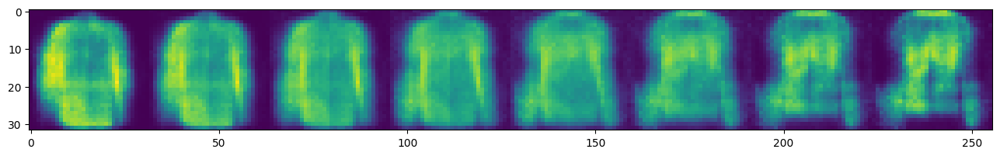

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/40] [loss: 63.4246]
Hamidreza


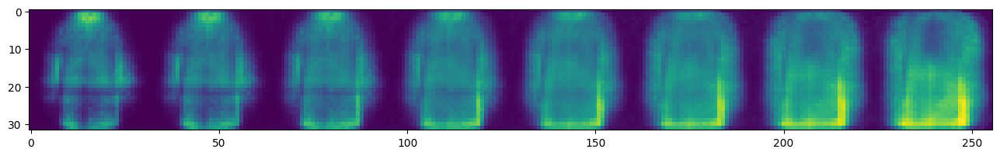

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/40] [loss: 63.1042]
Hamidreza


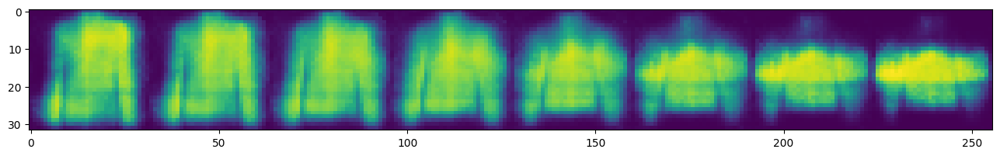

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/40] [loss: 62.9160]
Hamidreza


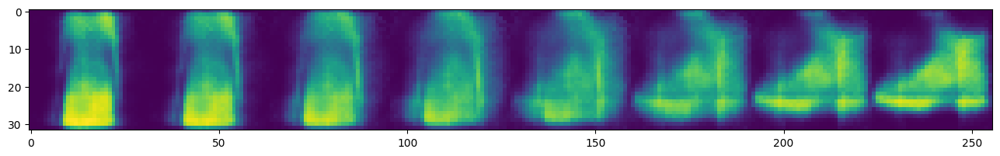

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/40] [loss: 62.6296]
Hamidreza


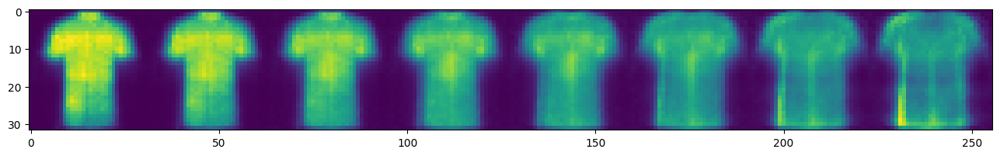

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/40] [loss: 62.4409]
Hamidreza


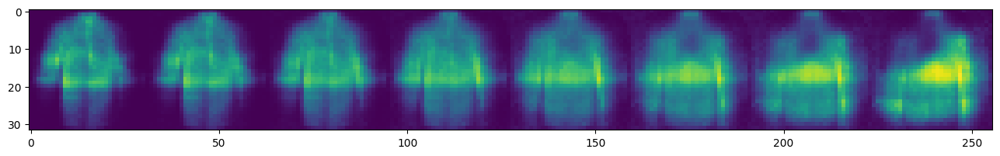

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/40] [loss: 62.1964]
Hamidreza


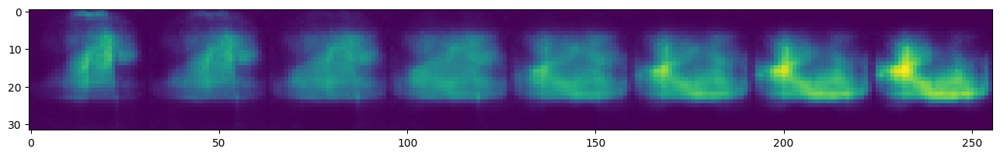

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/40] [loss: 62.0698]
Hamidreza


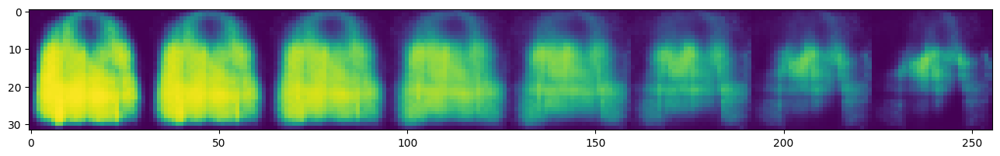

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/40] [loss: 61.9481]
Hamidreza


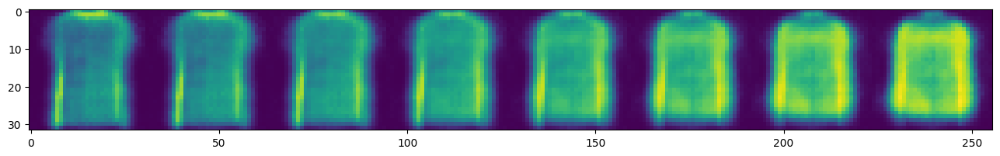

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/40] [loss: 61.8155]
Hamidreza


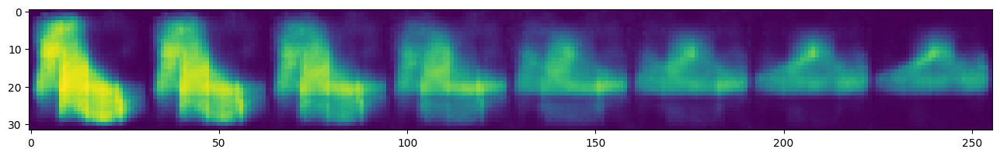

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/40] [loss: 61.6101]
Hamidreza


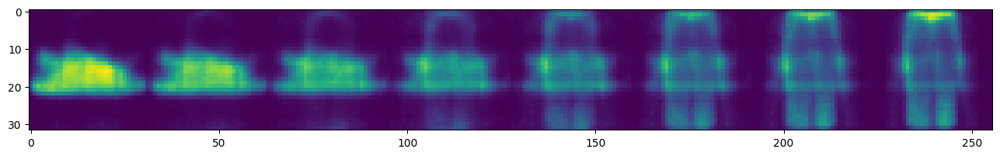

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/40] [loss: 61.5416]
Hamidreza


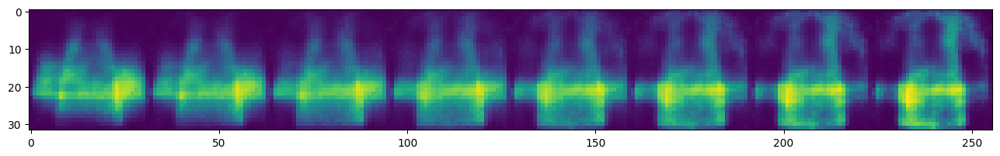

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/40] [loss: 61.3089]
Hamidreza


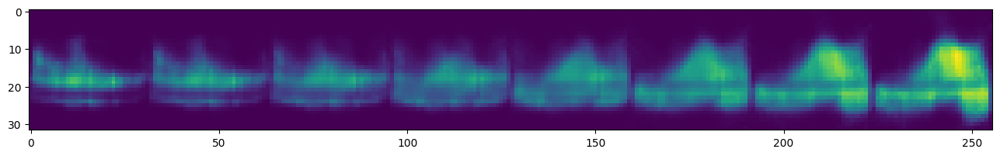

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/40] [loss: 61.2262]
Hamidreza


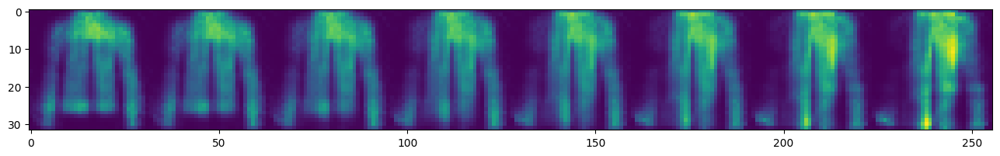

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/40] [loss: 61.0667]
Hamidreza


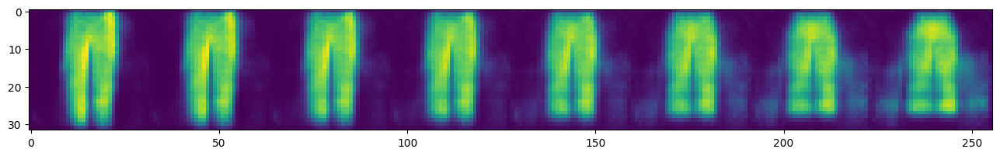

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/40] [loss: 60.9494]
Hamidreza


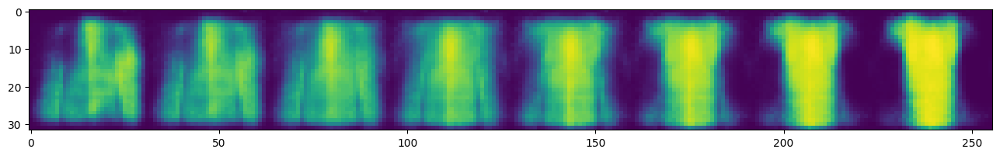

{'loss': [233.7259405728044,
  108.08879852294922,
  92.98127365112305,
  85.94202844027815,
  81.39574905921673,
  78.17197576062432,
  75.70609980616076,
  73.88792998215249,
  72.28365970480031,
  71.2035175191945,
  70.08948069605334,
  69.1922316715635,
  68.4047280673323,
  67.82402854130186,
  67.24339123429924,
  66.71026203550142,
  66.21598763301455,
  65.77991321169097,
  65.51171927616514,
  65.12940367336931,
  64.78527779414736,
  64.43137116267764,
  64.12412722357388,
  63.77348643335803,
  63.55049277996195,
  63.42461165066423,
  63.10421647696659,
  62.91596096959607,
  62.629609009315224,
  62.44088449149296,
  62.196383969537145,
  62.069798568199424,
  61.948078615912074,
  61.81552860654634,
  61.61011557743467,
  61.5415820417733,
  61.30891563152445,
  61.2261795833193,
  61.066650390625,
  60.94944283057903]}

In [ ]:
vae = VAEManager(hidden_dim=256, latent_dims=20, lr=0.001) # You can pass your arguments to the call.
vae_history = vae.train(dataloader)
vae_history

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/50] [loss: 232.7062]
Hamidreza


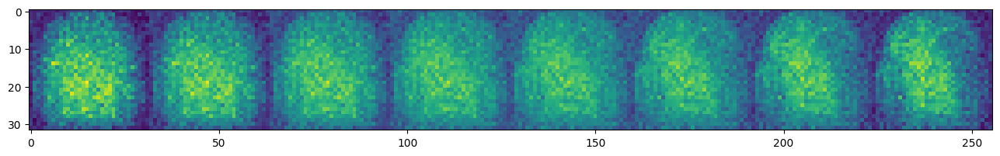

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/50] [loss: 109.3279]
Hamidreza


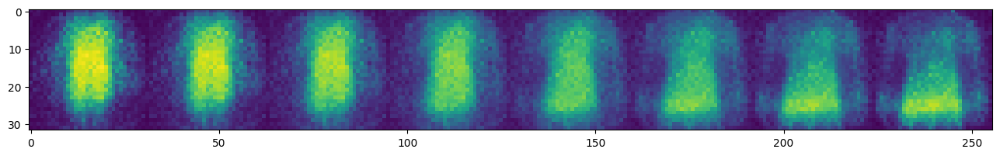

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/50] [loss: 93.6525]
Hamidreza


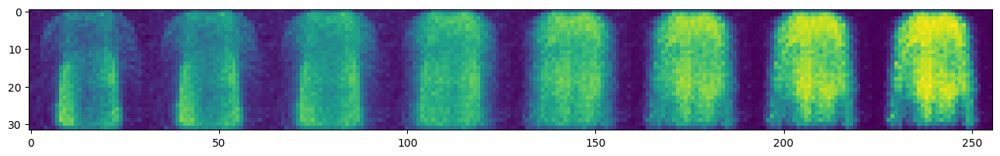

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/50] [loss: 86.3993]
Hamidreza


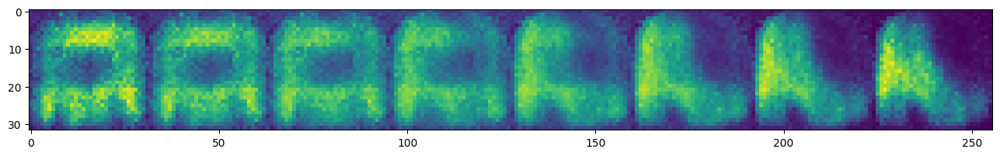

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/50] [loss: 81.6998]
Hamidreza


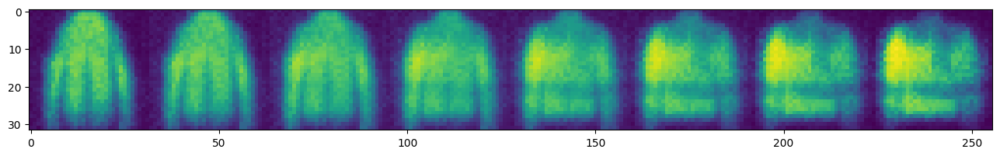

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/50] [loss: 78.2324]
Hamidreza


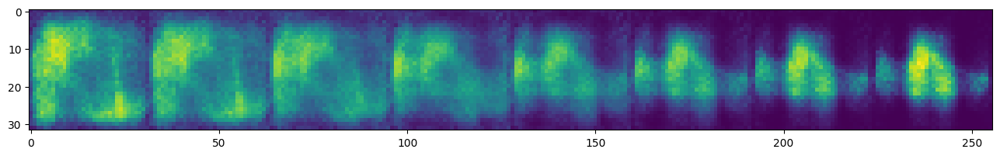

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/50] [loss: 75.7479]
Hamidreza


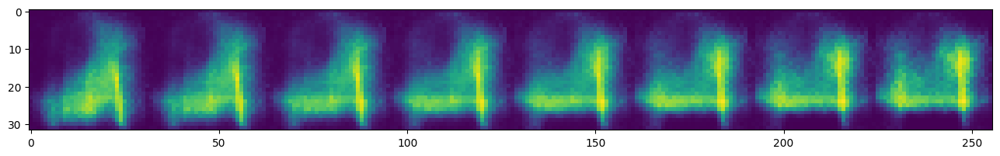

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/50] [loss: 73.7233]
Hamidreza


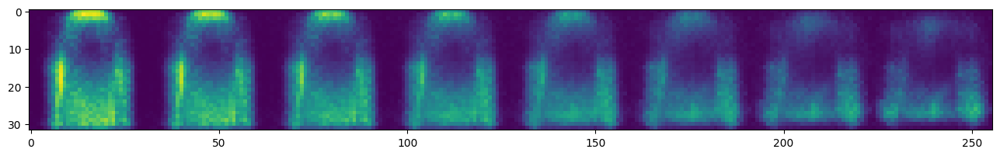

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/50] [loss: 72.2259]
Hamidreza


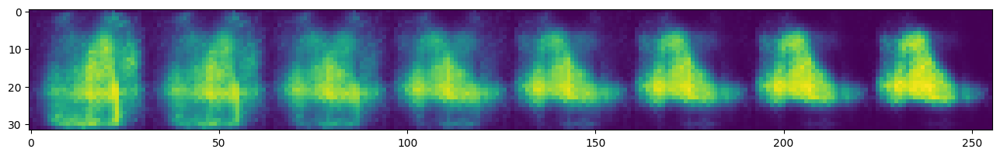

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/50] [loss: 71.0820]
Hamidreza


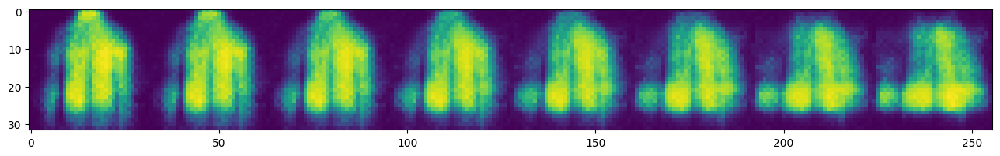

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/50] [loss: 70.0513]
Hamidreza


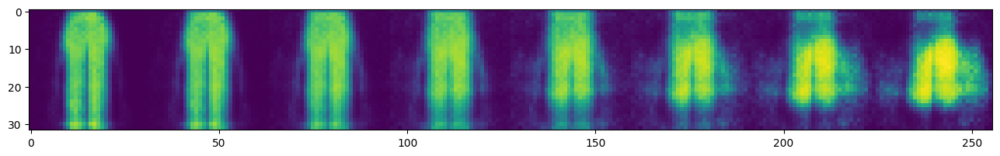

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/50] [loss: 69.1584]
Hamidreza


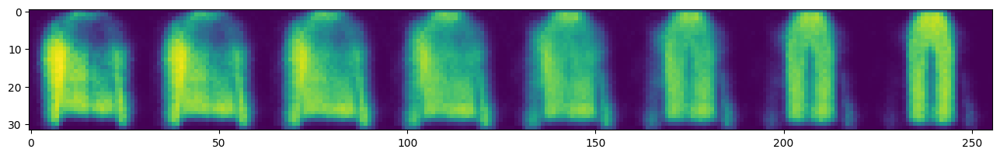

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/50] [loss: 68.4068]
Hamidreza


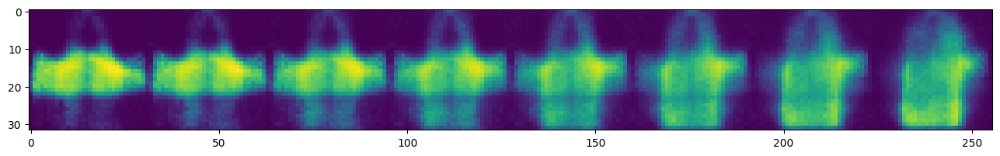

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/50] [loss: 67.7319]
Hamidreza


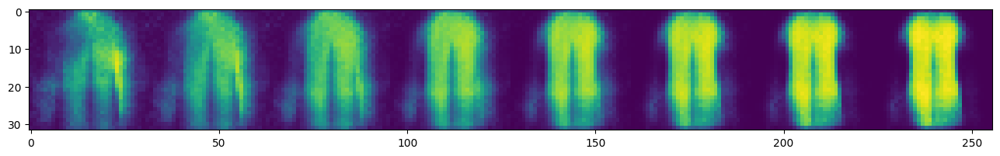

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/50] [loss: 67.1337]
Hamidreza


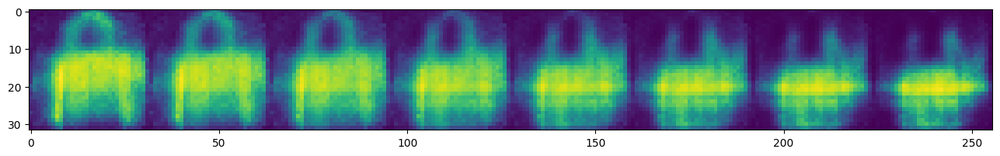

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/50] [loss: 66.7220]
Hamidreza


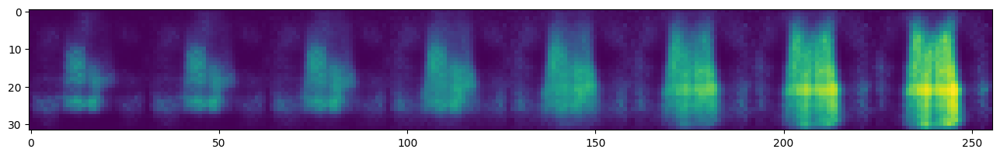

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/50] [loss: 66.2224]
Hamidreza


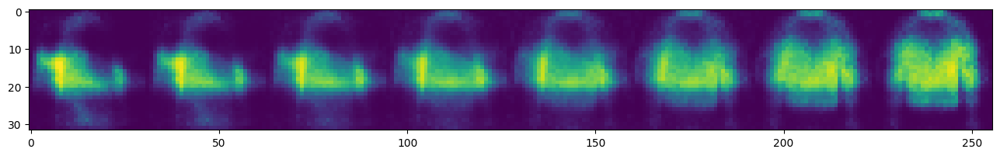

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/50] [loss: 65.8387]
Hamidreza


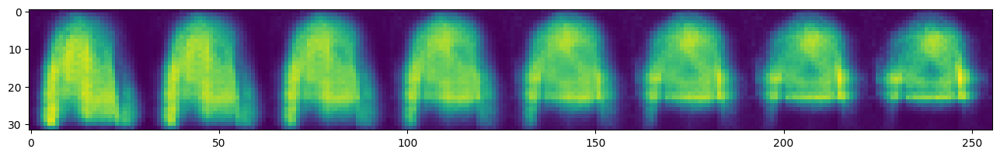

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/50] [loss: 65.4495]
Hamidreza


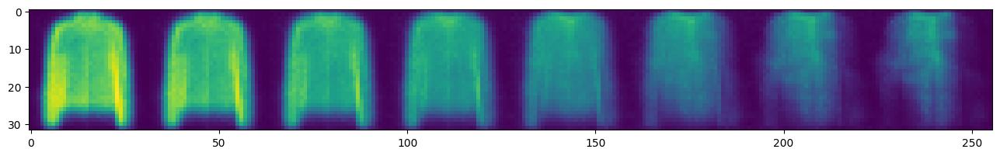

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/50] [loss: 65.1662]
Hamidreza


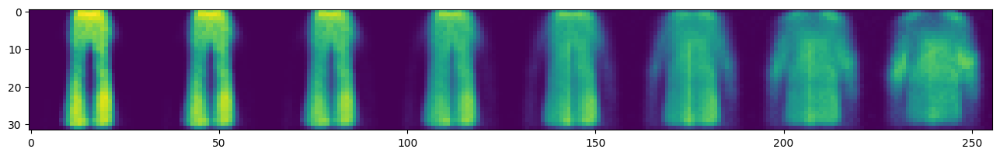

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/50] [loss: 64.6525]
Hamidreza


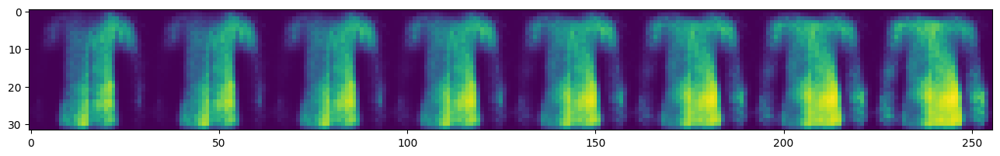

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/50] [loss: 64.3752]
Hamidreza


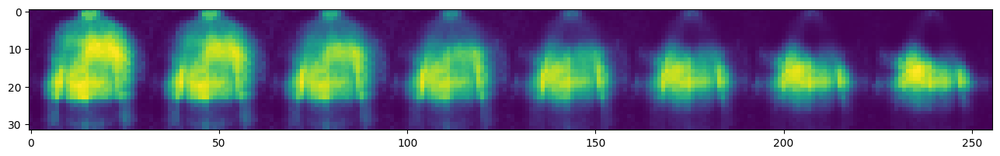

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/50] [loss: 64.1021]
Hamidreza


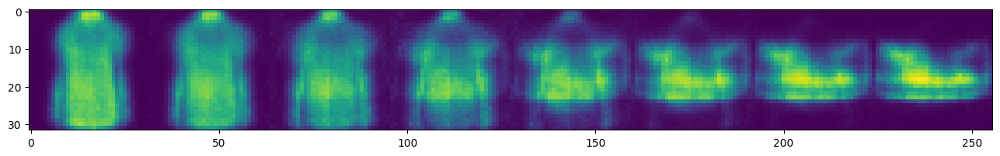

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/50] [loss: 63.8532]
Hamidreza


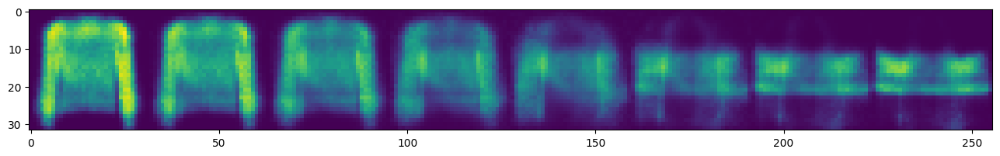

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/50] [loss: 63.5501]
Hamidreza


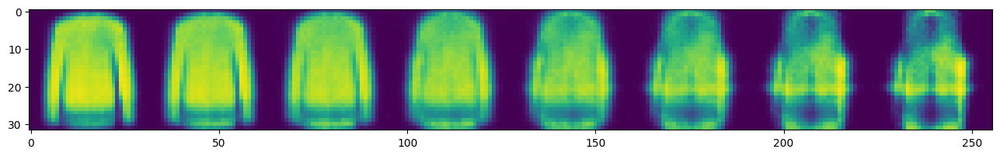

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/50] [loss: 63.3414]
Hamidreza


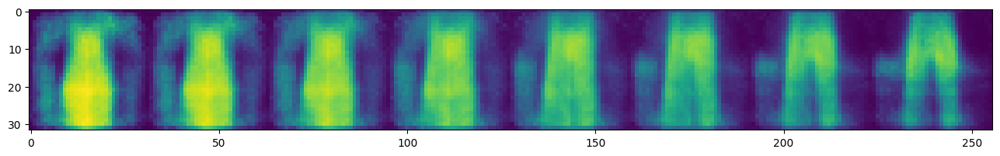

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/50] [loss: 63.1147]
Hamidreza


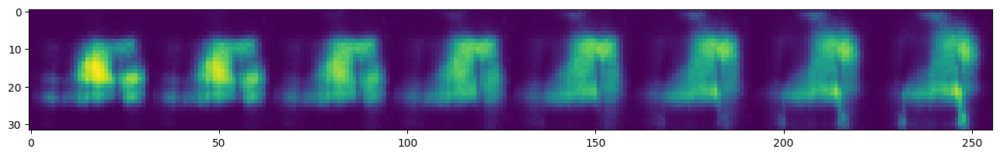

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/50] [loss: 62.9610]
Hamidreza


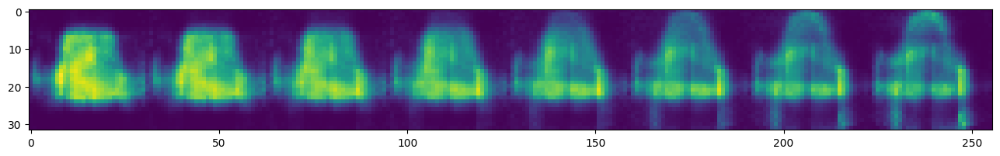

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/50] [loss: 62.6424]
Hamidreza


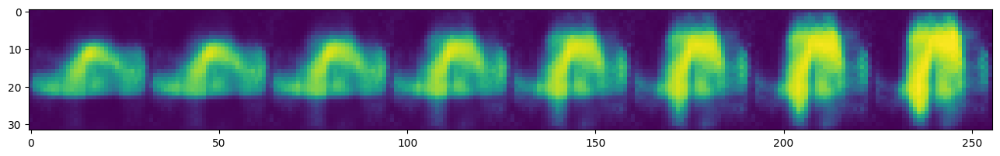

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/50] [loss: 62.5212]
Hamidreza


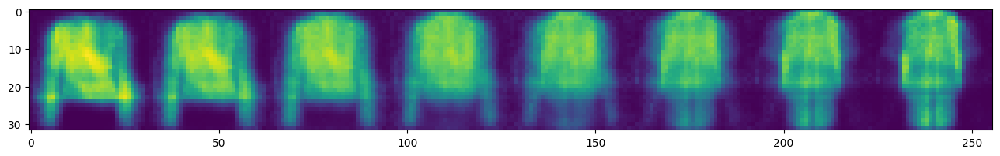

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/50] [loss: 62.3598]
Hamidreza


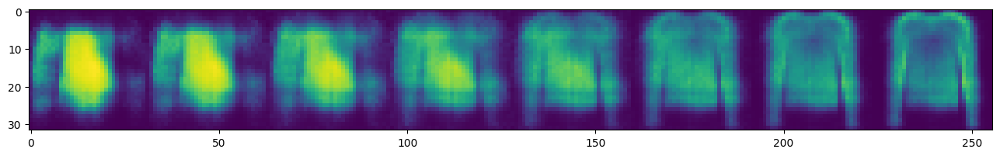

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/50] [loss: 62.2092]
Hamidreza


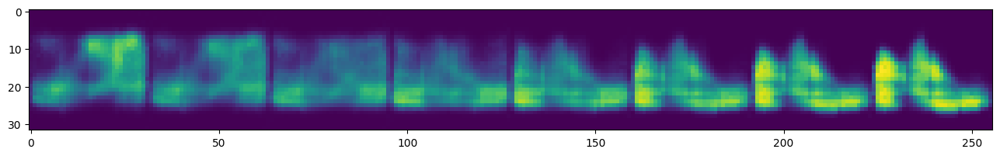

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/50] [loss: 61.9701]
Hamidreza


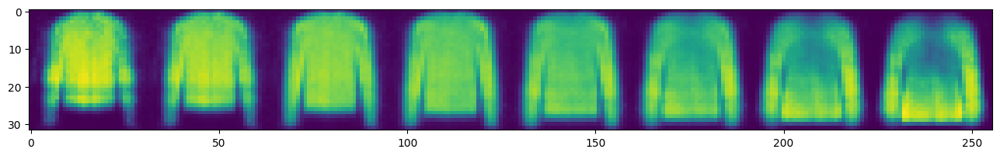

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/50] [loss: 61.7780]
Hamidreza


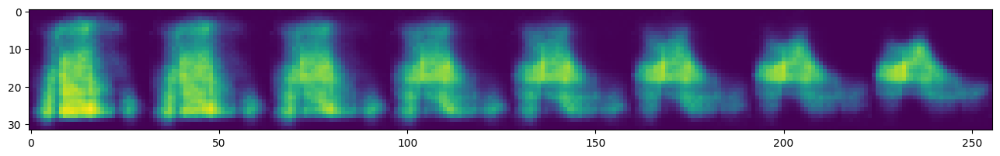

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/50] [loss: 61.6001]
Hamidreza


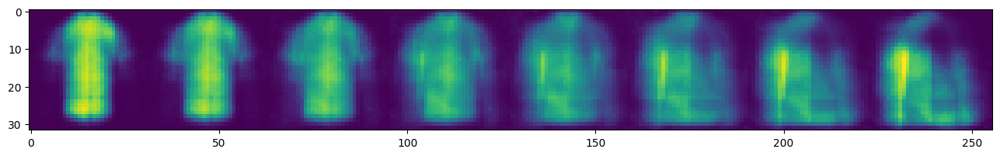

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/50] [loss: 61.4578]
Hamidreza


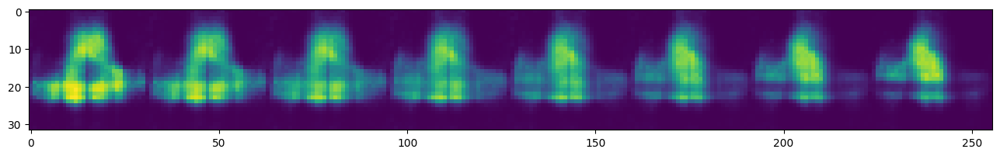

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/50] [loss: 61.3475]
Hamidreza


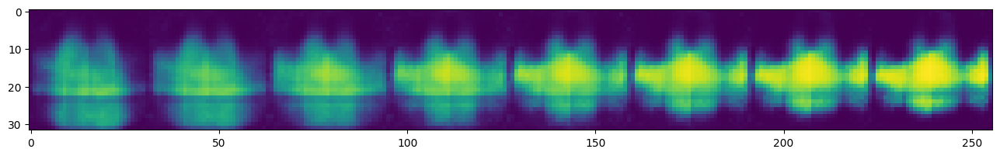

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/50] [loss: 61.3684]
Hamidreza


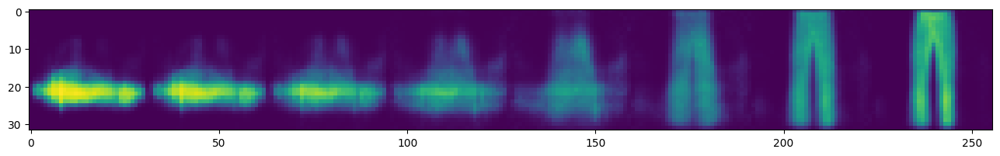

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/50] [loss: 61.2123]
Hamidreza


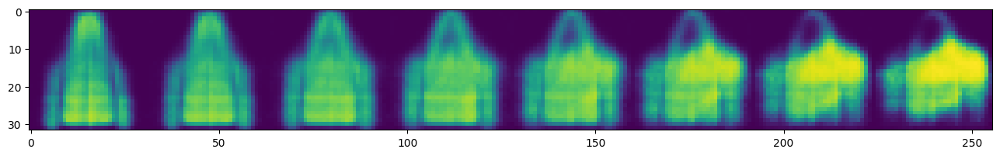

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/50] [loss: 61.0509]
Hamidreza


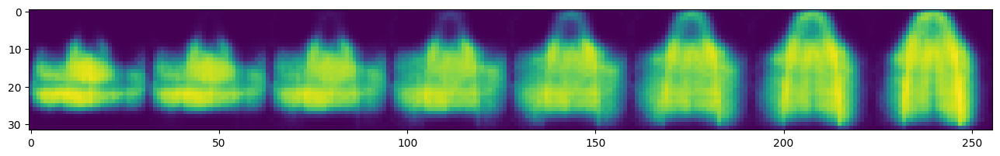

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 41/50] [loss: 60.8729]
Hamidreza


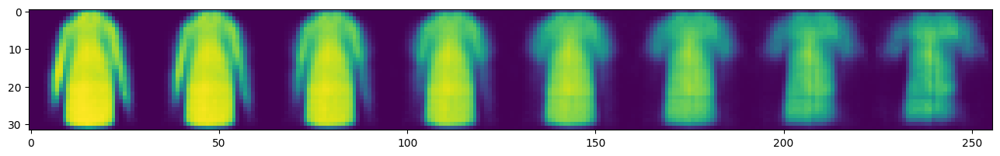

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 42/50] [loss: 60.7816]
Hamidreza


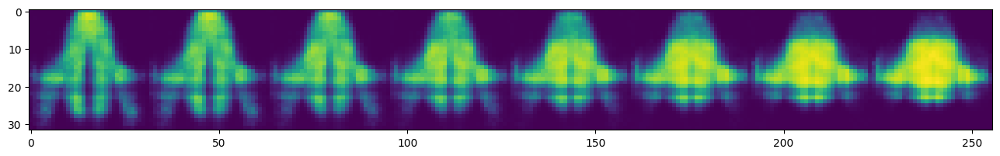

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 43/50] [loss: 60.7823]
Hamidreza


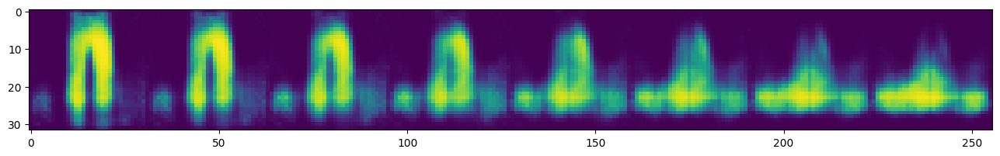

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 44/50] [loss: 60.5408]
Hamidreza


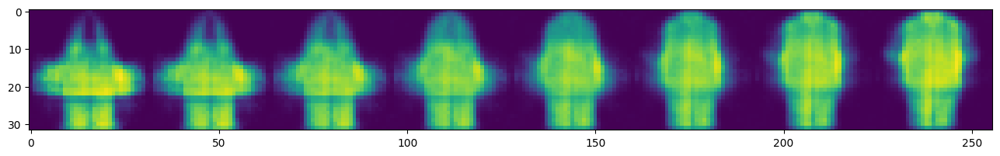

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 45/50] [loss: 60.4351]
Hamidreza


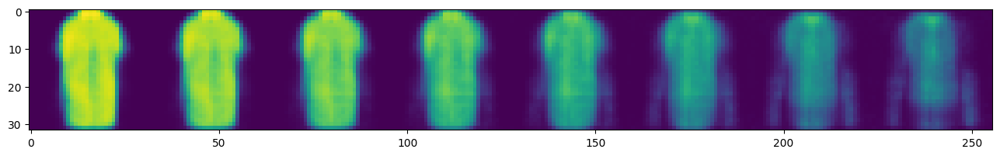

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 46/50] [loss: 60.3590]
Hamidreza


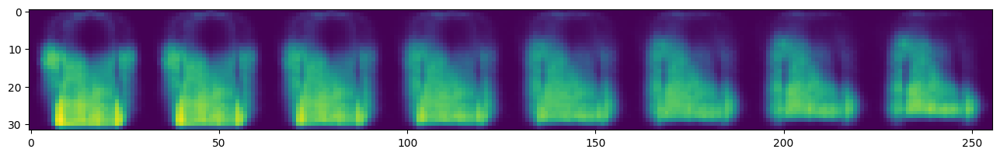

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 47/50] [loss: 60.2061]
Hamidreza


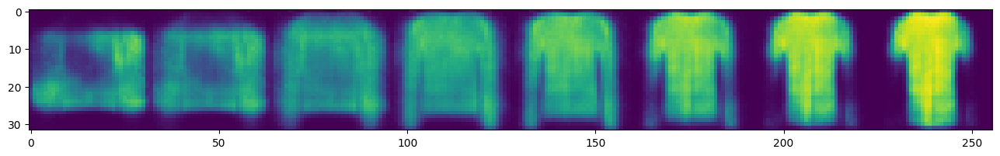

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 48/50] [loss: 60.1863]
Hamidreza


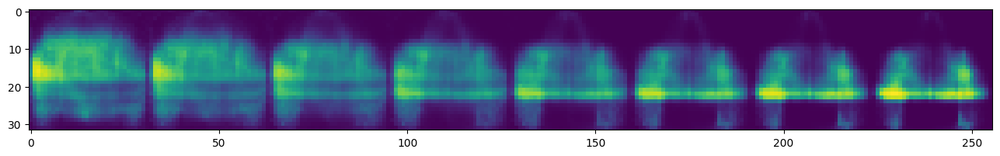

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 49/50] [loss: 60.0706]
Hamidreza


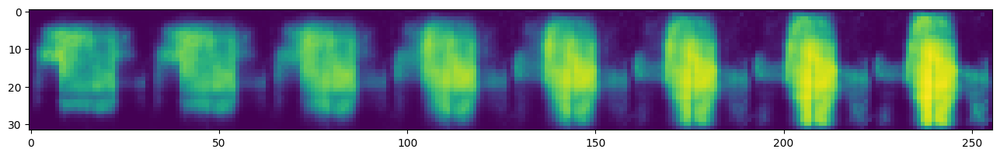

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 50/50] [loss: 60.0382]
Hamidreza


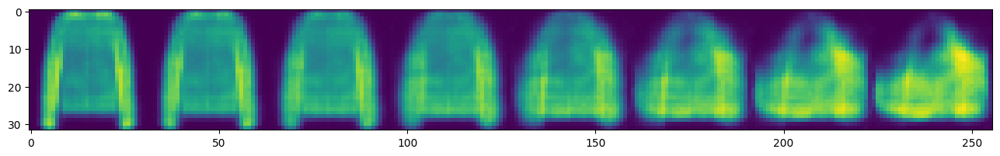

In [ ]:
vae = VAEManager(hidden_dim=256, latent_dims=20, lr=0.001) # You can pass your arguments to the call.
vae_history = vae.train(dataloader)

## GAN (39 + 15 points)

GAN's architecture consists of a Discriminator and a Generator. The Discriminator identifies whether an input image ($x$) is real or generated by the Generator. The Generator tries to create fake images given a random noise ($z$) such that the Discriminator can not distinguish them from the real images. These functionalities give rise to an adversarial situation where these networks can be seen as players. Thus, the standard loss for GAN is the following min-max loss. The Generator tries to minimize it, while the Discriminator tries to maximize it.

$$ \min_{\theta_g} \max_{\theta_d} E_{x \sim p_{data}}[log(D_{\theta_d}(x)] + E_{z \sim p(z)}[log(1 - D_{\theta_d}(G_{\theta_g}(z)))] $$

We try to optimize this loss function by alternating between the following objectives for the Discriminator and the Generator:
+ Discriminator's objective:
 $$ \max_{\theta_d} E_{x \sim p_{data}}[log(D_{\theta_d}(x)] + E_{z \sim p(z)}[log(1 - D_{\theta_d}(G_{\theta_g}(z)))] $$
+ Generator's objective:
$$ \min_{\theta_g} E_{z \sim p(z)}[log(1 - D_{\theta_d}(G_{\theta_g}(z)))] $$

Each player’s cost depends on the parameters of the other player. However, each
player can only optimize its own parameters.

### ❓ **Question 2**
*(8 points)*
> What are the challenges in this optimization process? How do they address each of these challenges?

GAN model has several issues like gradient vanishing and instability.GAN optimization is a complex and challenging task that requires careful consideration of the trade-offs between different techniques and the properties of the generated samples.

I mentioned some challenges and the common way to address them below:


1.   **Vanishing gradients:** Vanishing gradients: As the generator and discriminator networks become deeper, the gradients can become small and cause the network to converge to a suboptimal solution. ***To address this challenge*** => use different activation functions, normalization techniques such as Batch Normalization, and designing the network to have skip connections.
2.   **Mode collapse:** a common problem in GANs where the generator produces limited variations of the same output, ignoring the full range of possible outputs. ***To address this challenge*** => adding noise to the input, using Wasserstein GANs, incorporating diversity-promoting objectives.
3.   **Unstable training:** GANs' training process can be unstable, causing the network to oscillate between different solutions. ***To address this challenge*** => regularization techniques, different optimization methods, and progressive training.

In summary, the GAN model has several challenges, some are common in generative models like we don't have ground truth to evaluate the output (like the previous VAE model), and some are challenging when we design the GAN model like what I mentioned above. there are many techniques and other types of GAN models (like DCGAN and ...) that are proposed to have better quality and overcome these challenges.

### Model-1: Using Convolution in GAN


In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim=100, image_size=32, hidden_channel=128):
        super(Generator, self).__init__()

        ##########################################################
        # TODO (2 points): 
        # Define the generator model here. You may use linear layers, 
        # normalization layers, and activation layers.  
        ##########################################################
        self.z_dim = z_dim
        self.image_size = image_size
        self.hidden_channel = hidden_channel

        self.fc_net = nn.Sequential(
            nn.Linear(z_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Linear(1024, self.hidden_channel * (self.image_size // 4) * (self.image_size // 4)),
            nn.BatchNorm1d(self.hidden_channel * (self.image_size // 4) * (self.image_size // 4)),
            nn.ReLU(),
        )

        self.conv_net = nn.Sequential(
            nn.ConvTranspose2d(self.hidden_channel, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 1, 4, 2, 1),
            nn.Tanh(),
        )

        

    def forward(self, z): 

        img = None

        ##########################################################
        # TODO (2 points): 
        # Generate images from the random noise `z`.
        ##########################################################

        z = self.fc_net(z)
        img = z.view(-1, self.hidden_channel, (self.image_size // 4), (self.image_size // 4))
        img = self.conv_net(img)
        return img

class Discriminator(nn.Module):
    def __init__(self, image_size=32):
        super(Discriminator, self).__init__()
        
        ##########################################################
        # TODO (2 points): 
        # Define the Discriminator model here. You may use linear 
        # layers, normalization layers, and activation layers.  
        ##########################################################
        self.image_size = image_size

        self.conv_net = nn.Sequential(
            nn.Conv2d(1, 64, 4, 2, 1),
            nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
        )

        self.fc_net = nn.Sequential(
            nn.Linear(128 * (self.image_size // 4) * (self.image_size // 4), 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 1),
            nn.Sigmoid(),
        )

    def forward(self, x):

        real_or_fake = None

        ##########################################################
        # TODO (2 points): 
        # Predict whether each image in `img` is real or fake.
        ##########################################################
        x = self.conv_net(x)
        x = x.view(-1, 128 * (self.image_size // 4) * (self.image_size // 4))
        real_or_fake = self.fc_net(x)

        return real_or_fake

class GANManager():
    def __init__(self, image_size=32, z_dim=100):
        
        ##########################################################
        # TODO (3 points): 
        # 1) Instantiate the Generator and the Discriminator.
        # 2) Define your optimizer(s). You can use Adam.
        ##########################################################

        self.image_size = image_size
        self.z_dim = z_dim

        self.generator = Generator(z_dim=self.z_dim, image_size=image_size).to(DEVICE)
        self.discriminator = Discriminator(image_size=image_size).to(DEVICE)

        self.G_optimizer = optim.Adam(self.generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.D_optimizer = optim.Adam(self.discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

        self.BCE_loss = nn.BCELoss()

    def train(self, dataloader, **kwargs):

        history = dict(g_loss=[], d_loss=[])
        for epoch in range(EPOCHS):
            total_g_loss = []
            total_d_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)

                ##########################################################
                # TODO (15 points): 
                # Calculate the loss for the Generator and the Discriminator.
                # Perform the optimization on `batch_x`.
                ##########################################################

                #init 
                batch_size = batch_x.shape[0]
                y_real = torch.ones(batch_size, 1).to(DEVICE)
                y_fake = torch.zeros(batch_size, 1).to(DEVICE)
                z = torch.randn(batch_size, self.z_dim).to(DEVICE)


                self.D_optimizer.zero_grad()
                #train descriminator with real
                D_real = self.discriminator(batch_x)
                D_real_loss = self.BCE_loss(D_real, y_real)
                #train descriminator with fake
                generated = self.generator(z)
                D_fake = self.discriminator(generated)
                D_fake_loss = self.BCE_loss(D_fake, y_fake)

                discriminator_loss = D_real_loss + D_fake_loss
                total_d_loss.append(discriminator_loss.item())
                discriminator_loss.backward()
                self.D_optimizer.step()


                self.G_optimizer.zero_grad()
                #train the generator
                generated = self.generator(z)
                D_fake = self.discriminator(generated)
                generator_loss = self.BCE_loss(D_fake, y_real)
                total_g_loss.append(generator_loss.item())

                generator_loss.backward()
                self.G_optimizer.step()
                


            mean_d_loss = np.mean(total_d_loss)
            mean_g_loss = np.mean(total_g_loss)

            print(
                "[Epoch: %d/%d] [D loss: %.4f] [G loss: %.4f]"
                % (epoch+1, EPOCHS, mean_d_loss, mean_g_loss)
            )
            
            self.sample(8, plot=True)

            history['d_loss'].append(mean_d_loss)
            history['g_loss'].append(mean_g_loss)

        return history

    def sample(self, n, plot=True):

        ##########################################################
        # TODO (1 points): 
        # First, assign proper Gaussian noises to `z`.
        # Then, use can see that by using the Generator, we can
        # make new images and plot them.
        ##########################################################

        z = torch.randn(n, self.z_dim).to(DEVICE)
        with torch.no_grad():
            gen_imgs = self.generator(z)
            print(gen_imgs.shape)
            if plot:
                plot_images(gen_imgs)
            return gen_imgs

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/40] [D loss: 1.1034] [G loss: 0.9273]
torch.Size([8, 1, 32, 32])


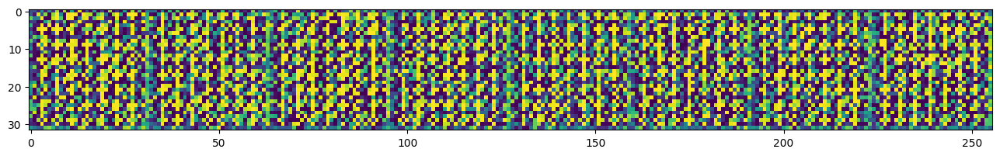

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/40] [D loss: 0.7453] [G loss: 1.2839]
torch.Size([8, 1, 32, 32])


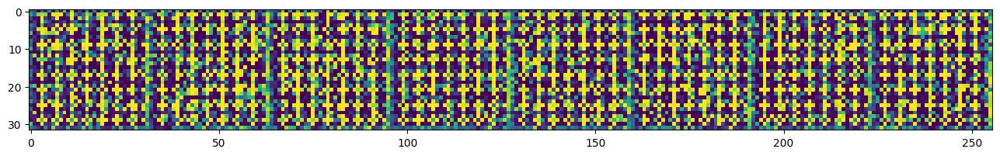

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/40] [D loss: 0.5968] [G loss: 1.6021]
torch.Size([8, 1, 32, 32])


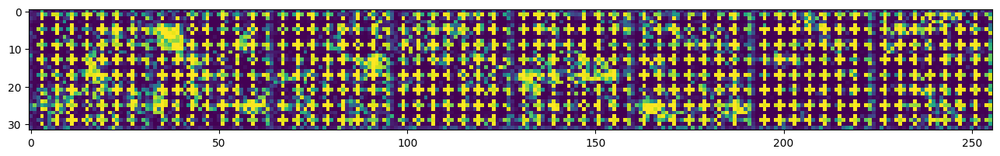

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/40] [D loss: 0.6371] [G loss: 1.7343]
torch.Size([8, 1, 32, 32])


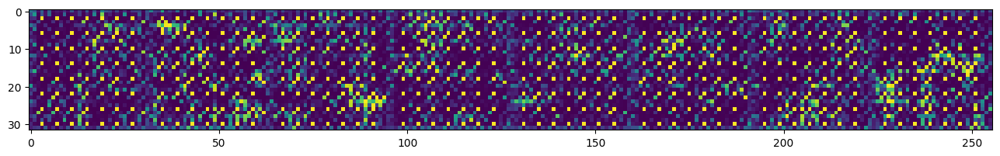

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/40] [D loss: 0.4351] [G loss: 1.9160]
torch.Size([8, 1, 32, 32])


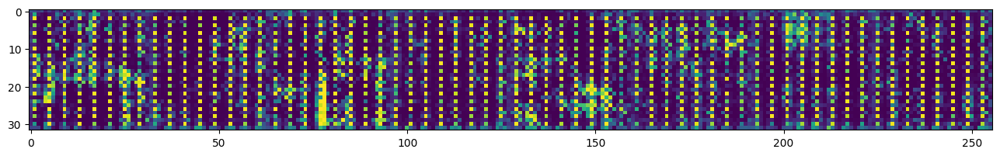

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/40] [D loss: 0.4447] [G loss: 1.9952]
torch.Size([8, 1, 32, 32])


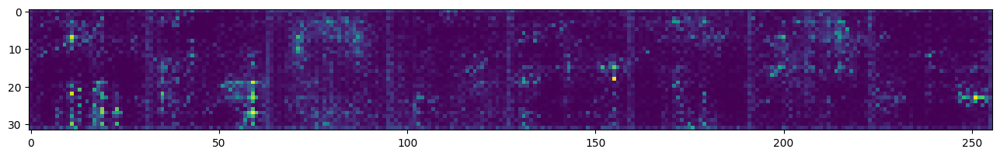

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/40] [D loss: 0.6639] [G loss: 1.8152]
torch.Size([8, 1, 32, 32])


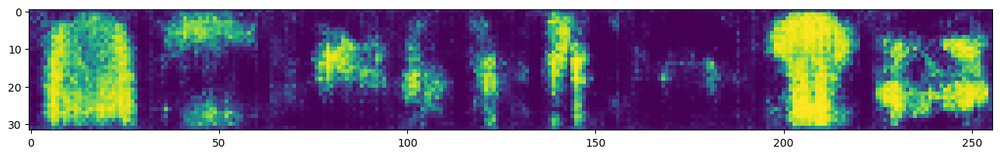

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/40] [D loss: 0.8671] [G loss: 1.4263]
torch.Size([8, 1, 32, 32])


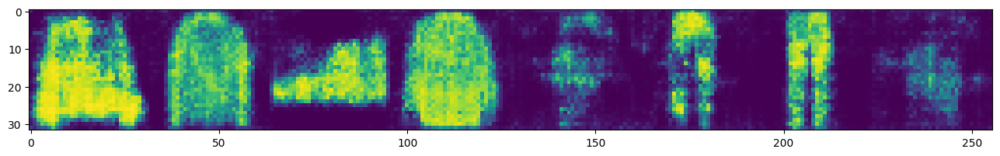

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/40] [D loss: 0.9165] [G loss: 1.3723]
torch.Size([8, 1, 32, 32])


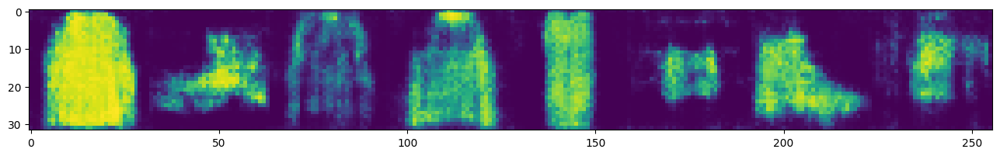

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/40] [D loss: 0.8932] [G loss: 1.4132]
torch.Size([8, 1, 32, 32])


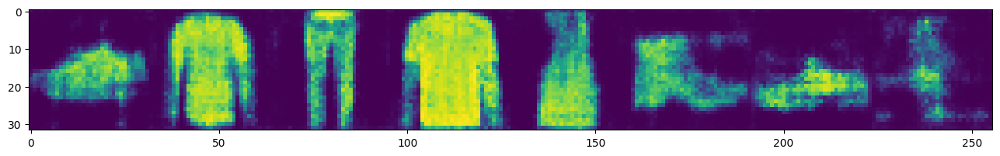

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/40] [D loss: 0.8478] [G loss: 1.4371]
torch.Size([8, 1, 32, 32])


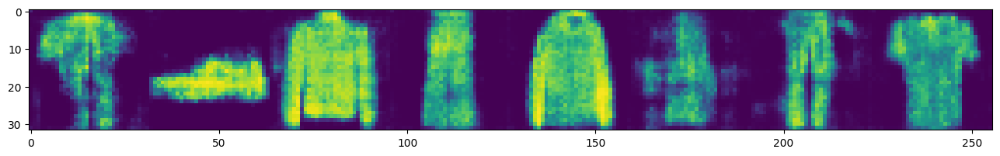

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/40] [D loss: 0.8086] [G loss: 1.4855]
torch.Size([8, 1, 32, 32])


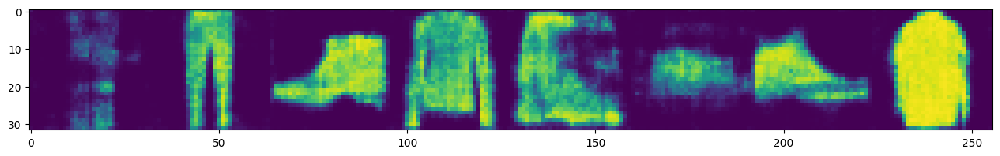

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/40] [D loss: 0.7965] [G loss: 1.5206]
torch.Size([8, 1, 32, 32])


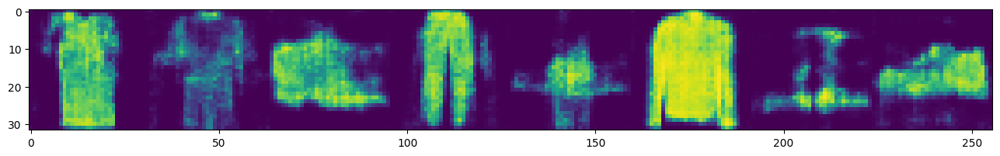

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/40] [D loss: 0.7619] [G loss: 1.6044]
torch.Size([8, 1, 32, 32])


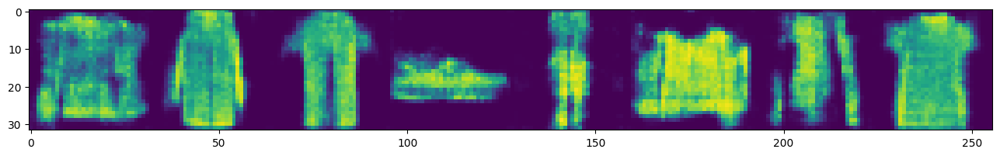

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/40] [D loss: 0.7207] [G loss: 1.6673]
torch.Size([8, 1, 32, 32])


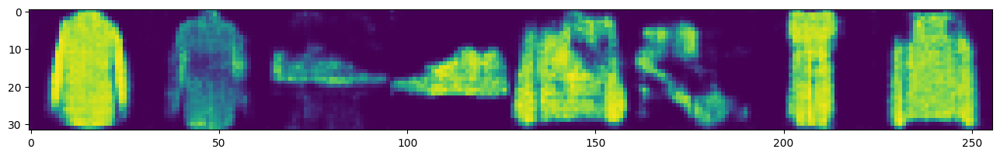

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/40] [D loss: 0.7058] [G loss: 1.7302]
torch.Size([8, 1, 32, 32])


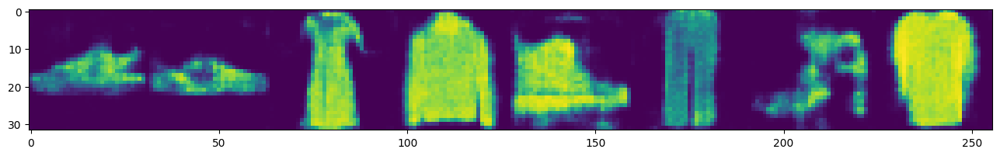

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/40] [D loss: 0.6683] [G loss: 1.7824]
torch.Size([8, 1, 32, 32])


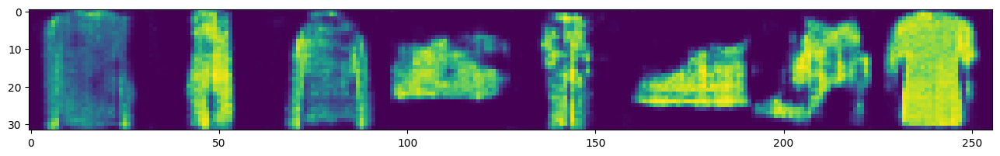

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/40] [D loss: 0.6356] [G loss: 1.8461]
torch.Size([8, 1, 32, 32])


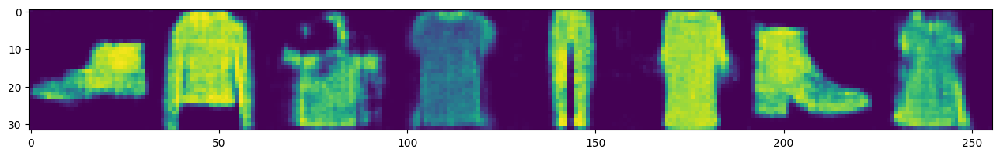

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/40] [D loss: 0.6218] [G loss: 1.9524]
torch.Size([8, 1, 32, 32])


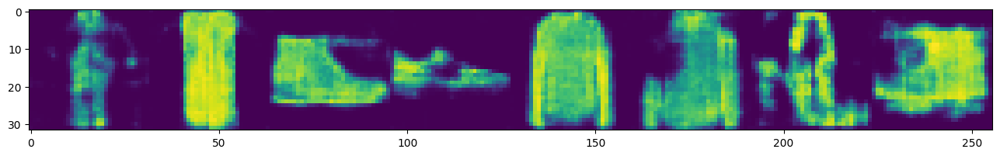

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/40] [D loss: 0.5791] [G loss: 1.9700]
torch.Size([8, 1, 32, 32])


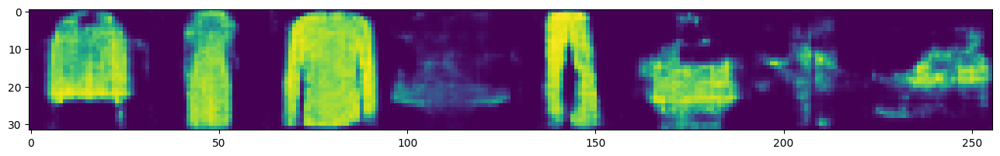

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/40] [D loss: 0.5731] [G loss: 2.0403]
torch.Size([8, 1, 32, 32])


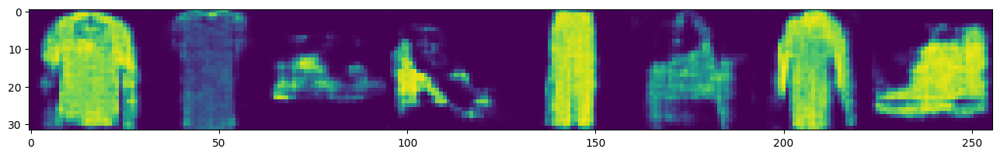

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/40] [D loss: 0.5497] [G loss: 2.0968]
torch.Size([8, 1, 32, 32])


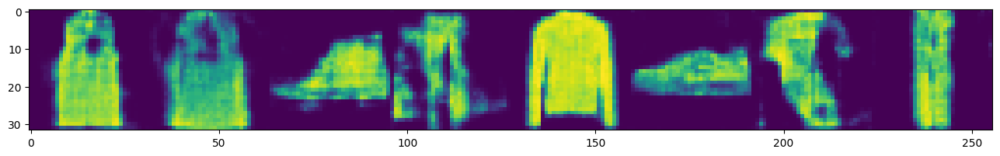

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/40] [D loss: 0.8504] [G loss: 1.8104]
torch.Size([8, 1, 32, 32])


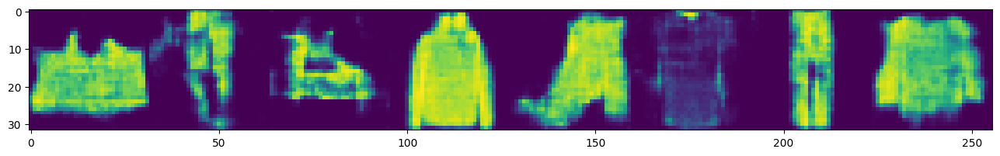

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/40] [D loss: 0.4606] [G loss: 2.1735]
torch.Size([8, 1, 32, 32])


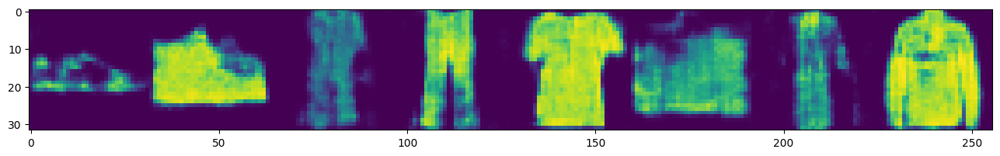

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/40] [D loss: 0.4531] [G loss: 2.2428]
torch.Size([8, 1, 32, 32])


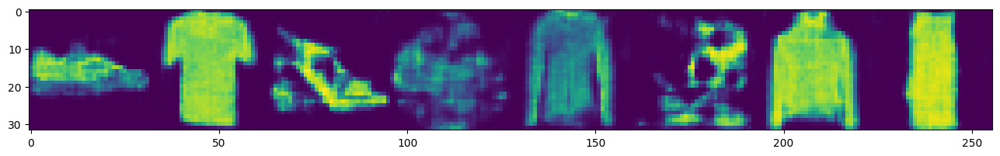

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/40] [D loss: 0.4827] [G loss: 2.3059]
torch.Size([8, 1, 32, 32])


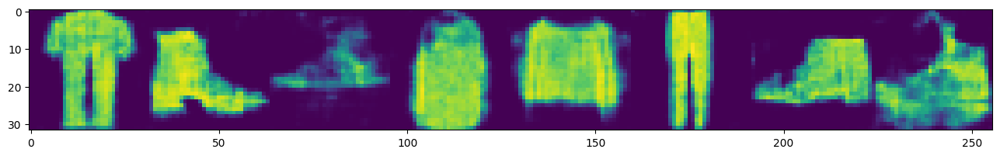

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/40] [D loss: 0.4165] [G loss: 2.3586]
torch.Size([8, 1, 32, 32])


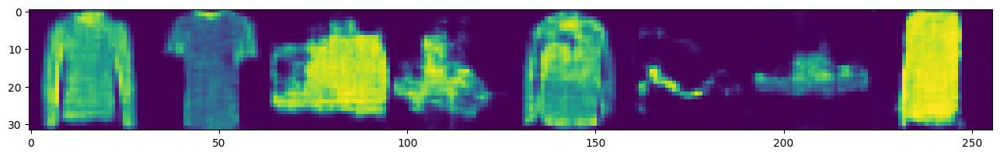

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/40] [D loss: 0.4450] [G loss: 2.3920]
torch.Size([8, 1, 32, 32])


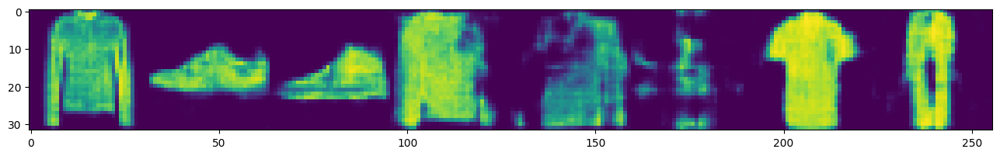

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/40] [D loss: 0.4202] [G loss: 2.4474]
torch.Size([8, 1, 32, 32])


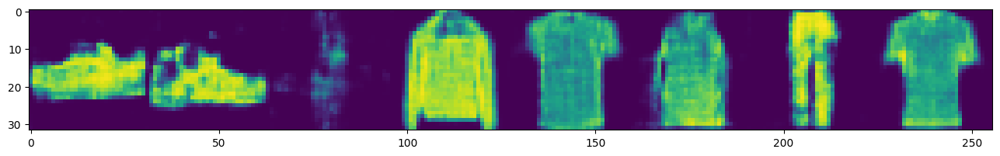

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/40] [D loss: 0.3805] [G loss: 2.5378]
torch.Size([8, 1, 32, 32])


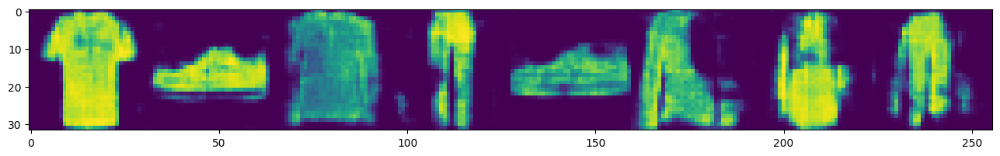

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/40] [D loss: 0.3948] [G loss: 2.5401]
torch.Size([8, 1, 32, 32])


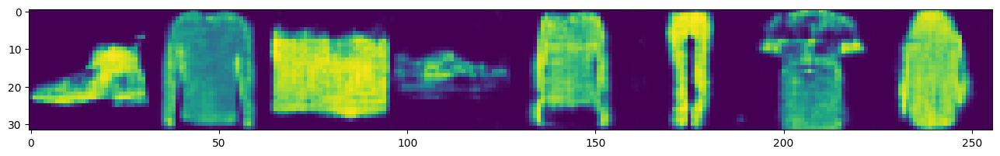

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/40] [D loss: 0.3488] [G loss: 2.6461]
torch.Size([8, 1, 32, 32])


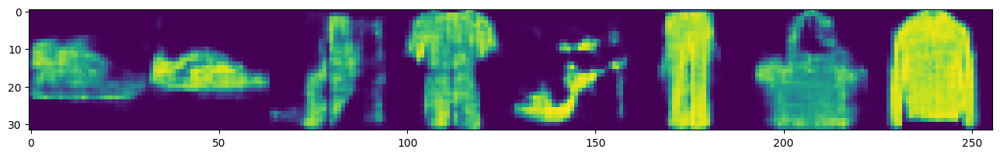

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/40] [D loss: 0.4094] [G loss: 2.6861]
torch.Size([8, 1, 32, 32])


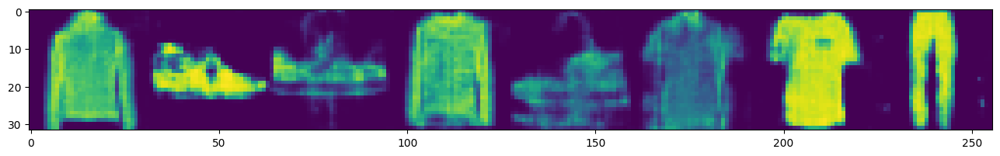

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/40] [D loss: 0.3755] [G loss: 2.5292]
torch.Size([8, 1, 32, 32])


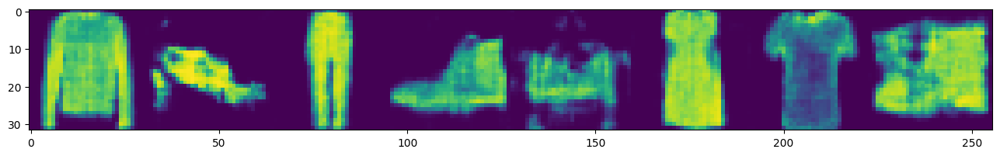

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/40] [D loss: 0.2866] [G loss: 2.7254]
torch.Size([8, 1, 32, 32])


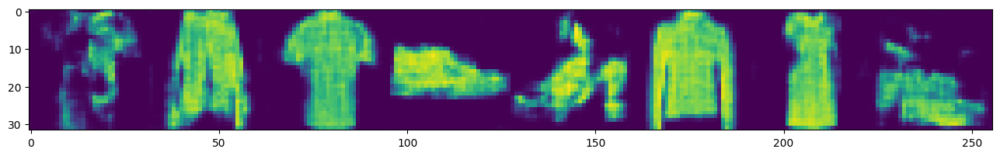

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/40] [D loss: 0.9906] [G loss: 2.1689]
torch.Size([8, 1, 32, 32])


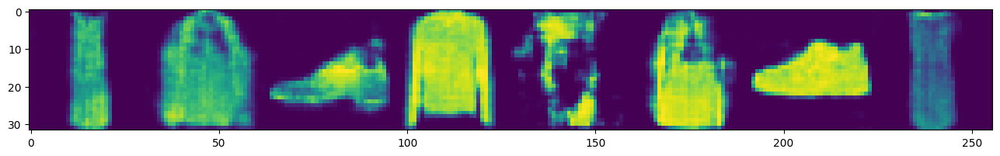

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/40] [D loss: 0.3105] [G loss: 2.5930]
torch.Size([8, 1, 32, 32])


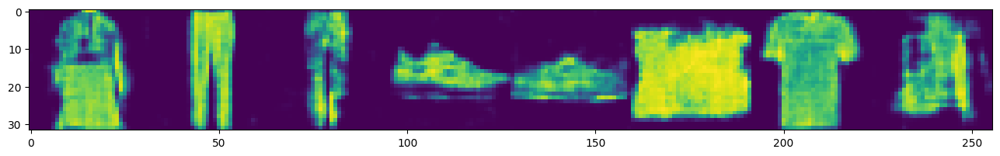

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/40] [D loss: 0.2634] [G loss: 2.8245]
torch.Size([8, 1, 32, 32])


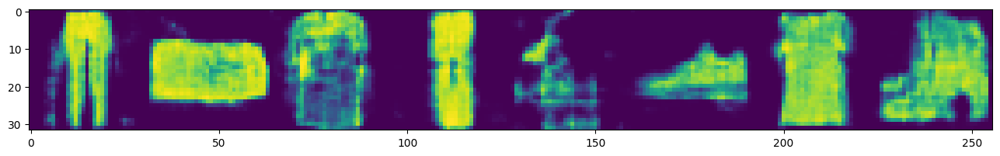

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/40] [D loss: 0.2505] [G loss: 2.9367]
torch.Size([8, 1, 32, 32])


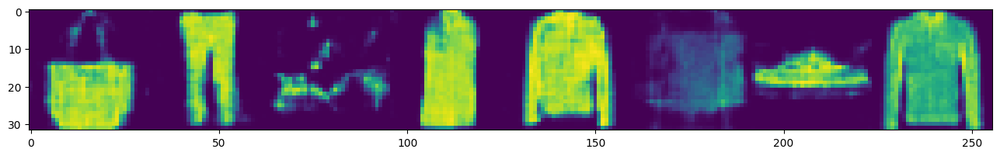

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/40] [D loss: 0.3090] [G loss: 2.7118]
torch.Size([8, 1, 32, 32])


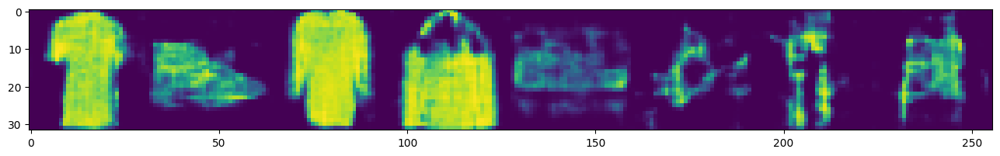

{'g_loss': [0.9273024972142845,
  1.28387412120556,
  1.6020722389221191,
  1.734277016129987,
  1.9159569493655502,
  1.9952360946556618,
  1.815232920235601,
  1.4262949063860137,
  1.3722765610135834,
  1.4132404450712532,
  1.437078243699567,
  1.4855408586304764,
  1.520620321405345,
  1.604362666606903,
  1.667318514708815,
  1.7302017910727139,
  1.7823955827745899,
  1.8460670915143242,
  1.9524247934078347,
  1.9700313210487366,
  2.0402929084054353,
  2.0968278687575768,
  1.8104187763970474,
  2.1734500774021805,
  2.242786193716115,
  2.3059201117219597,
  2.3586090145439935,
  2.3920233105791024,
  2.4473834859913794,
  2.5378279768187424,
  2.5400628426979326,
  2.646116116951252,
  2.6860850083416907,
  2.5292237955948402,
  2.7253772225873223,
  2.1688525368427407,
  2.5929628405077705,
  2.824482568379106,
  2.936743917136357,
  2.711766551280844],
 'd_loss': [1.1033759014359836,
  0.7452638323964744,
  0.5968373402439314,
  0.6370670456310799,
  0.4351191001719442,
  

In [ ]:
gan = GANManager() # You can pass your arguments to the call.
gan_history = gan.train(dataloader)
gan_history

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/50] [D loss: 1.1030] [G loss: 0.9340]
torch.Size([8, 1, 32, 32])


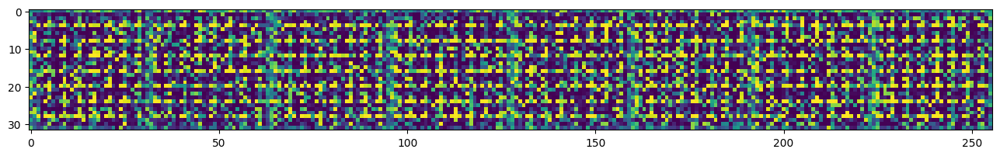

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/50] [D loss: 0.7443] [G loss: 1.2835]
torch.Size([8, 1, 32, 32])


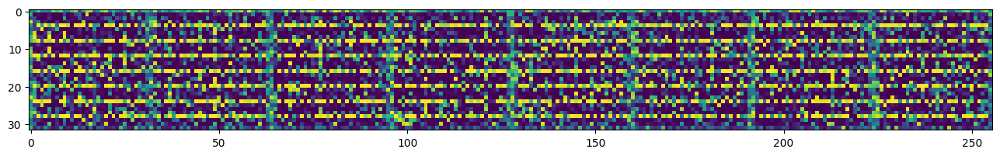

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/50] [D loss: 0.7326] [G loss: 1.5409]
torch.Size([8, 1, 32, 32])


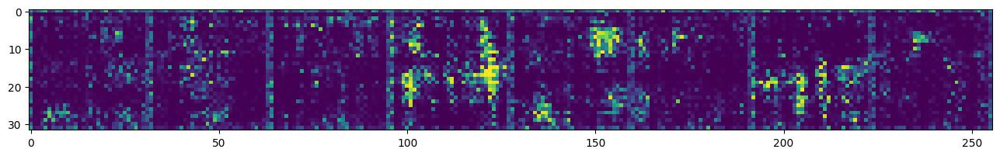

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/50] [D loss: 0.7158] [G loss: 1.4738]
torch.Size([8, 1, 32, 32])


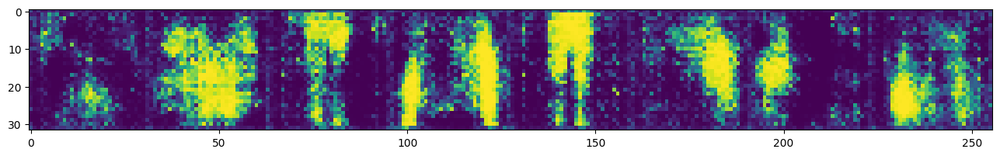

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/50] [D loss: 0.8845] [G loss: 1.2976]
torch.Size([8, 1, 32, 32])


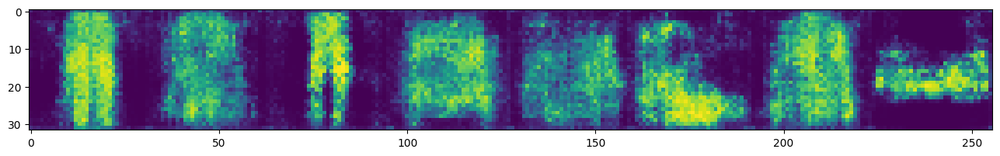

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/50] [D loss: 0.9975] [G loss: 1.2113]
torch.Size([8, 1, 32, 32])


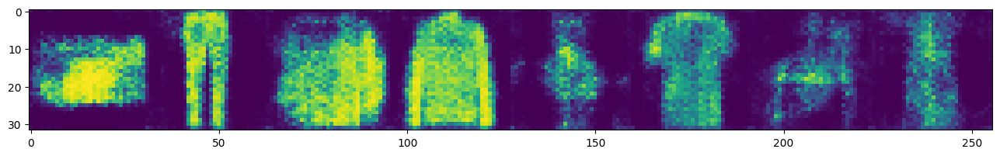

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/50] [D loss: 0.9424] [G loss: 1.2315]
torch.Size([8, 1, 32, 32])


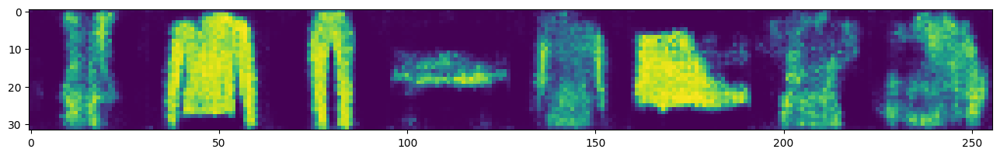

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/50] [D loss: 0.9972] [G loss: 1.2374]
torch.Size([8, 1, 32, 32])


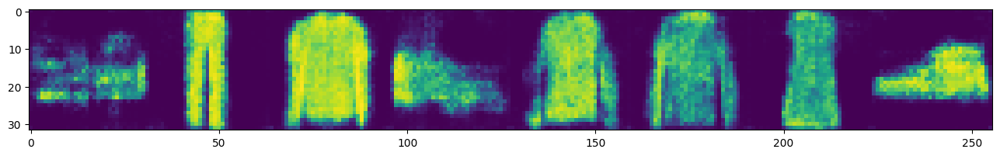

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/50] [D loss: 0.9172] [G loss: 1.3161]
torch.Size([8, 1, 32, 32])


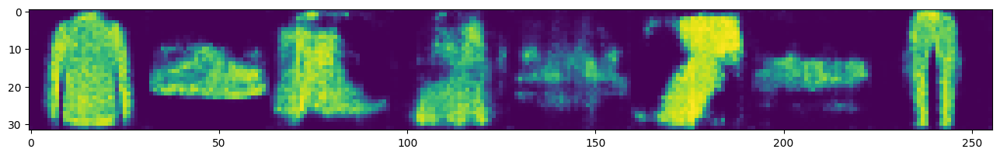

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/50] [D loss: 0.9175] [G loss: 1.3337]
torch.Size([8, 1, 32, 32])


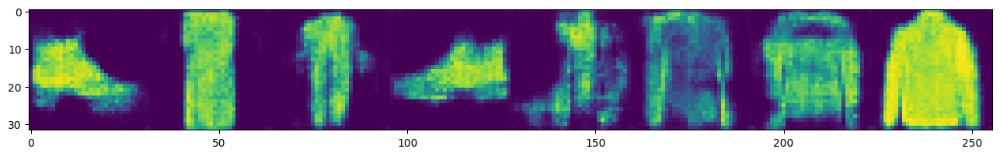

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/50] [D loss: 0.8661] [G loss: 1.3937]
torch.Size([8, 1, 32, 32])


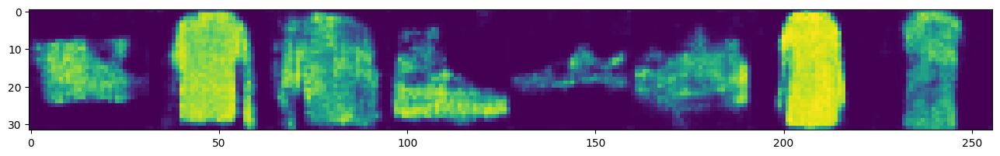

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/50] [D loss: 0.8776] [G loss: 1.4548]
torch.Size([8, 1, 32, 32])


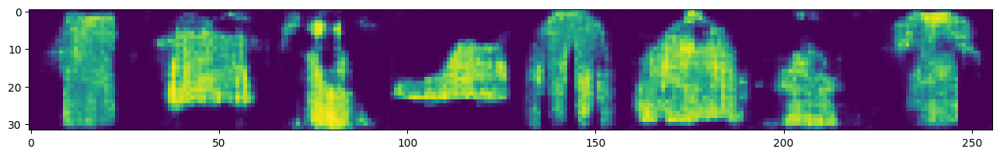

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/50] [D loss: 0.7632] [G loss: 1.5215]
torch.Size([8, 1, 32, 32])


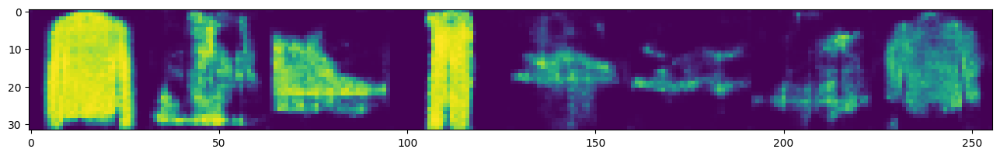

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/50] [D loss: 0.7945] [G loss: 1.5724]
torch.Size([8, 1, 32, 32])


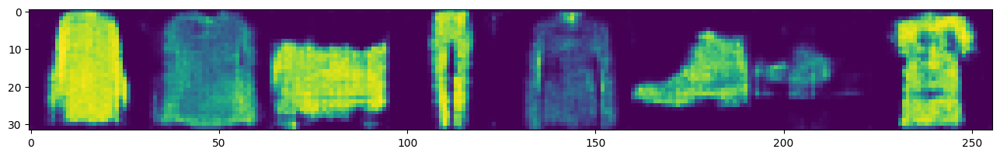

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/50] [D loss: 0.7342] [G loss: 1.6459]
torch.Size([8, 1, 32, 32])


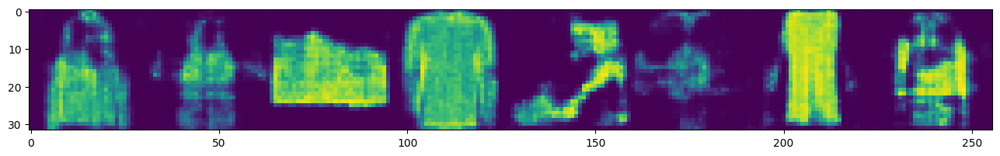

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/50] [D loss: 0.6999] [G loss: 1.7042]
torch.Size([8, 1, 32, 32])


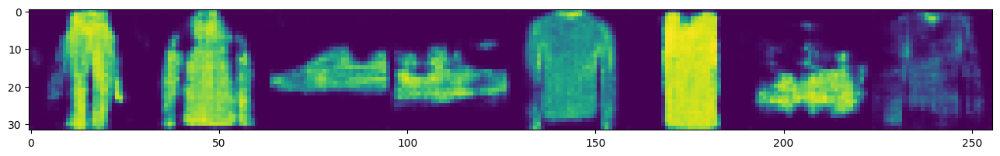

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/50] [D loss: 0.8380] [G loss: 1.6793]
torch.Size([8, 1, 32, 32])


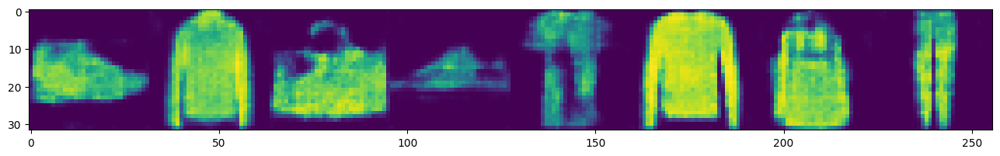

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/50] [D loss: 0.6201] [G loss: 1.7960]
torch.Size([8, 1, 32, 32])


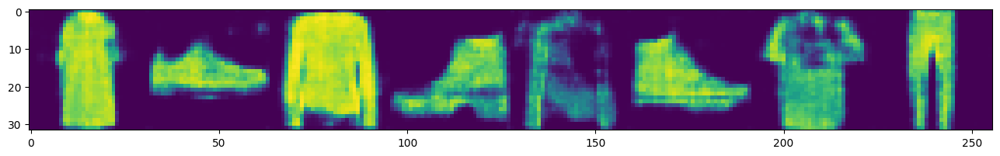

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/50] [D loss: 0.5816] [G loss: 1.9045]
torch.Size([8, 1, 32, 32])


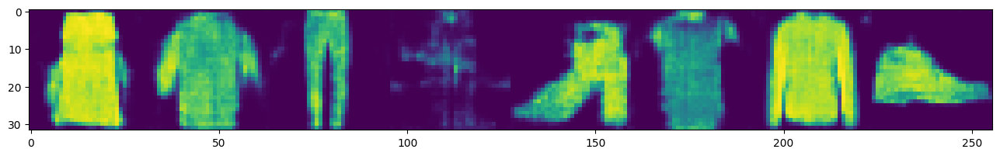

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/50] [D loss: 0.5680] [G loss: 1.9713]
torch.Size([8, 1, 32, 32])


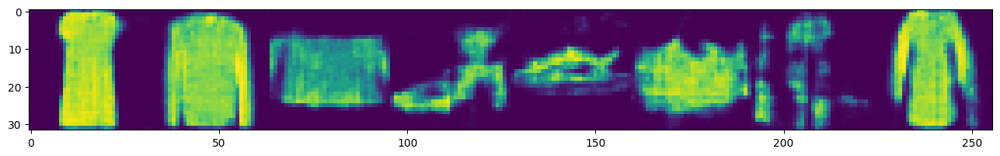

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/50] [D loss: 0.5889] [G loss: 2.0031]
torch.Size([8, 1, 32, 32])


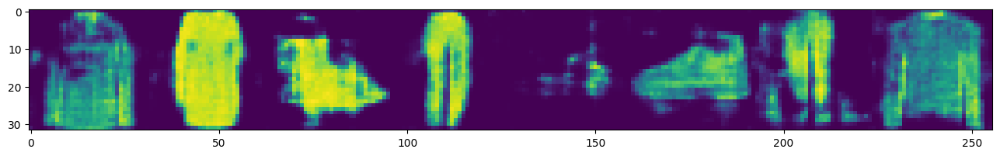

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/50] [D loss: 0.6505] [G loss: 2.0220]
torch.Size([8, 1, 32, 32])


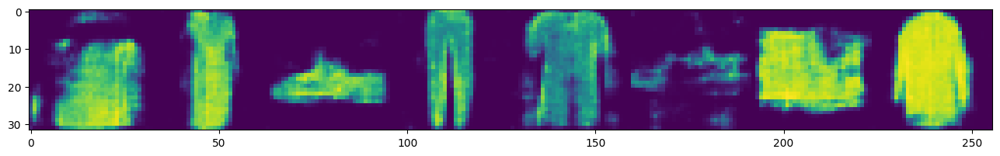

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/50] [D loss: 0.5276] [G loss: 2.1019]
torch.Size([8, 1, 32, 32])


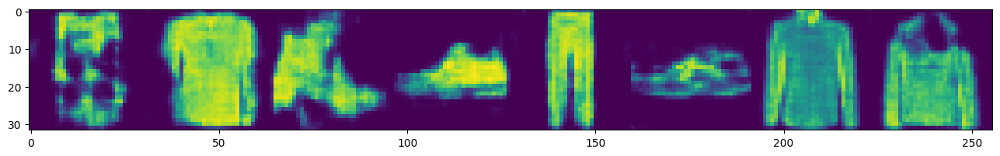

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/50] [D loss: 0.4775] [G loss: 2.1859]
torch.Size([8, 1, 32, 32])


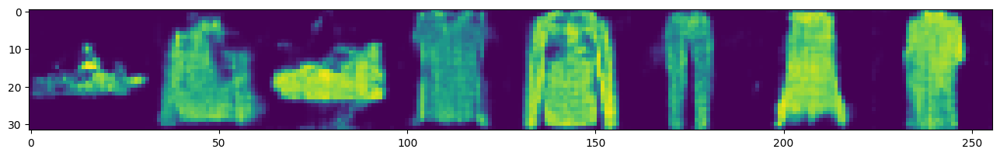

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/50] [D loss: 0.4554] [G loss: 2.2256]
torch.Size([8, 1, 32, 32])


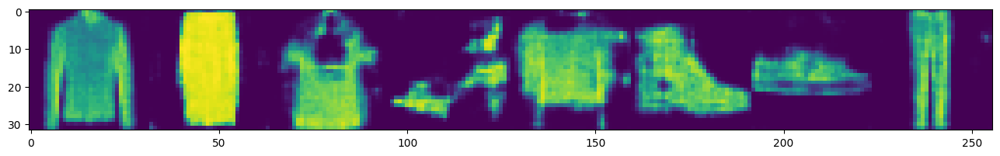

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/50] [D loss: 0.4894] [G loss: 2.2573]
torch.Size([8, 1, 32, 32])


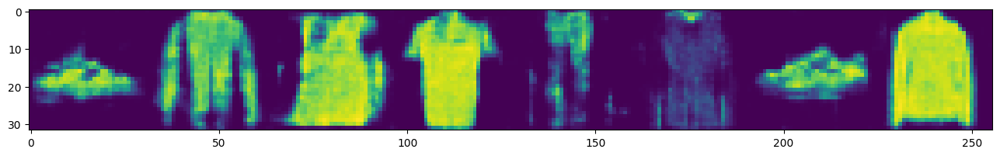

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/50] [D loss: 0.4314] [G loss: 2.3374]
torch.Size([8, 1, 32, 32])


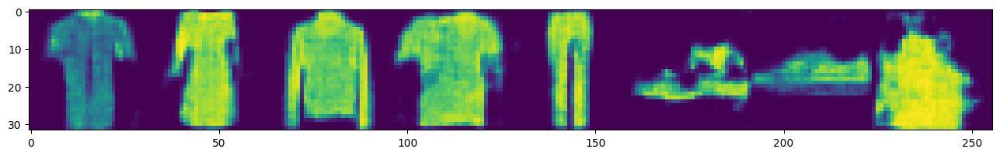

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/50] [D loss: 0.4606] [G loss: 2.3980]
torch.Size([8, 1, 32, 32])


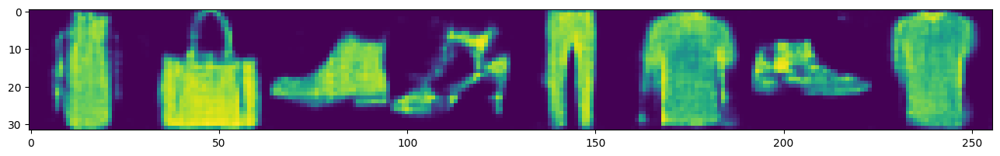

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/50] [D loss: 0.5097] [G loss: 2.3605]
torch.Size([8, 1, 32, 32])


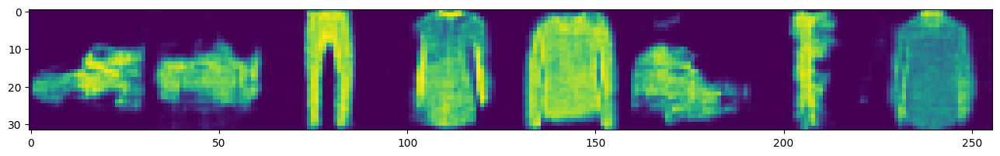

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/50] [D loss: 0.3579] [G loss: 2.5407]
torch.Size([8, 1, 32, 32])


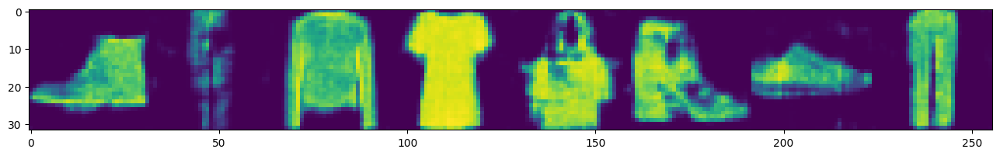

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/50] [D loss: 0.4696] [G loss: 2.4733]
torch.Size([8, 1, 32, 32])


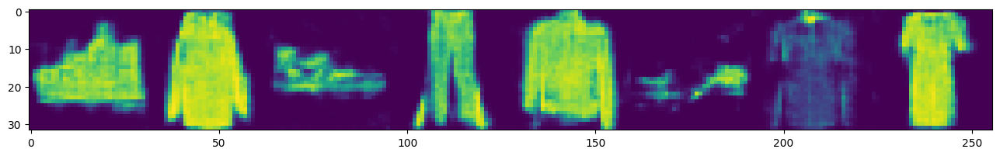

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/50] [D loss: 0.3465] [G loss: 2.6427]
torch.Size([8, 1, 32, 32])


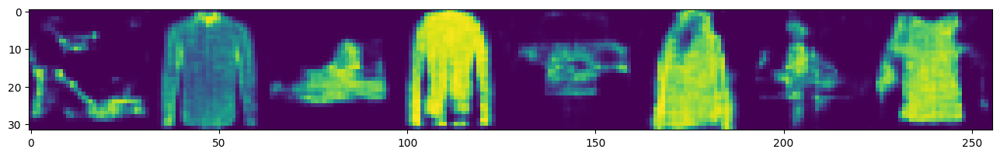

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/50] [D loss: 0.6376] [G loss: 2.7585]
torch.Size([8, 1, 32, 32])


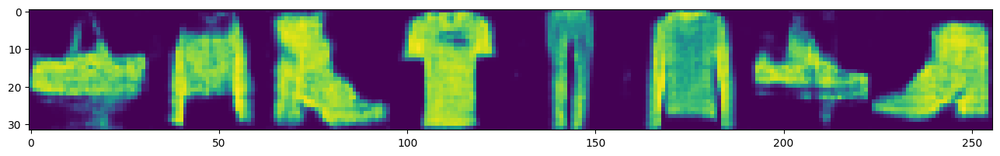

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/50] [D loss: 0.6511] [G loss: 2.1000]
torch.Size([8, 1, 32, 32])


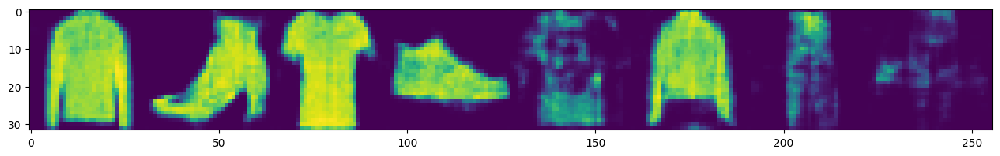

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/50] [D loss: 0.3002] [G loss: 2.6491]
torch.Size([8, 1, 32, 32])


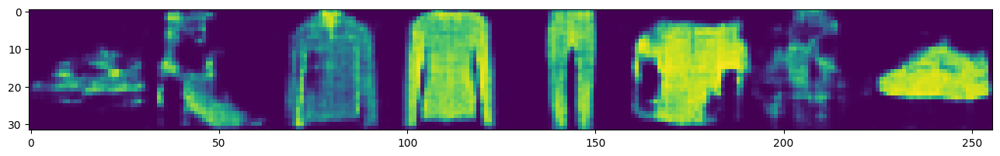

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/50] [D loss: 0.3032] [G loss: 2.5801]
torch.Size([8, 1, 32, 32])


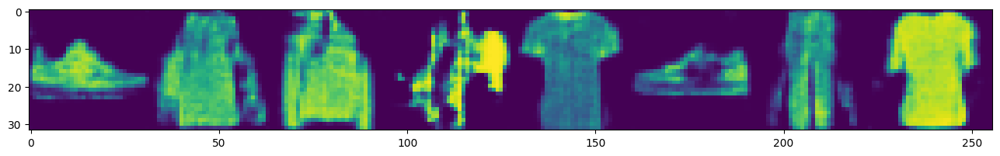

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/50] [D loss: 0.2959] [G loss: 2.7226]
torch.Size([8, 1, 32, 32])


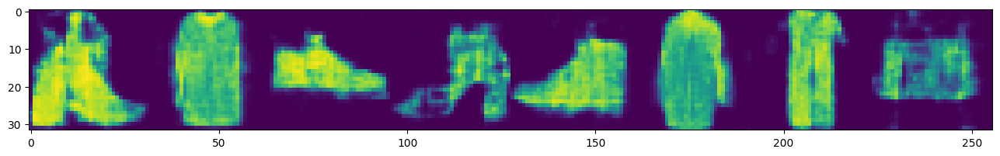

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/50] [D loss: 0.3346] [G loss: 2.8468]
torch.Size([8, 1, 32, 32])


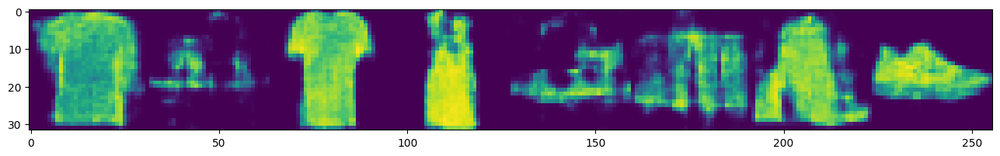

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/50] [D loss: 0.3048] [G loss: 2.8667]
torch.Size([8, 1, 32, 32])


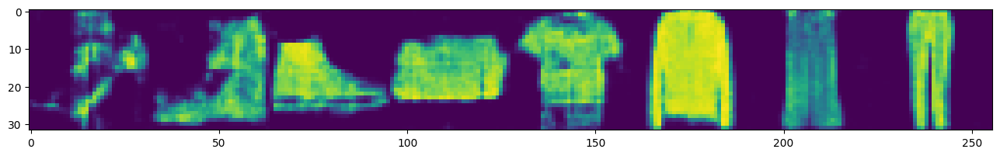

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/50] [D loss: 0.3680] [G loss: 2.8884]
torch.Size([8, 1, 32, 32])


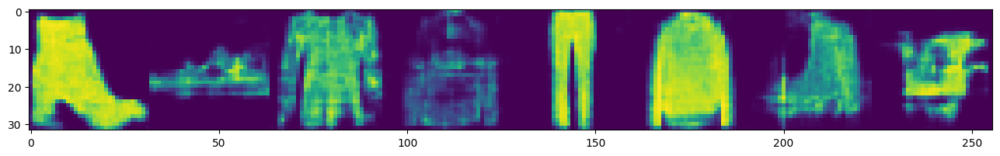

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 41/50] [D loss: 0.3314] [G loss: 2.9203]
torch.Size([8, 1, 32, 32])


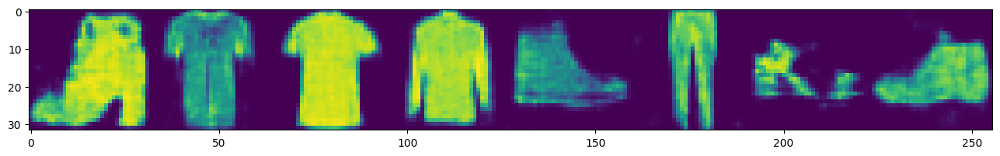

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 42/50] [D loss: 0.2223] [G loss: 3.0595]
torch.Size([8, 1, 32, 32])


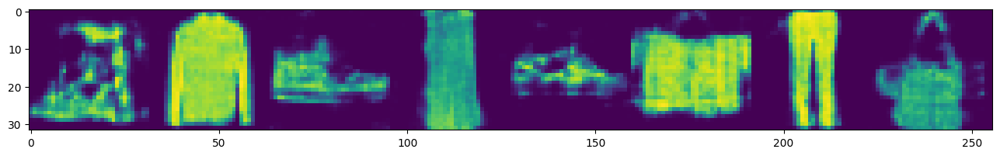

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 43/50] [D loss: 0.7876] [G loss: 2.5471]
torch.Size([8, 1, 32, 32])


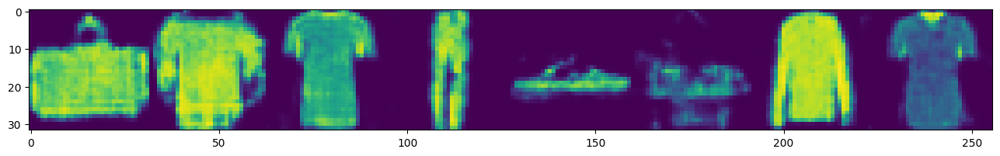

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 44/50] [D loss: 0.2209] [G loss: 2.9783]
torch.Size([8, 1, 32, 32])


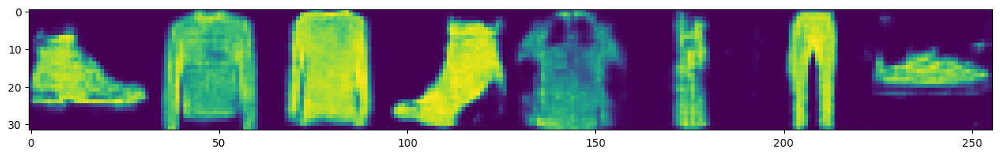

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 45/50] [D loss: 0.2558] [G loss: 3.0848]
torch.Size([8, 1, 32, 32])


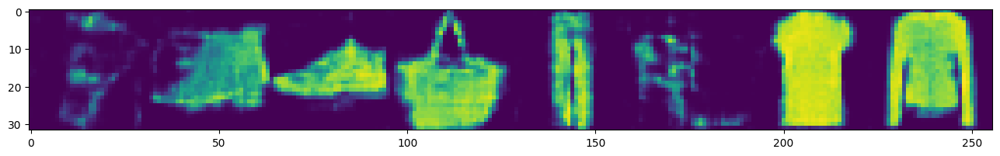

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 46/50] [D loss: 0.2819] [G loss: 3.0251]
torch.Size([8, 1, 32, 32])


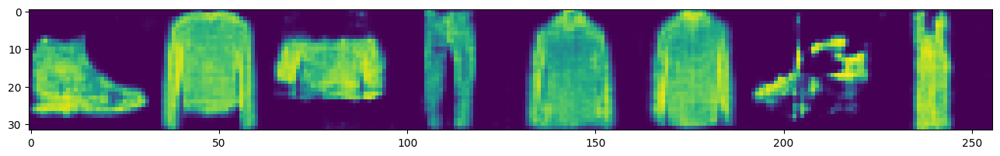

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 47/50] [D loss: 0.2240] [G loss: 2.9437]
torch.Size([8, 1, 32, 32])


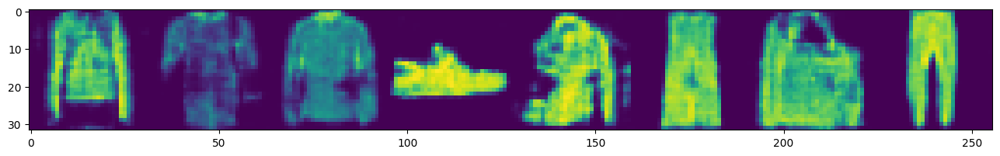

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 48/50] [D loss: 0.2225] [G loss: 3.1528]
torch.Size([8, 1, 32, 32])


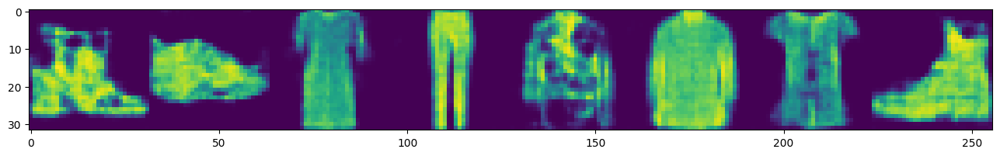

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 49/50] [D loss: 0.3791] [G loss: 3.0030]
torch.Size([8, 1, 32, 32])


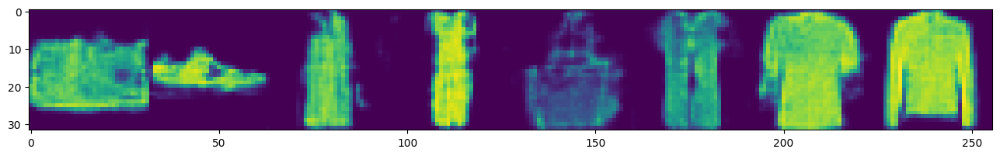

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 50/50] [D loss: 0.2223] [G loss: 3.2562]
torch.Size([8, 1, 32, 32])


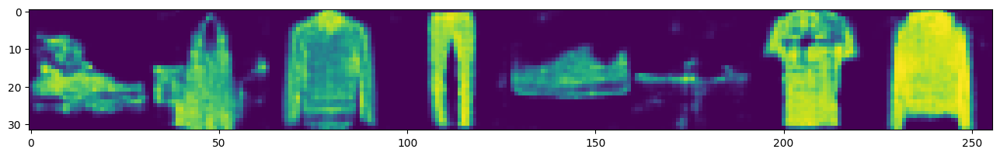

In [ ]:
gan = GANManager() # You can pass your arguments to the call.
gan_history = gan.train(dataloader)

### Model-2: Normal GAN


In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim, image_size=32):
        super(Generator, self).__init__()

        ##########################################################
        # TODO (2 points): 
        # Define the generator model here. You may use linear layers, 
        # normalization layers, and activation layers.  
        ##########################################################
        self.z_dim = z_dim
        self.image_size = image_size

        self.net = nn.Sequential(
            nn.Linear(z_dim, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, image_size * image_size),
            nn.Tanh()
        )

        self.fc1 = nn.Linear(z_dim, 1024)
        self.fc2 = nn.Linear(1024, 512)
        self.fc3 = nn.Linear(512, image_size * image_size)
        

    def forward(self, z): 

        img = None

        ##########################################################
        # TODO (2 points): 
        # Generate images from the random noise `z`.
        ##########################################################
        # x = nn.functional.leaky_relu(self.fc1(z), 0.2)
        # x = nn.functional.leaky_relu(self.fc2(x), 0.2)
        # x = nn.functional.tanh(self.fc3(x))
        # img = x.view(-1, 1, self.image_size, self.image_size)
        img = self.net(z)
        img = img.view(-1, 1, self.image_size, self.image_size)
        return img

class Discriminator(nn.Module):
    def __init__(self, image_size=32):
        super(Discriminator, self).__init__()
        
        ##########################################################
        # TODO (2 points): 
        # Define the Discriminator model here. You may use linear 
        # layers, normalization layers, and activation layers.  
        ##########################################################
        self.image_size = image_size

        self.conv1 = nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1)
        self.fc1 = nn.Linear(128 * (image_size // 4) * (image_size // 4), 1)

    def forward(self, x):

        real_or_fake = None

        ##########################################################
        # TODO (2 points): 
        # Predict whether each image in `img` is real or fake.
        ##########################################################
        x = nn.functional.leaky_relu(self.conv1(x), 0.2)
        x = nn.functional.leaky_relu(self.conv2(x), 0.2)
        x = x.view(-1, 128 * (self.image_size // 4) * (self. image_size // 4))
        real_or_fake = nn.functional.sigmoid(self.fc1(x))

        return real_or_fake

class GANManager():
    def __init__(self, image_size=32, z_dim=100):
        
        ##########################################################
        # TODO (3 points): 
        # 1) Instantiate the Generator and the Discriminator.
        # 2) Define your optimizer(s). You can use Adam.
        ##########################################################

        self.image_size = image_size
        self.z_dim = z_dim

        self.generator = Generator(z_dim=self.z_dim, image_size=image_size).to(DEVICE)
        self.discriminator = Discriminator(image_size=image_size).to(DEVICE)

        self.G_optimizer = optim.Adam(self.generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.D_optimizer = optim.Adam(self.discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))


        self.BCE_loss = nn.BCELoss()

    def train(self, dataloader, **kwargs):

        history = dict(g_loss=[], d_loss=[])
        for epoch in range(EPOCHS):
            total_g_loss = []
            total_d_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)

                ##########################################################
                # TODO (15 points): 
                # Calculate the loss for the Generator and the Discriminator.
                # Perform the optimization on `batch_x`.
                ##########################################################

                batch_size = batch_x.shape[0]
                

                #train descriminator with real
                self.D_optimizer.zero_grad()
                y_real = torch.ones(batch_size, 1).to(DEVICE)
                D_real = self.discriminator(batch_x)
                D_real_loss = self.BCE_loss(D_real, y_real)
                D_real_loss.backward()


                #train descriminator with fake
                y_fake = torch.zeros(batch_size, 1).to(DEVICE)
                z = torch.randn(batch_size, self.z_dim).to(DEVICE)
                generated = self.generator(z)
                D_fake = self.discriminator(generated)
                D_fake_loss = self.BCE_loss(D_fake, y_fake)
                D_fake_loss.backward()

                discriminator_loss = D_real_loss + D_fake_loss
                total_d_loss.append(discriminator_loss.item())
                self.D_optimizer.step()
                
                #train the generator
                self.G_optimizer.zero_grad()
                z = torch.randn(batch_size, self.z_dim).to(DEVICE)
                generated = self.generator(z)
                D_fake = self.discriminator(generated)
                generator_loss = self.BCE_loss(D_fake, y_real)
                total_g_loss.append(generator_loss.item())

                generator_loss.backward()
                self.G_optimizer.step()
                


            mean_d_loss = np.mean(total_d_loss)
            mean_g_loss = np.mean(total_g_loss)

            print(
                "[Epoch: %d/%d] [D loss: %.4f] [G loss: %.4f]"
                % (epoch+1, EPOCHS, mean_d_loss, mean_g_loss)
            )
            
            self.sample(8, plot=True)

            history['d_loss'].append(mean_d_loss)
            history['g_loss'].append(mean_g_loss)

        return history

    def sample(self, n, plot=True):

        ##########################################################
        # TODO (1 points): 
        # First, assign proper Gaussian noises to `z`.
        # Then, use can see that by using the Generator, we can
        # make new images and plot them.
        ##########################################################

        z = torch.randn(n, self.z_dim).to(DEVICE)
        with torch.no_grad():
            gen_imgs = self.generator(z)
            if plot:
                plot_images(gen_imgs.view(-1, 1, 32, 32))
            return gen_imgs

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/50] [D loss: 0.7756] [G loss: 1.3898]


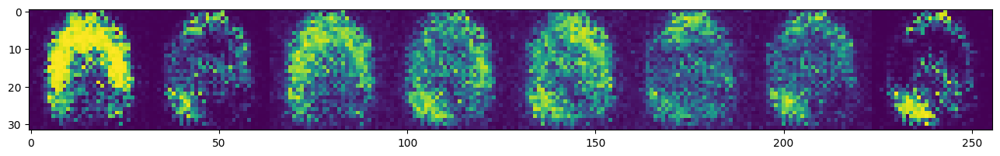

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/50] [D loss: 1.1278] [G loss: 1.2739]


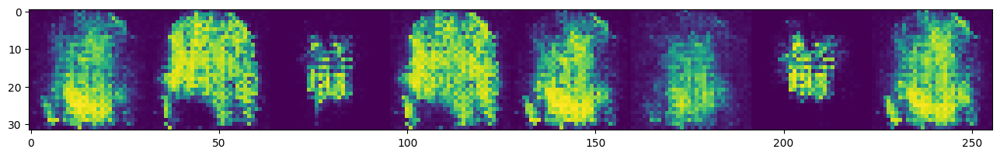

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/50] [D loss: 1.1596] [G loss: 0.9907]


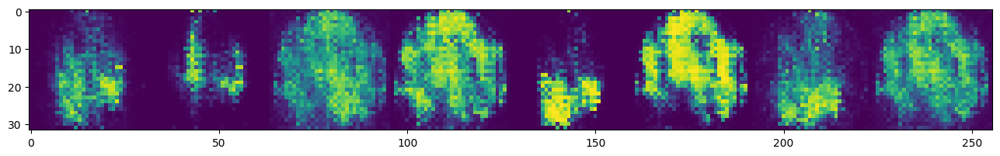

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/50] [D loss: 1.1128] [G loss: 1.0267]


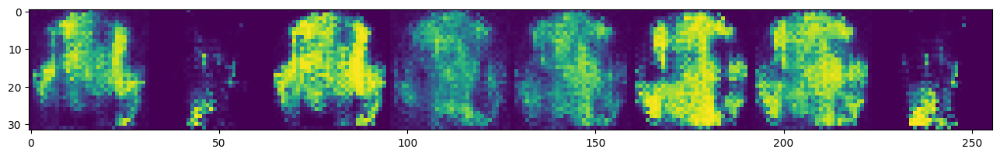

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/50] [D loss: 1.1303] [G loss: 1.0072]


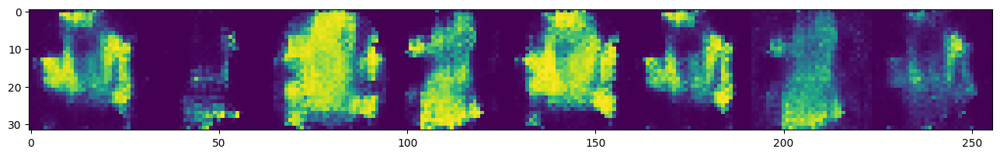

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/50] [D loss: 1.1646] [G loss: 0.9563]


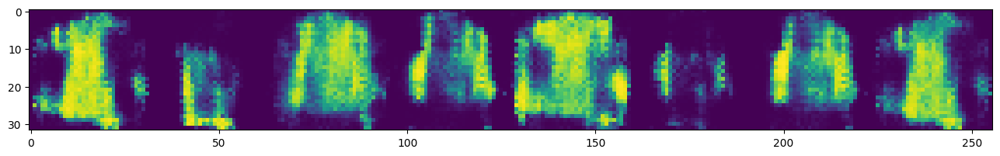

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 7/50] [D loss: 1.1189] [G loss: 0.9664]


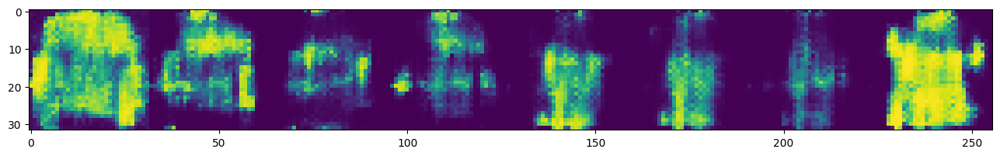

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/50] [D loss: 1.1029] [G loss: 0.9965]


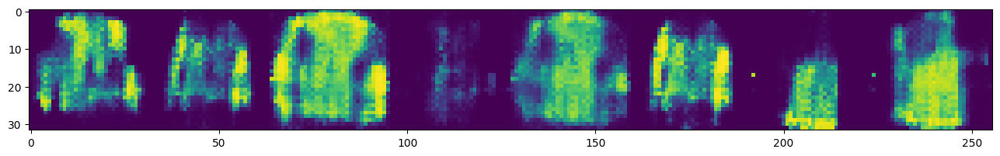

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/50] [D loss: 1.0507] [G loss: 1.0308]


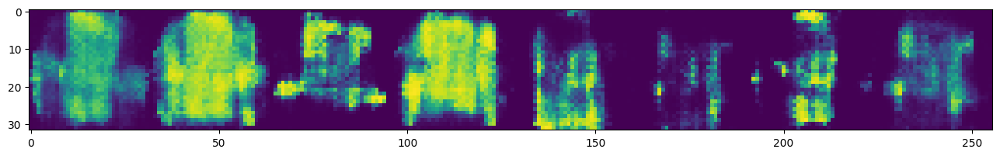

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/50] [D loss: 1.0849] [G loss: 1.0290]


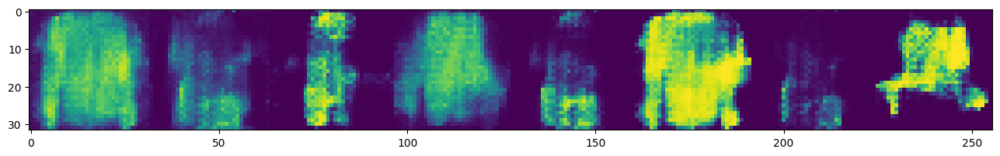

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/50] [D loss: 1.0601] [G loss: 1.0355]


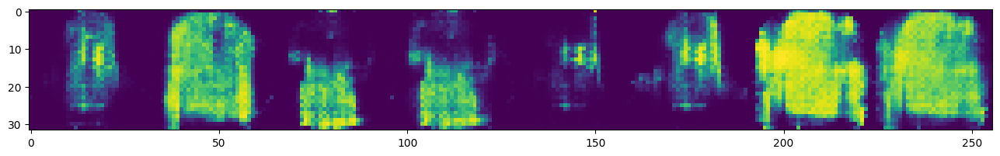

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/50] [D loss: 1.0808] [G loss: 1.0247]


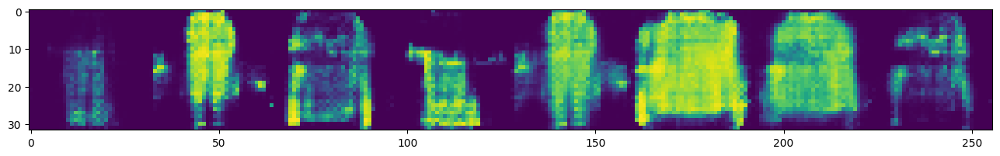

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/50] [D loss: 1.0712] [G loss: 1.0268]


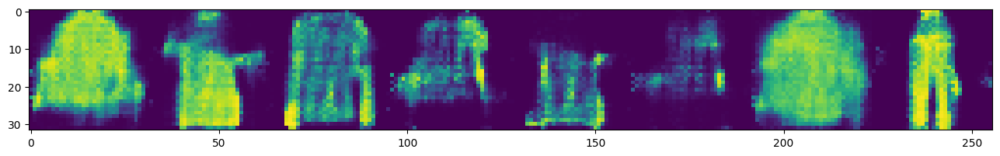

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/50] [D loss: 1.0616] [G loss: 1.0459]


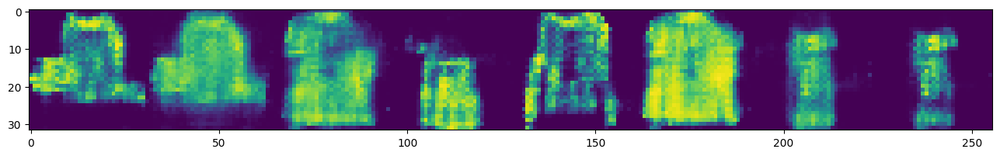

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/50] [D loss: 1.0515] [G loss: 1.0522]


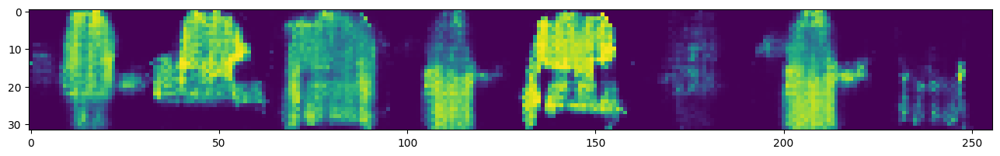

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/50] [D loss: 1.0472] [G loss: 1.0673]


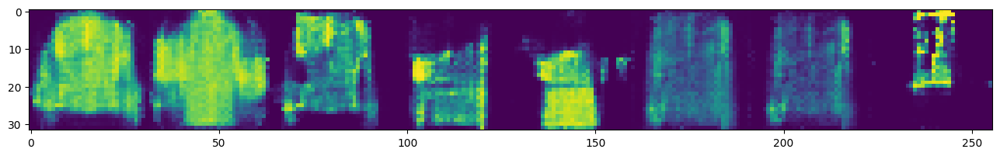

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/50] [D loss: 1.0581] [G loss: 1.0471]


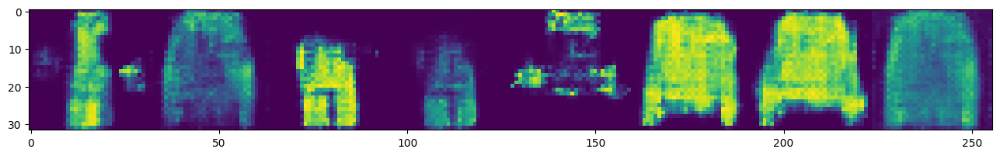

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/50] [D loss: 1.0740] [G loss: 1.0537]


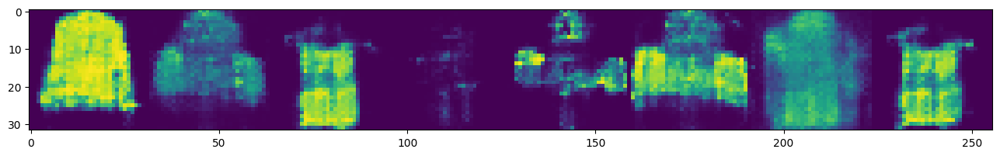

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/50] [D loss: 1.1230] [G loss: 1.0381]


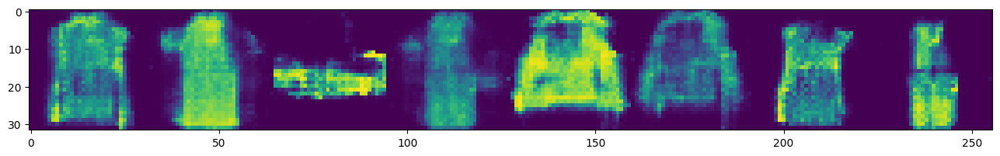

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/50] [D loss: 1.1651] [G loss: 0.9822]


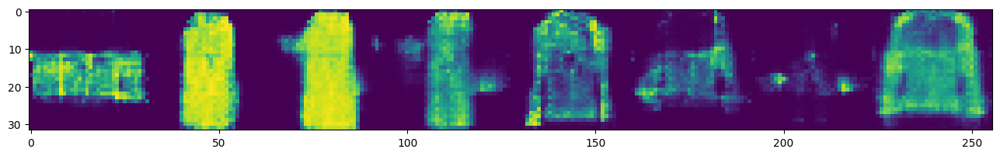

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/50] [D loss: 1.1751] [G loss: 0.9564]


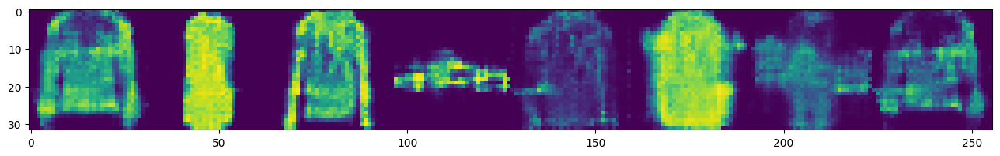

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/50] [D loss: 1.1630] [G loss: 0.9516]


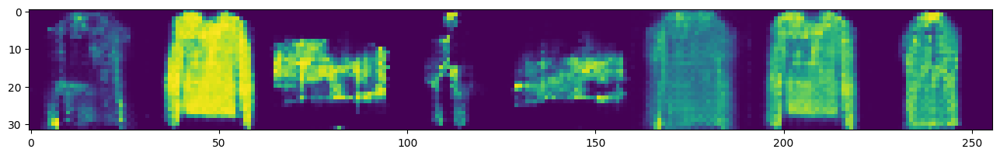

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/50] [D loss: 1.2073] [G loss: 0.9262]


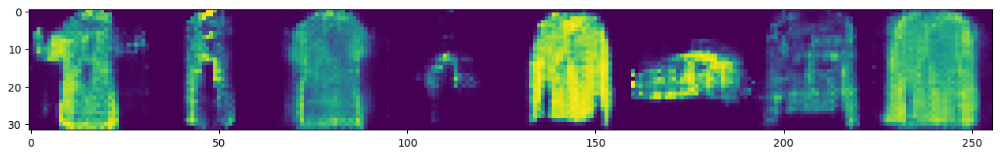

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/50] [D loss: 1.2221] [G loss: 0.9161]


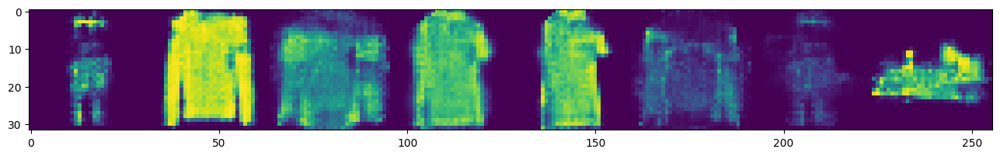

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/50] [D loss: 1.2018] [G loss: 0.9187]


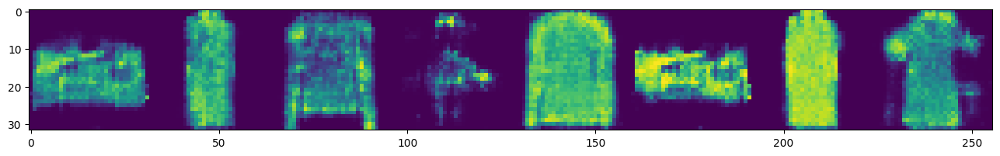

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/50] [D loss: 1.2226] [G loss: 0.8941]


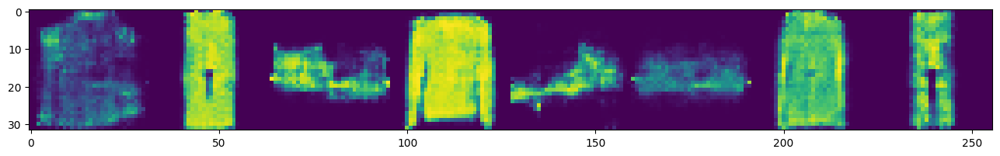

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/50] [D loss: 1.2523] [G loss: 0.8670]


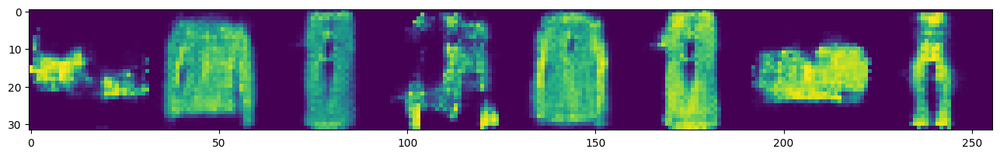

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/50] [D loss: 1.2467] [G loss: 0.8554]


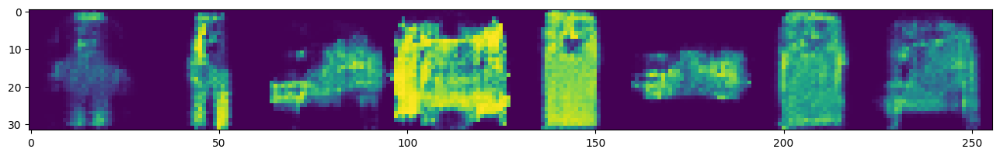

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/50] [D loss: 1.2622] [G loss: 0.8503]


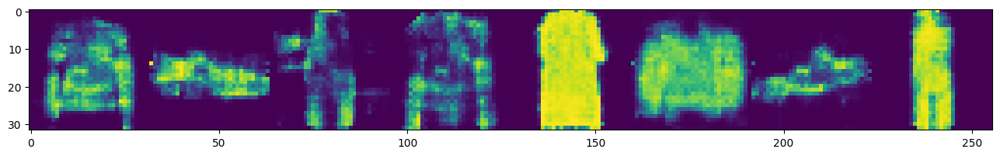

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/50] [D loss: 1.2491] [G loss: 0.8392]


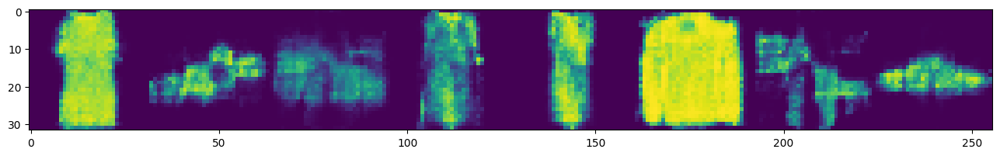

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/50] [D loss: 1.2547] [G loss: 0.8476]


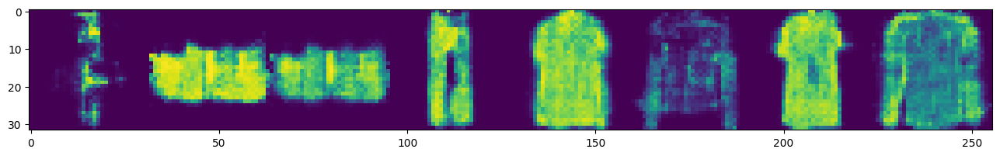

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/50] [D loss: 1.2564] [G loss: 0.8447]


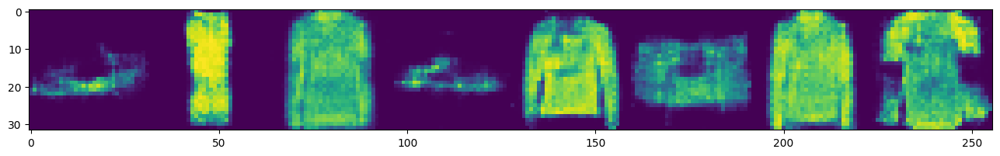

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/50] [D loss: 1.2424] [G loss: 0.8458]


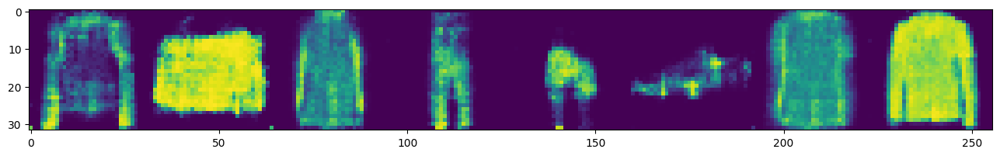

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/50] [D loss: 1.2597] [G loss: 0.8392]


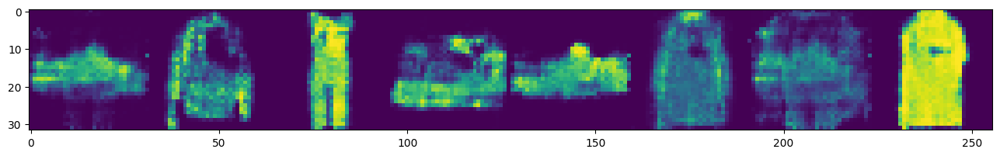

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/50] [D loss: 1.2544] [G loss: 0.8559]


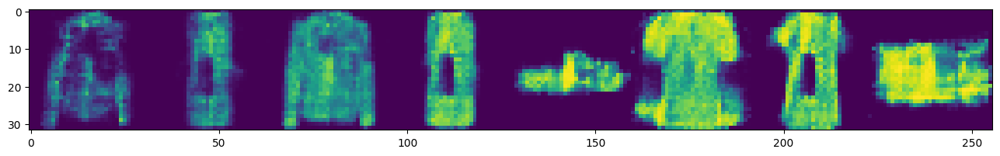

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/50] [D loss: 1.2382] [G loss: 0.8596]


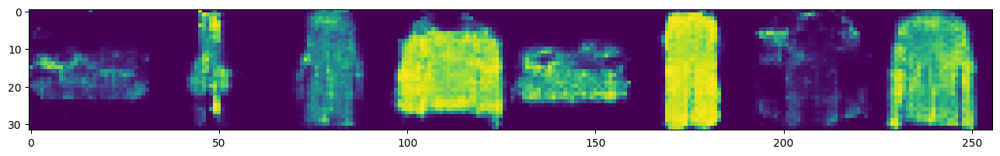

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/50] [D loss: 1.2681] [G loss: 0.8517]


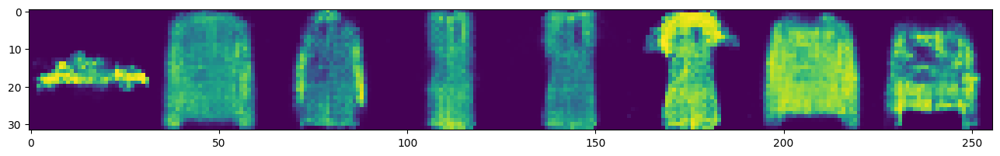

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/50] [D loss: 1.2545] [G loss: 0.8361]


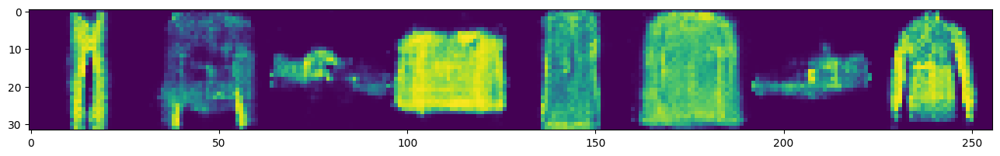

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/50] [D loss: 1.2632] [G loss: 0.8258]


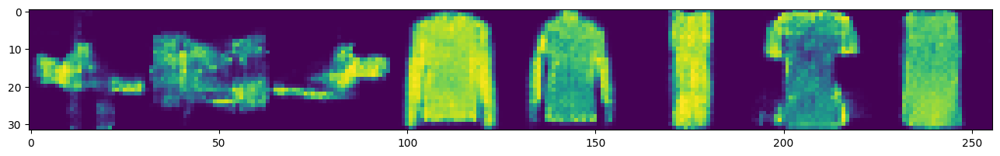

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/50] [D loss: 1.2732] [G loss: 0.8127]


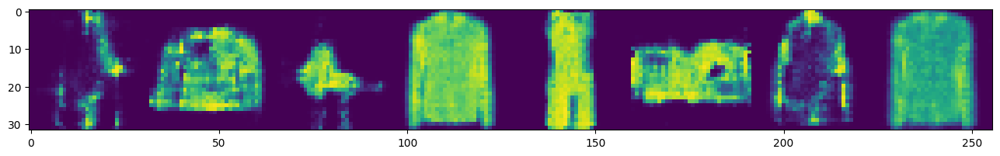

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 41/50] [D loss: 1.2480] [G loss: 0.8291]


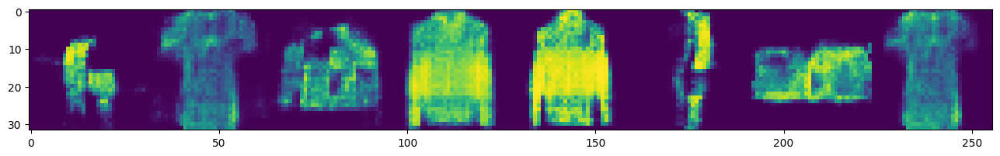

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 42/50] [D loss: 1.2548] [G loss: 0.8367]


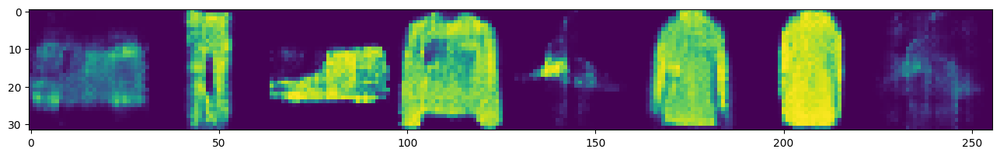

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 43/50] [D loss: 1.2776] [G loss: 0.8274]


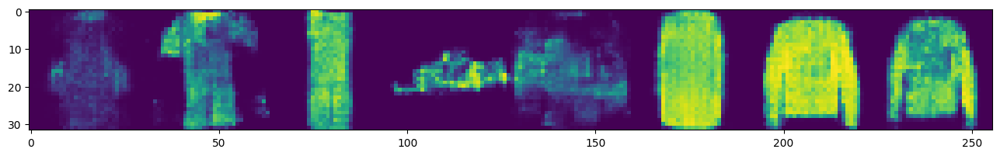

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 44/50] [D loss: 1.2646] [G loss: 0.8220]


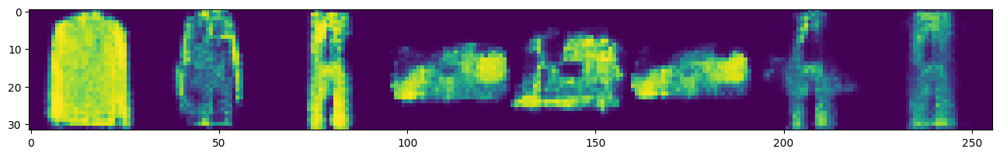

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 45/50] [D loss: 1.2570] [G loss: 0.8228]


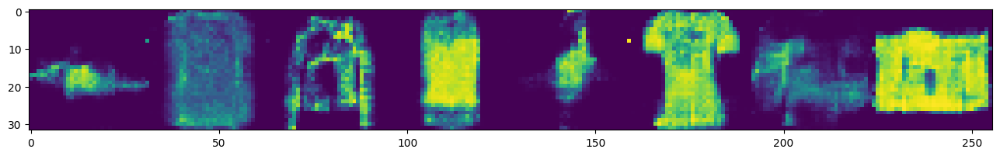

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 46/50] [D loss: 1.2572] [G loss: 0.8358]


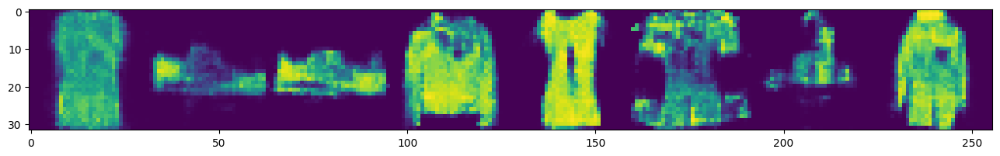

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 47/50] [D loss: 1.2925] [G loss: 0.8394]


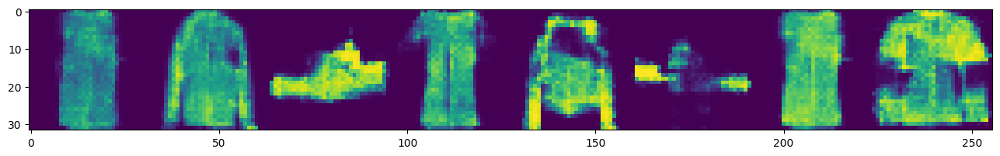

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 48/50] [D loss: 1.2745] [G loss: 0.8318]


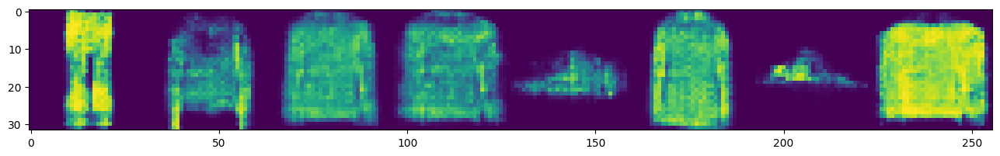

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 49/50] [D loss: 1.3011] [G loss: 0.7987]


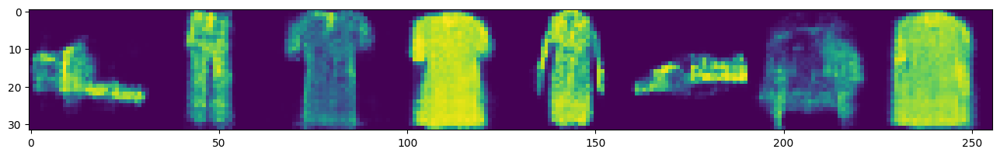

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 50/50] [D loss: 1.2659] [G loss: 0.8096]


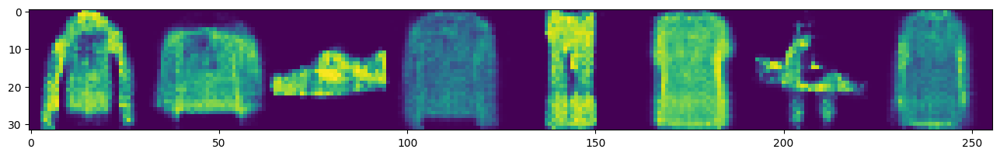

In [ ]:
gan = GANManager() # You can pass your arguments to the call.
gan_history = gan.train(dataloader)

**I Used Model-1 because it seems to have better result**

### ❓ **Question 3**
> - *(4 points)* How can we generate images from a specific class in GAN? 
- *(Bonus - 15 points)* Implement your idea and plot 8 images from each of the 10 classes.


For this we need to add embedded class labels to our input in generative and discriminator. This can be done by adding a one-hot encoding of the class label as an additional input to the generator network. During training, both the generator and discriminator receive the class label as input, and the discriminator attempts to classify whether the generated image is real or fake while also predicting the class label.

### Conditional Normal GAN

In [ ]:
class ConditionalGenerator(nn.Module):
    def __init__(self, z_dim, image_size=32):
        super(ConditionalGenerator, self).__init__()

        ##########################################################
        # TODO (2 points): 
        # Define the generator model here. You may use linear layers, 
        # normalization layers, and activation layers.  
        ##########################################################
        self.z_dim = z_dim
        self.image_size = image_size

        self.embedding = nn.Embedding(10, 10)

        self.net = nn.Sequential(
            nn.Linear(z_dim + 10, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2),
            nn.Linear(128, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2),
            nn.Linear(512, 1024),
            nn.BatchNorm1d(1024),
            nn.LeakyReLU(0.2),
            nn.Linear(1024, image_size * image_size),
            nn.Tanh()
        )
        

    def forward(self, z, labels): 

        img = None

        ##########################################################
        # TODO (2 points): 
        # Generate images from the random noise `z`.
        ##########################################################
        # x = nn.functional.leaky_relu(self.fc1(z), 0.2)
        # x = nn.functional.leaky_relu(self.fc2(x), 0.2)
        # x = nn.functional.tanh(self.fc3(x))
        # img = x.view(-1, 1, self.image_size, self.image_size)
        gen_input = torch.cat((z, self.embedding(labels)), -1)
        img = self.net(gen_input)
        img = img.view(-1, 1, self.image_size, self.image_size)
        return img

class ConditionalDiscriminator(nn.Module):
    def __init__(self, image_size=32):
        super(ConditionalDiscriminator, self).__init__()
        
        ##########################################################
        # TODO (2 points): 
        # Define the Discriminator model here. You may use linear 
        # layers, normalization layers, and activation layers.  
        ##########################################################
        self.image_size = image_size
        self.embedding = nn.Embedding(10, 10)

        self.net = nn.Sequential(
            nn.Linear(image_size * image_size + 10, 512),
            nn.BatchNorm1d(512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 128),
            nn.BatchNorm1d(128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 1),
            nn.Sigmoid(),
        )


    def forward(self, x, labels):

        real_or_fake = None

        ##########################################################
        # TODO (2 points): 
        # Predict whether each image in `img` is real or fake.
        ##########################################################
        x = x.view(-1, self.image_size * self.image_size)
        x = torch.cat((x, self.embedding(labels)), -1)
        real_or_fake = self.net(x)
        return real_or_fake

class ConditionalGANManager():
    def __init__(self, image_size=32, z_dim=100):
        
        ##########################################################
        # TODO (3 points): 
        # 1) Instantiate the Generator and the Discriminator.
        # 2) Define your optimizer(s). You can use Adam.
        ##########################################################

        self.image_size = image_size
        self.z_dim = z_dim

        self.generator = ConditionalGenerator(z_dim=self.z_dim, image_size=image_size).to(DEVICE)
        self.discriminator = ConditionalDiscriminator(image_size=image_size).to(DEVICE)

        self.G_optimizer = optim.Adam(self.generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.D_optimizer = optim.Adam(self.discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

        self.BCE_loss = nn.BCELoss()

    def train(self, dataloader, **kwargs):

        history = dict(g_loss=[], d_loss=[])
        for epoch in range(EPOCHS):
            total_g_loss = []
            total_d_loss = []
            for i, (batch_x, labels) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)

                ##########################################################
                # TODO (15 points): 
                # Calculate the loss for the Generator and the Discriminator.
                # Perform the optimization on `batch_x`.
                ##########################################################

                #init 
                batch_size = batch_x.shape[0]
                y_real = torch.ones(batch_size, 1).to(DEVICE)
                y_fake = torch.zeros(batch_size, 1).to(DEVICE)
                z = torch.randn(batch_size, self.z_dim).to(DEVICE)

                real_labels = labels.type(torch.LongTensor).to(DEVICE)
                fake_labels = torch.LongTensor(batch_size).random_(0, 10).to(DEVICE)


                #train descriminator
                self.D_optimizer.zero_grad()

                D_real = self.discriminator(batch_x, real_labels)
                d_loss_real = self.BCE_loss(D_real, y_real) 

                generated = self.generator(z, fake_labels)
                D_fake = self.discriminator(generated, fake_labels)
                d_loss_fake = self.BCE_loss(D_fake, y_fake)

                discriminator_loss = d_loss_real + d_loss_fake
                total_d_loss.append(discriminator_loss.item())

                discriminator_loss.backward()
                self.D_optimizer.step()


                self.G_optimizer.zero_grad()
                #train the generator
                generated = self.generator(z, real_labels)
                D_fake = self.discriminator(generated, real_labels)
                generator_loss = self.BCE_loss(D_fake, y_real)
                total_g_loss.append(generator_loss.item())

                generator_loss.backward()
                self.G_optimizer.step()
                


            mean_d_loss = np.mean(total_d_loss)
            mean_g_loss = np.mean(total_g_loss)

            print(
                "[Epoch: %d/%d] [D loss: %.4f] [G loss: %.4f]"
                % (epoch+1, EPOCHS, mean_d_loss, mean_g_loss)
            )
            
            if epoch % 4 == 0:
              self.sample(8, plot=True)

            history['d_loss'].append(mean_d_loss)
            history['g_loss'].append(mean_g_loss)

        return history

    def sample(self, n, plot=True):

        ##########################################################
        # TODO (1 points): 
        # First, assign proper Gaussian noises to `z`.
        # Then, use can see that by using the Generator, we can
        # make new images and plot them.
        ##########################################################

        for i in range(n):
          z = torch.randn(10, self.z_dim).to(DEVICE)
          label = torch.tensor([0, 1, 2, 3, 4, 5, 6, 7, 8, 9]).to(DEVICE)
          with torch.no_grad():
              gen_imgs = self.generator(z, label)
              if plot:
                  plot_images(gen_imgs)
              # return gen_imgs

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 1/40] [D loss: 1.1926] [G loss: 0.7937]


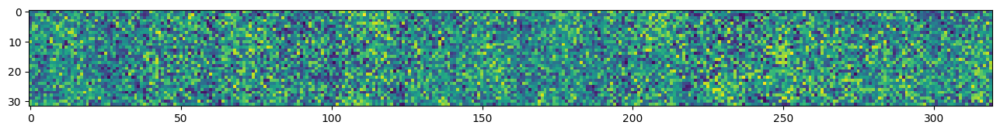

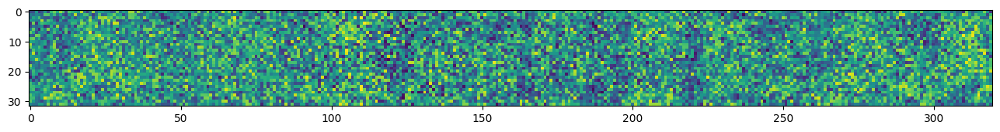

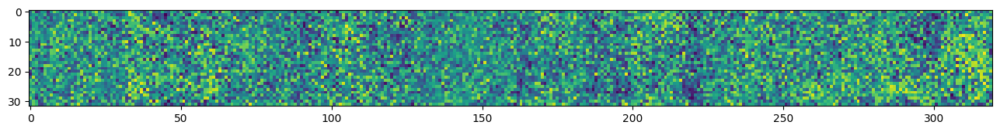

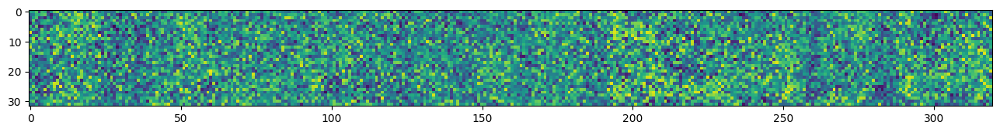

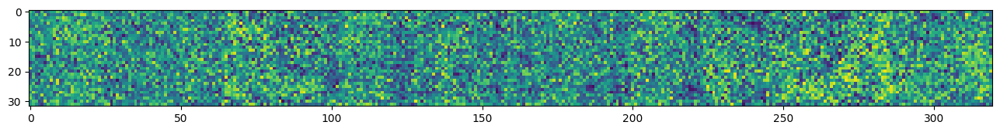

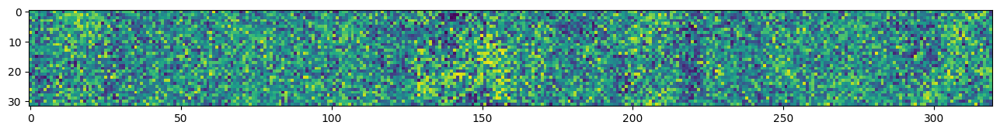

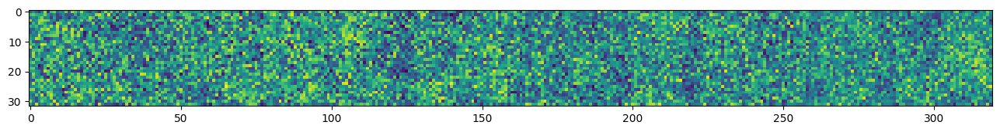

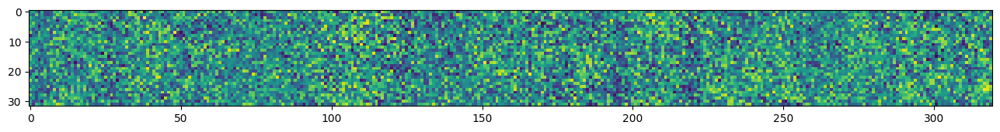

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 2/40] [D loss: 1.1363] [G loss: 0.8428]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 3/40] [D loss: 1.0722] [G loss: 0.9308]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 4/40] [D loss: 1.0236] [G loss: 0.9802]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 5/40] [D loss: 1.0897] [G loss: 0.9883]


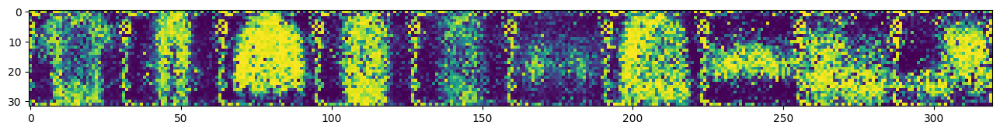

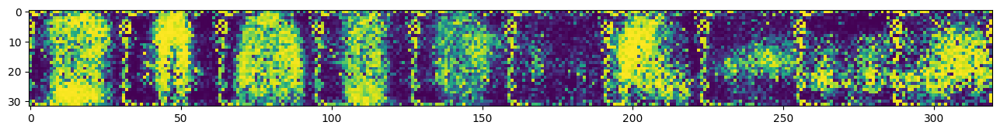

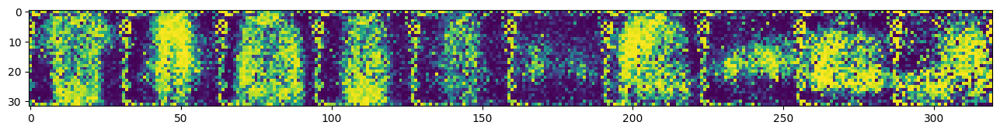

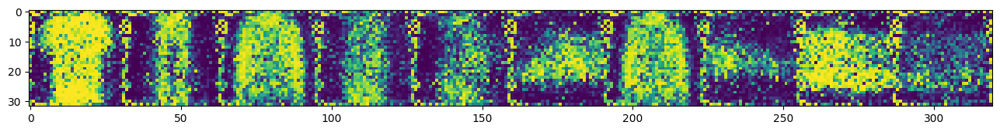

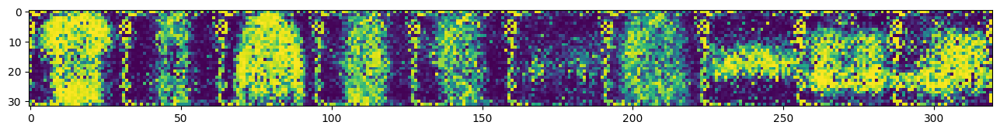

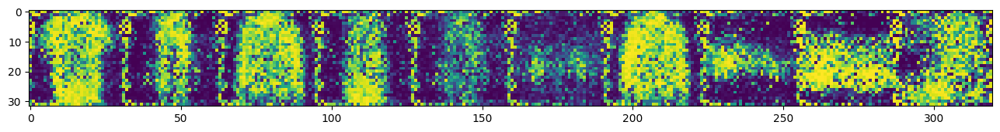

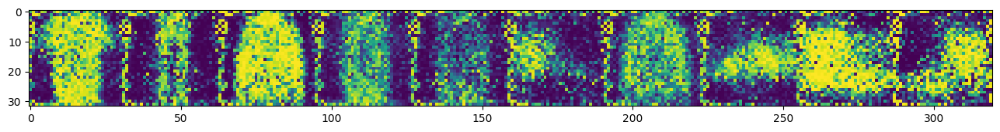

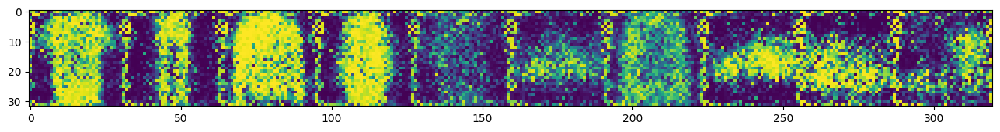

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 6/40] [D loss: 1.0970] [G loss: 1.0045]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 8/40] [D loss: 1.1041] [G loss: 1.0386]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 9/40] [D loss: 1.0689] [G loss: 1.0718]


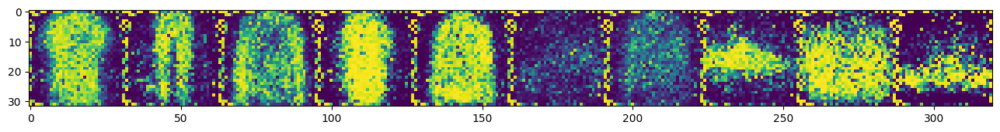

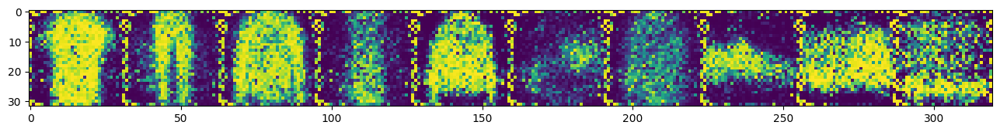

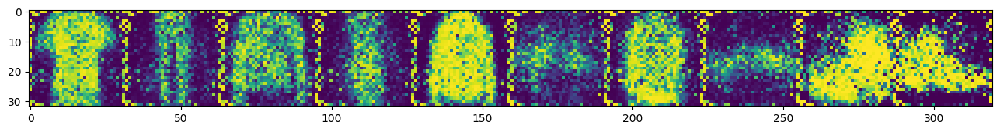

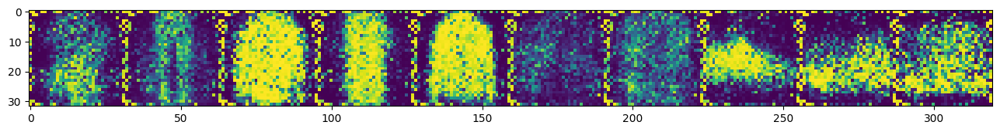

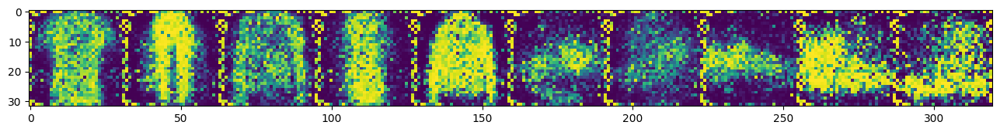

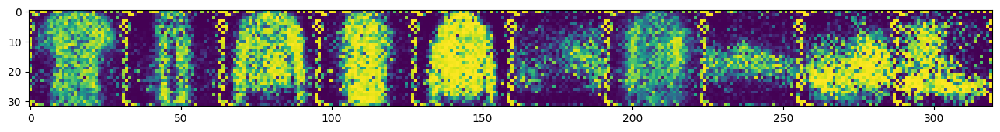

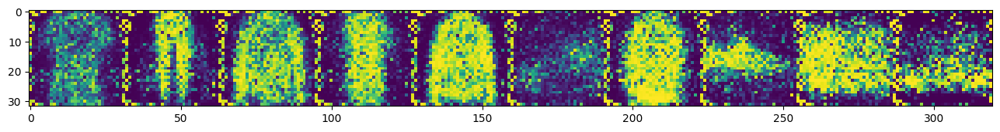

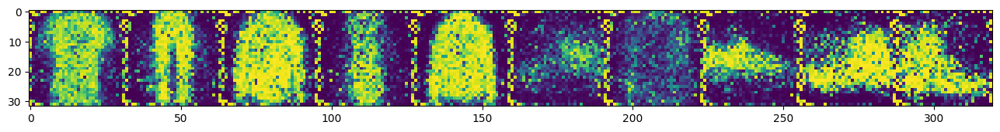

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 10/40] [D loss: 1.1401] [G loss: 1.0236]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 11/40] [D loss: 1.1533] [G loss: 1.0085]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 12/40] [D loss: 1.1630] [G loss: 1.0122]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 13/40] [D loss: 1.1336] [G loss: 1.0360]


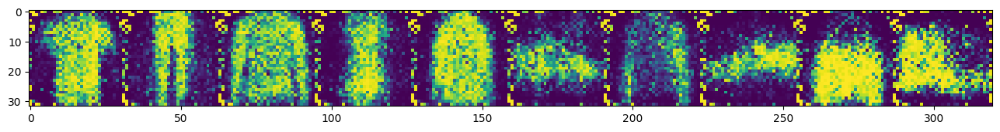

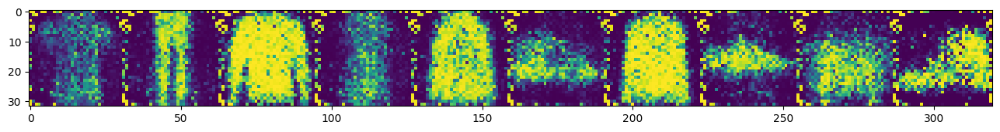

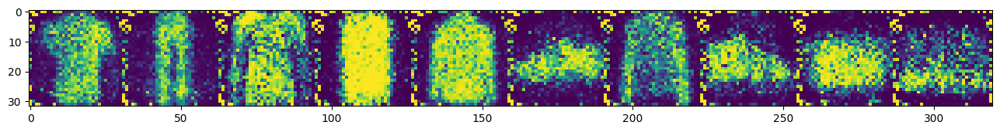

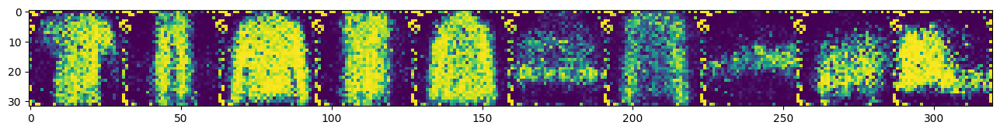

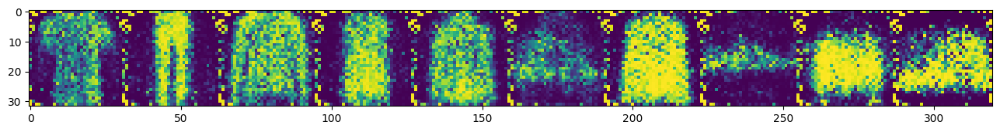

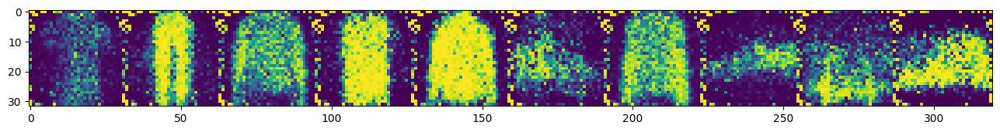

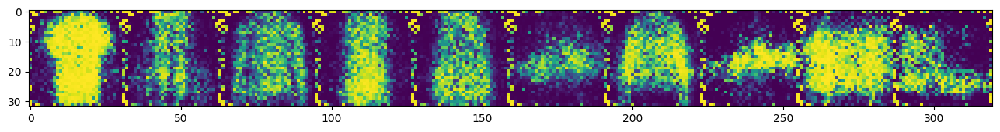

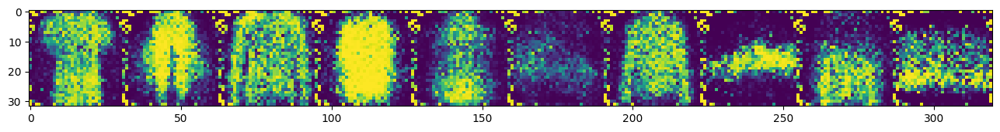

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 14/40] [D loss: 1.1235] [G loss: 1.0341]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 15/40] [D loss: 1.1116] [G loss: 1.0684]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 16/40] [D loss: 1.1001] [G loss: 1.0659]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 17/40] [D loss: 1.1089] [G loss: 1.0673]


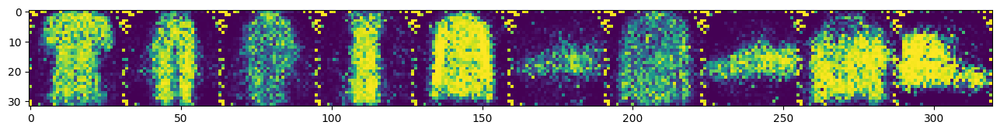

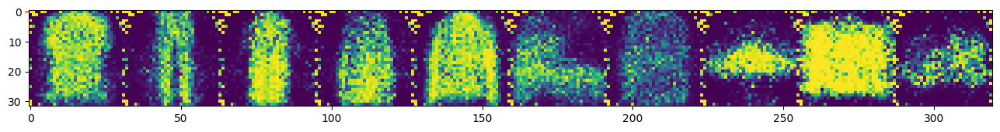

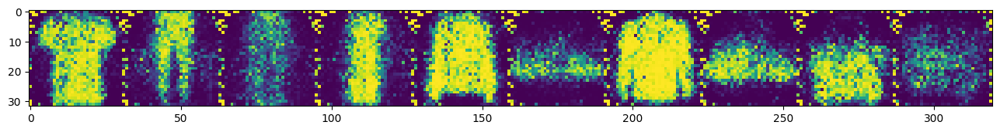

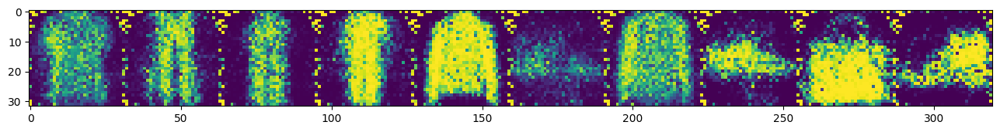

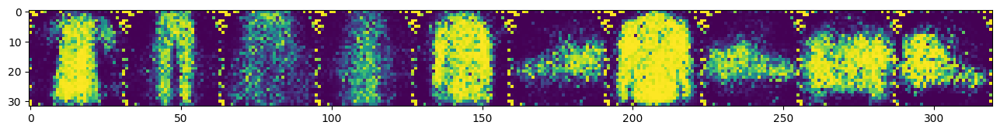

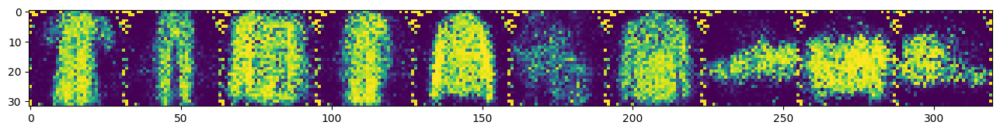

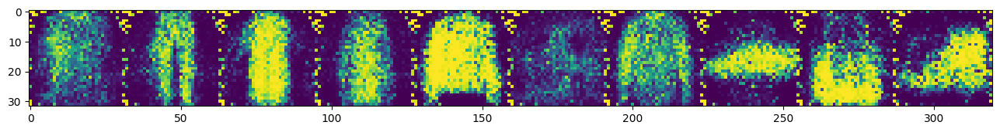

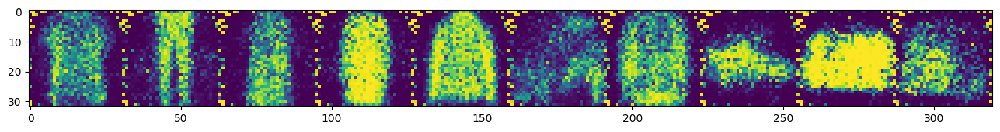

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 18/40] [D loss: 1.1274] [G loss: 1.0620]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 19/40] [D loss: 1.1246] [G loss: 1.0863]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 20/40] [D loss: 1.1456] [G loss: 1.0757]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 21/40] [D loss: 1.1525] [G loss: 1.0714]


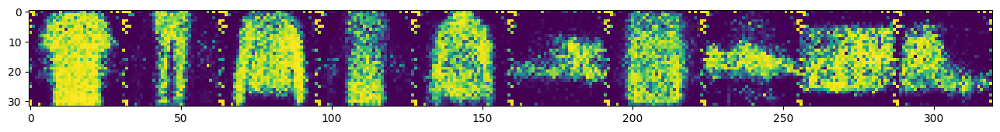

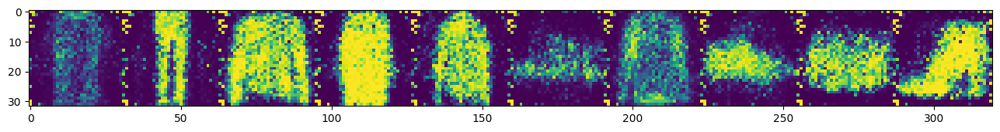

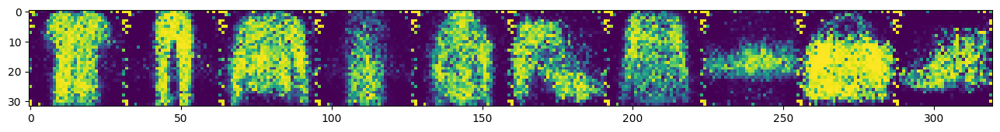

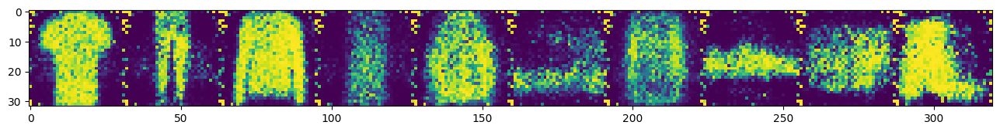

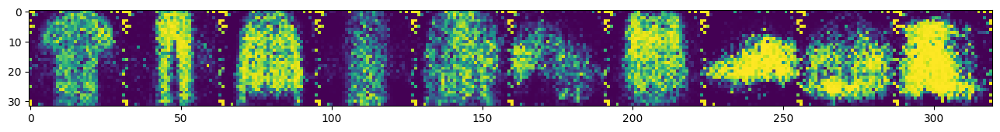

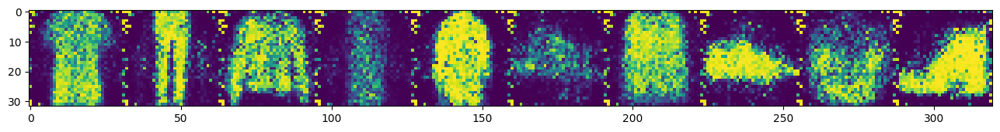

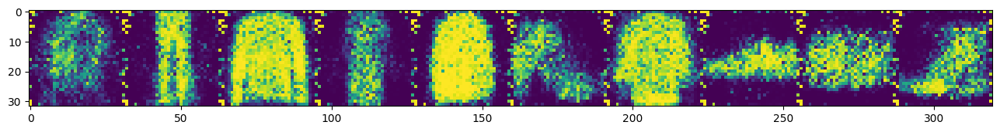

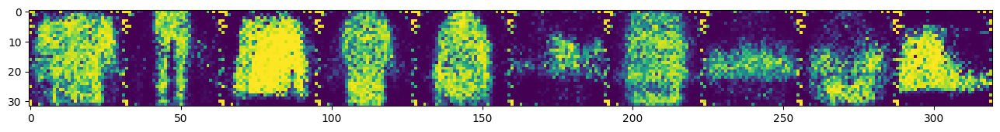

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 22/40] [D loss: 1.1847] [G loss: 1.0293]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 23/40] [D loss: 1.1631] [G loss: 1.0591]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 24/40] [D loss: 1.1494] [G loss: 1.0846]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 25/40] [D loss: 1.1272] [G loss: 1.0954]


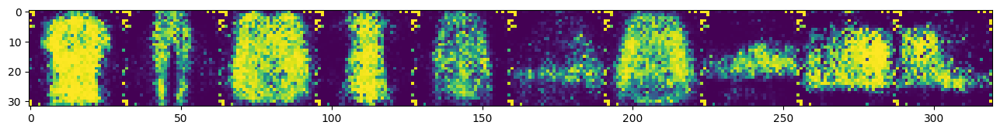

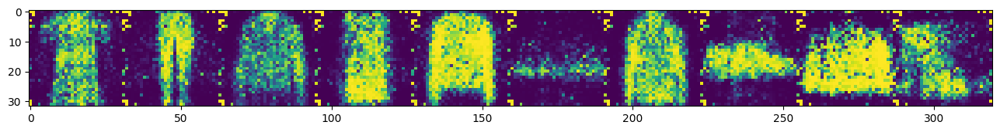

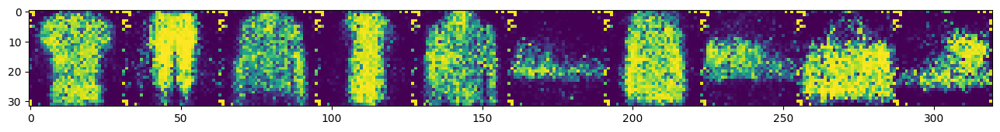

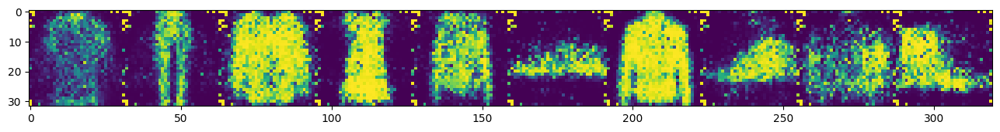

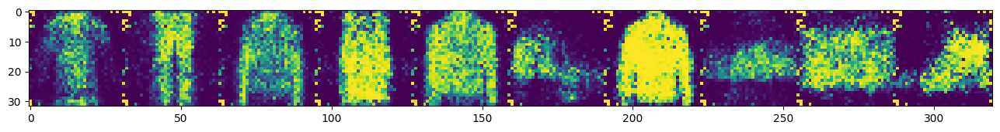

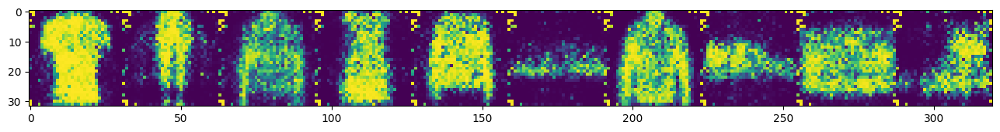

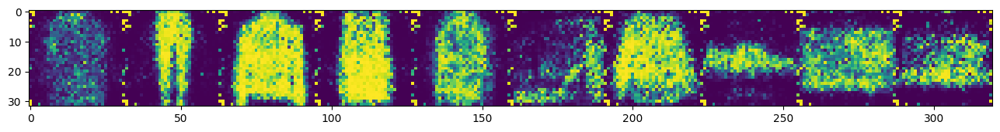

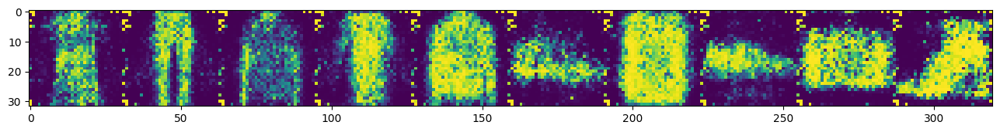

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 26/40] [D loss: 1.1412] [G loss: 1.1056]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 27/40] [D loss: 1.1556] [G loss: 1.0962]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 28/40] [D loss: 1.1612] [G loss: 1.0866]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 29/40] [D loss: 1.1601] [G loss: 1.0913]


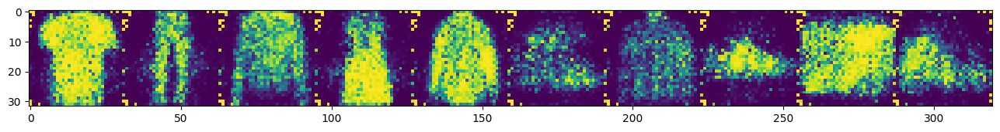

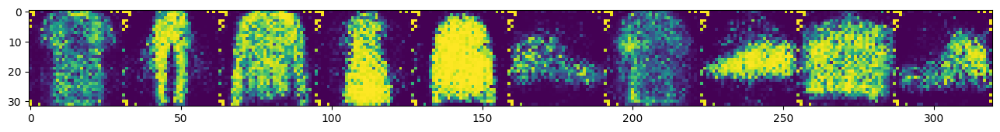

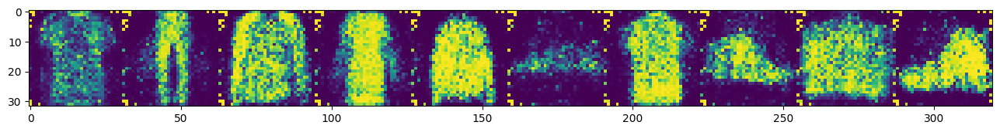

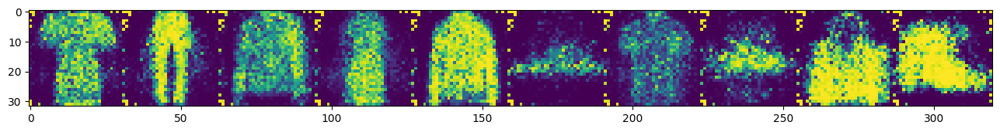

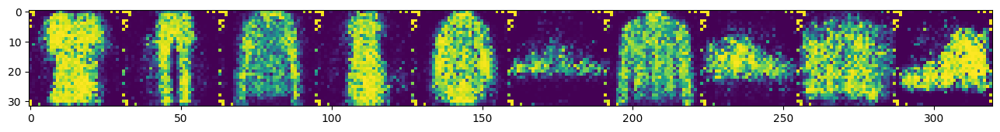

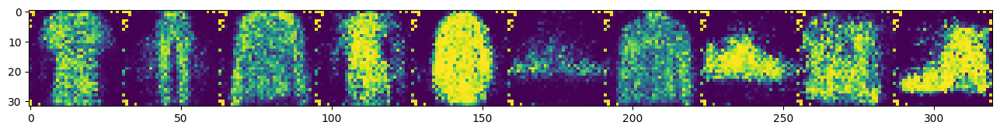

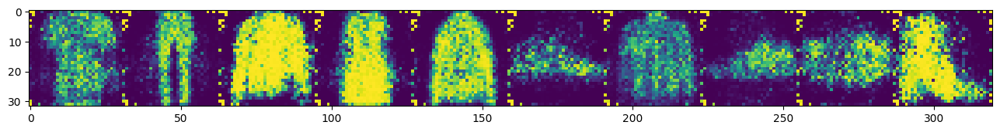

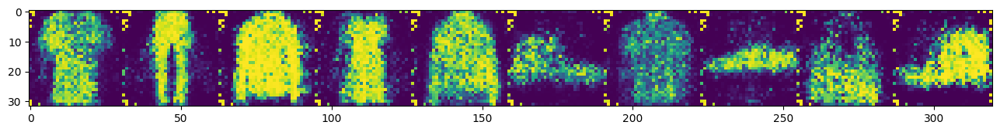

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 30/40] [D loss: 1.1659] [G loss: 1.0747]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 31/40] [D loss: 1.1661] [G loss: 1.0770]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 32/40] [D loss: 1.1630] [G loss: 1.0883]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 33/40] [D loss: 1.1469] [G loss: 1.1023]


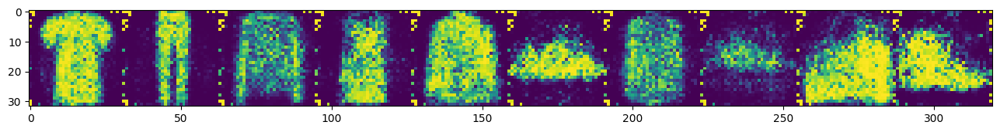

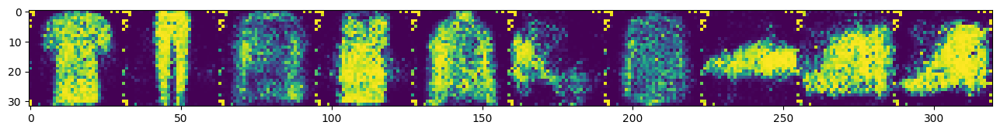

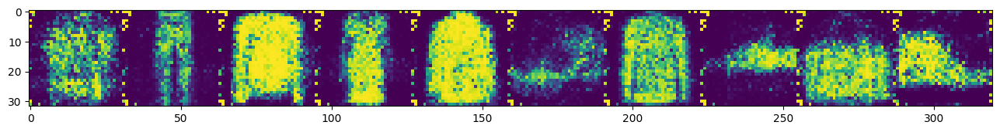

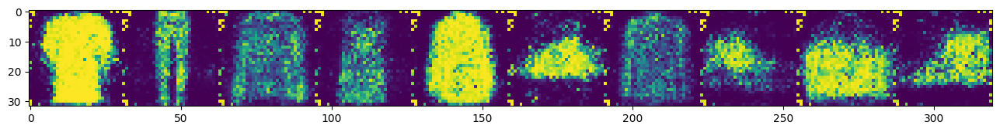

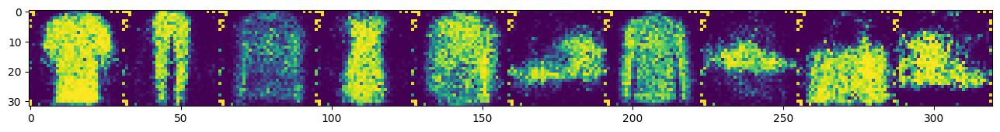

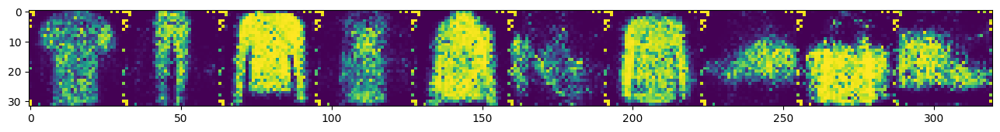

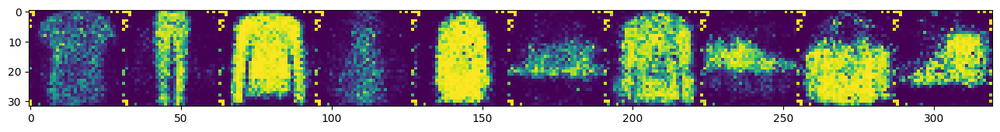

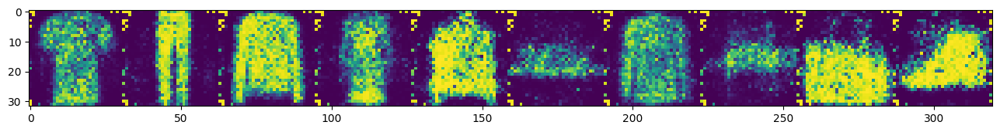

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 34/40] [D loss: 1.1392] [G loss: 1.1190]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 35/40] [D loss: 1.1596] [G loss: 1.1362]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 36/40] [D loss: 1.1448] [G loss: 1.1457]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 37/40] [D loss: 1.1450] [G loss: 1.1316]


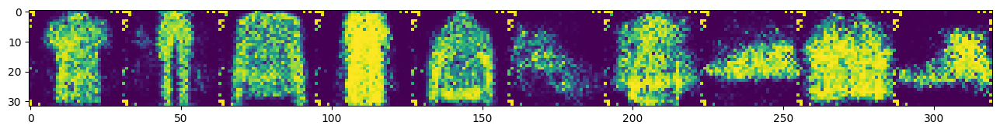

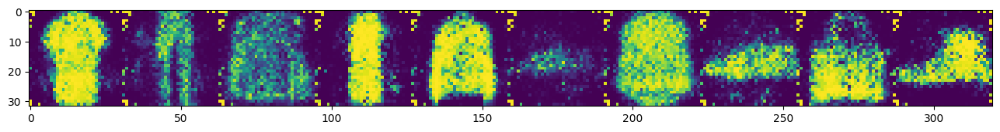

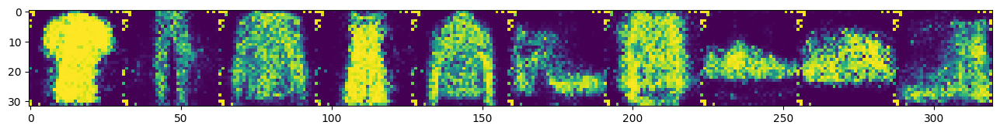

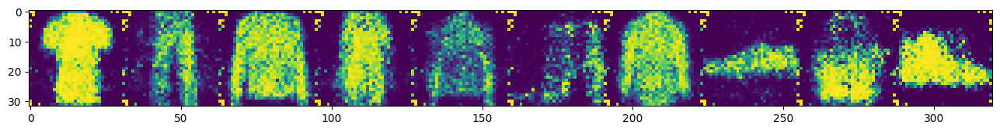

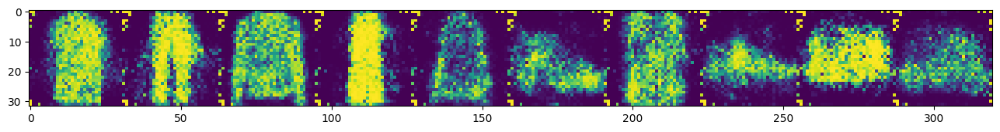

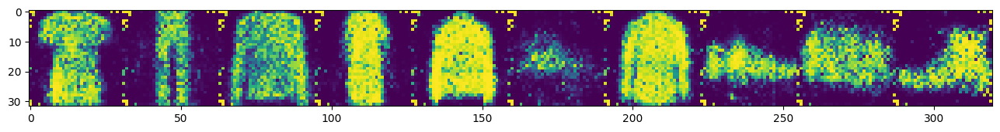

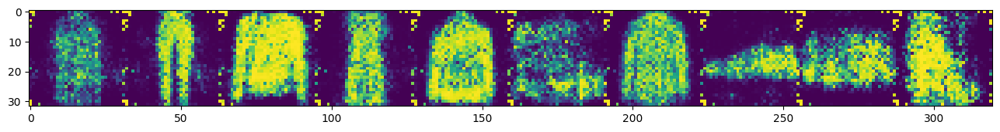

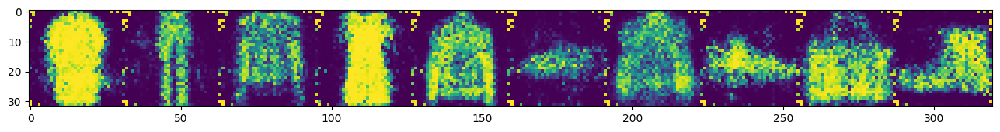

  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 38/40] [D loss: 1.1570] [G loss: 1.1201]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 39/40] [D loss: 1.1605] [G loss: 1.1363]


  0%|          | 0/58 [00:00<?, ?it/s]

[Epoch: 40/40] [D loss: 1.1457] [G loss: 1.1170]


{'g_loss': [0.7937042322652094,
  0.8428106924583172,
  0.9308400400753679,
  0.9802208871677004,
  0.9883436437310844,
  1.0045412480831146,
  0.9899832462442333,
  1.0385514374437004,
  1.071821928024292,
  1.0236348674215119,
  1.008491642516235,
  1.012161142867187,
  1.0359520686083827,
  1.0340895005341233,
  1.068418245891045,
  1.0659255827295369,
  1.067286505781371,
  1.0619647081555992,
  1.0862879968922714,
  1.0757439054291824,
  1.071391189920491,
  1.0293107310245777,
  1.0590689511134708,
  1.084555742041818,
  1.0953662426307285,
  1.1056015851168797,
  1.0962407218998875,
  1.0865751032171578,
  1.0913157010900563,
  1.0747270399126514,
  1.0770102944867364,
  1.0882854019773418,
  1.1023480666094814,
  1.1189700036213315,
  1.1361743530322765,
  1.145659405609657,
  1.1316046868932659,
  1.120114028453827,
  1.1362860572749172,
  1.1169896536859973],
 'd_loss': [1.192624938899073,
  1.1362843883448634,
  1.0722319257670436,
  1.023581123557584,
  1.089728739754907,
 

In [ ]:
con_gan = ConditionalGANManager() # You can pass your arguments to the call.
con_gan_history = con_gan.train(dataloader)
con_gan_history

### Conditional Convolution GAN

من هر کانولوشنی که میزدم نتیجه خیلی خوبی نمیداد. حتی وقتی تو دیکریمینیتور هم میزاشتم نتیجش جالب نمیشدش. تو عکسای بالا هم اگر دقت کنید حاشیه های تصویر نویز داره که ماله اینه که دیسکریمینیتورم توش کانولوشن نداره. ولی تصاویری که جنریت کرده خوبه خداییش :)

## DDPM (73 + 25 points)

Denoising diffusion probabilistic models (DDPMs) learn to generate images by gradually denoising a completely random pattern in a step-by-step process. The model learns a set of diffusion steps that describe how the noise evolves through time and a denoising function that removes the noise at each time step. The denoising function is typically implemented as a neural network that takes in the noisy data and the time step as input and outputs the denoised data. After iterative denoising steps over a time index, an image from the training distribution is generated. The overall procedure of training and sampling from DDPM is represented in the following pseudocodes from DDPM paper. For more details on the loss function and the sampling process, please refer to the course slides and the paper.

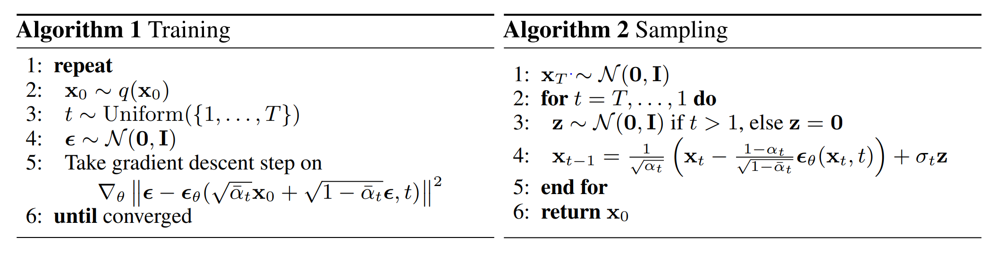

The pseudocode shows that the loss function is defined as an MSE on per time step noise and the predicted noise for the current time step. So we only need to train a model that learns to reverse the noise from an input image at a specific time step. In this notebook, we will use the architecture proposed by the paper, a UNet with image and time as the inputs and predicted noise as the output. They augment the regular UNet with several sub-modules and techniques such as ResNets, Attention modules, etc. We describe the expected architecture for this notebook:

+ *ResNet:* As a base sub-module, we define each ResNet block as two consecutive convolutional layers with a GELU activation in between and Group Normalization after each convolutional layer. You can use this module in Down/Up blocks. Also, by removing the residual connection, you can use this block as a convolutional network throughout the network.
+ *Attention:* This is also a sub-module consisting of a Layer Normalization, Multi-head Attention (use from `torch.nn`), a residual connection, a feed-forward network, and another residual connection.
+ *Conditional UNet:* Each Up/Down block in UNet accepts positionally-encoded time as an input. The time index is encoded and added to the output of the block. You can use the sinusoidal position embeddings proposed in [Attention is All You Need.](https://arxiv.org/pdf/1706.03762.pdf)

You can implement the following structure for UNet:

+ Convolutional block
+ Down block
+ Attention 
+ Down block
+ Attention
+ Down block
+ Attention

+ Convolutional block (bottleneck)
+ Convolutional block (bottleneck)
+ Convolutional block (bottleneck)

+ Up block
+ Attention
+ Up block
+ Attention
+ Up block
+ Attention
+ Convolutional block

In [ ]:
##########################################################
# TODO (40 points): 
# Complete each class based on the previous explanations.
##########################################################

class ConvResNet(nn.Module):
    def __init__(self, in_channels, out_channels, residual=False, kernel_size=3, padding=1):
        super(ConvResNet, self).__init__()
        self.residual = residual
        self.conv_net = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding),
            nn.GroupNorm(1, out_channels),
            nn.GELU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding),
            nn.GroupNorm(1, out_channels),
        )
          

    def forward(self, x):
        if self.residual:
            return x + self.conv_net(x)
        else:
            return self.conv_net(x)

def encoding(t, channel_size, embeding_size, T=10000):
        inv_freq = (
            1.0 / 
             (T ** (torch.arange(0, channel_size, 2, device=DEVICE).float() / channel_size))
        )
        positional_encoding = (
            torch.cat([
                torch.sin(t.repeat(1, channel_size // 2) * inv_freq), 
                torch.cos(t.repeat(1, channel_size // 2) * inv_freq)
                ], dim=-1)
            .view(-1, channel_size, 1, 1)
            .repeat(1, 1, embeding_size, embeding_size)
        )
        return  positional_encoding

class Down(nn.Module):
    def __init__(self, in_channels, out_channels, embeding_size):
        super(Down, self).__init__()
        self.net = nn.Sequential(
            ConvResNet(in_channels, in_channels, True), 
            ConvResNet(in_channels, out_channels), 
        )
        self.max_pooling = nn.MaxPool2d(2)
        self.out_channels = out_channels
        self.embeding_size = embeding_size

    def forward(self, x, t):
        skip = self.net(x)
        out = self.max_pooling(skip)
        out = out + encoding(t, self.out_channels, self.embeding_size)
        return out, skip


class Up(nn.Module):
    def __init__(self, in_channels, out_channels, embeding_size):
        super(Up, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels//2, kernel_size=(2, 2), stride=2, padding=0)
        self.net = nn.Sequential(
            ConvResNet(in_channels, in_channels, residual=True),
            ConvResNet(in_channels, out_channels),
        )
        self.in_channels = in_channels
        self.embeding_size = embeding_size

    def forward(self, x, skip, t):
        x = self.up(x)
        # print(skip.shape)
        x = torch.cat((skip, x), 1)
        x = x + encoding(t, self.in_channels, self.embeding_size)
        return self.net(x)


class Attention(nn.Module):
    def __init__(self, hidden_dim, embeding_size, n_heads=4):
        super().__init__()
        self.embeding_size = embeding_size
        self.hidden_dim = hidden_dim

        self.norm = nn.LayerNorm(hidden_dim)

        self.multihead_attn = nn.MultiheadAttention(hidden_dim, n_heads, batch_first=True)

        self.feedforward = nn.Sequential( 
            nn.LayerNorm(hidden_dim),
            nn.Linear(hidden_dim, 2 * hidden_dim),
            nn.ReLU(),
            nn.Linear(2 * hidden_dim, hidden_dim),
        )

    def forward(self, x):
        x = x.view(-1, self.hidden_dim, self.embeding_size * self.embeding_size).swapaxes(1, 2)
        # print(x.shape)
        norm_x = self.norm(x)

        attn_output, _ = self.multihead_attn(norm_x, norm_x, norm_x)
        attn_output = attn_output + x
        attn_output = self.feedforward(attn_output) + attn_output
        # print(attn_output.shape)
        attn_output = attn_output.swapaxes(2, 1).view(-1, self.hidden_dim, self.embeding_size, self.embeding_size)
        return attn_output


class UNet(nn.Module):
    def __init__(self, *args, **kwargs):
        super(UNet, self).__init__()
        self.conv1 = ConvResNet(1, 16)

        self.down1 = Down(16, 32, 16)
        self.attn1 = Attention(32, 16)

        self.down2 = Down(32, 64, 8)
        self.attn2 = Attention(64, 8)

        self.down3 = Down(64, 128, 4)
        self.attn3 = Attention(128, 4)

        self.net = nn.Sequential(
            ConvResNet(128, 128),
            ConvResNet(128, 256),
        )

        self.up1 = Up(256, 128, 8)
        self.attn4 = Attention(128, 8)

        self.up2 = Up(128, 64, 16)
        self.attn5 = Attention(64, 16)

        self.up3 = Up(64, 32, 32)
        self.attn6 = Attention(32, 32)


        self.output = nn.Conv2d(32, 1, kernel_size=1)


    def forward(self, x, t):
        x = self.conv1(x)
        x, skip_1 = self.down1(x, t) 
        x = self.attn1(x)
        x, skip_2 = self.down2(x, t)  
        x = self.attn2(x)
        x, skip_3 = self.down3(x, t) 
        x = self.attn3(x)
        
        x = self.net(x)
        
        x = self.up1(x, skip_3, t)
        x = self.attn4(x)
        x = self.up2(x, skip_2, t)
        x = self.attn5(x)
        x = self.up3(x, skip_1, t)
        x = self.attn6(x)
        
        return self.output(x)


In [ ]:
import math
from torch.optim.lr_scheduler import ReduceLROnPlateau

class DDPMManager():
    def __init__(self):

        self.T = 1000
        self.beta_start = 1e-4 # \beta_t is the sqrt(\sigma_t) from the pseudocode.
        self.beta_end = 0.02

        ##########################################################
        # TODO (6 points): 
        # Instantiate the model and the optimizer. You can use Adam.
        # Define \alpha, \beta, and \bar{alpha} for all T time steps. 
        # Use cosine scheduling for \beta.
        ##########################################################

        self.beta_list = torch.tensor(
             -1 * 
             np.cos(np.pi * np.linspace(0, self.T, self.T) / (2 * self.T)) * 
             (self.beta_end - self.beta_start) + self.beta_end, 
             dtype=torch.float32, device=DEVICE
             )
        self.alpha_list = 1 - self.beta_list

        self.alpha_bar_lsit = torch.tensor(
            [torch.prod(self.alpha_list[:i + 1]) 
            for i in range(len(self.alpha_list))]
            ).to(DEVICE)


        self.unet = UNet().to(DEVICE)
        self.optimizer = torch.optim.Adam(self.unet.parameters(), lr=0.0002)
        self.lr_scheduler = ReduceLROnPlateau(self.optimizer, mode='min', 
                                              factor=0.2, patience=5, 
                                              verbose=True)

    def train(self, dataloader, **kwargs):

        history = dict(loss=[])
        for epoch in range(EPOCHS):
            total_loss = []
            for i, (batch_x, _) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)

                ##########################################################
                # TODO (15 points): 
                # Sample a time step `t` and create noisy images for the  
                # `t`th step of the diffusion according to \bar{alpha} 
                # values. Then predict the noise using self.unet.
                # Compute the loss and backpropagate.
                ##########################################################

                self.optimizer.zero_grad()

                t_list = torch.randint(0, self.T, [batch_x.size(0)]).to(DEVICE)
                epsilons = torch.randn(batch_x.shape).to(DEVICE)

                image_t = []
                for index, t in enumerate(t_list):
                    alpha_bar = self.alpha_bar_lsit[t]
                    image_t.append(
                        (math.sqrt(alpha_bar) * batch_x[index]) + 
                        (math.sqrt(1 - alpha_bar) * epsilons[index])
                    )
                image_t = torch.stack(image_t, dim=0)

                t = t_list.unsqueeze(-1).type(torch.float)
                pred = self.unet(image_t, t)

                loss = F.mse_loss(pred.reshape(-1, 32 * 32), 
                                  epsilons.reshape(-1, 32 * 32))
                
                loss.backward()
                self.optimizer.step()
                total_loss.append(loss.item())

            mean_loss = np.mean(total_loss)
            print(
                "[Epoch: %d/%d] [loss: %.4f]"
                % (epoch+1, EPOCHS, mean_loss)
            )

            if epoch % 4 == 0:
              self.sample(8, plot=True)

            history['loss'].append(mean_loss)

        return history
    
    def sample(self, n, plot=True):

        ##########################################################
        # TODO (8 points): 
        # Generate a random pattern `x`. 
        # Then denoise `x` for self.T time steps.
        # Choose `n` images from the generated images during self.T 
        # time steps (`xs`).
        # The purpose is to show how denoising converts the pure 
        # noise to an image after self.T time steps.
        ##########################################################

        with torch.no_grad():
            x = torch.randn(1, 1, 32, 32).to(DEVICE)
            xs = []
            for t in range(self.T)[::-1]:
              if t == 0:
                epslions = torch.zeros(1, 1, 32, 32).to(DEVICE)
              else:
                epslions = torch.randn(1, 1, 32, 32).to(DEVICE)

              
              pred = self.unet(x, torch.tensor(t).to(DEVICE))
              x = (
                   1 / math.sqrt(self.alpha_list[t]) * 
                   (x - (1 - self.alpha_list[t]) * pred / 
                    math.sqrt(1- self.alpha_bar_lsit[t]))
              )
              x = x + math.sqrt(self.beta_list[t]) * epslions

              #firs image, last image and 6 other 
              if t % (self.T // n) == 8:
                xs.append(x.clone().cpu().reshape(1, 1, 32, 32))                  

            xs = torch.cat(xs, dim=0).reshape(n, 1, 32, 32)
            if plot:
                plot_images(xs)
            return x

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 1/40] [loss: 0.1232]


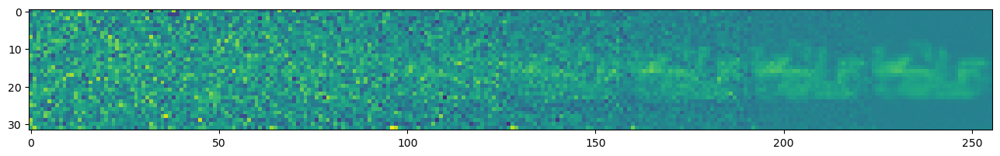

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 2/40] [loss: 0.0663]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 3/40] [loss: 0.0599]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 4/40] [loss: 0.0553]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 5/40] [loss: 0.0537]


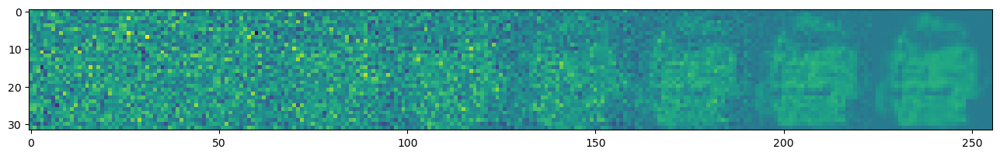

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 6/40] [loss: 0.0525]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 7/40] [loss: 0.0512]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 8/40] [loss: 0.0505]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 9/40] [loss: 0.0494]


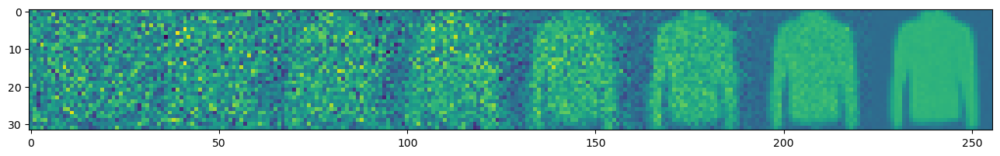

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 10/40] [loss: 0.0487]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 11/40] [loss: 0.0479]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 12/40] [loss: 0.0480]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 13/40] [loss: 0.0472]


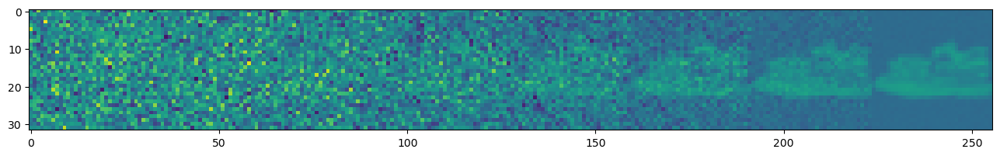

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 14/40] [loss: 0.0465]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 15/40] [loss: 0.0466]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 16/40] [loss: 0.0464]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 17/40] [loss: 0.0460]


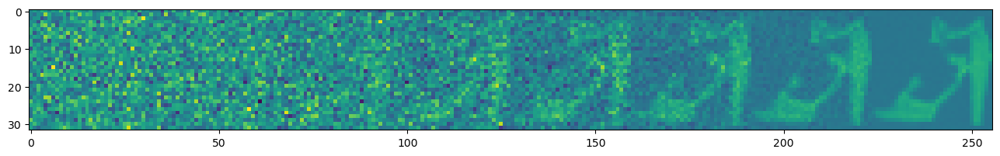

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 18/40] [loss: 0.0454]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 19/40] [loss: 0.0454]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 20/40] [loss: 0.0446]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 21/40] [loss: 0.0450]


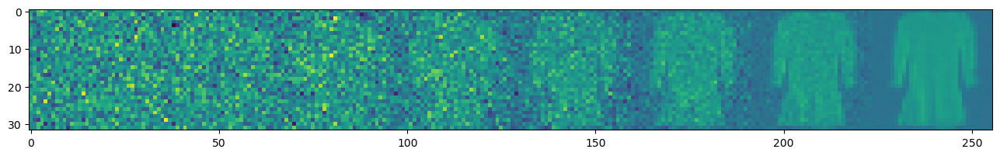

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 22/40] [loss: 0.0446]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 23/40] [loss: 0.0443]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 24/40] [loss: 0.0443]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 25/40] [loss: 0.0448]


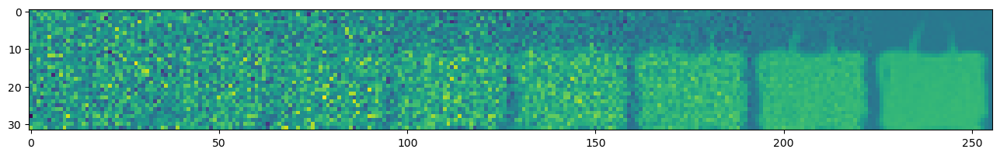

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 26/40] [loss: 0.0443]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 27/40] [loss: 0.0434]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 28/40] [loss: 0.0436]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 29/40] [loss: 0.0434]


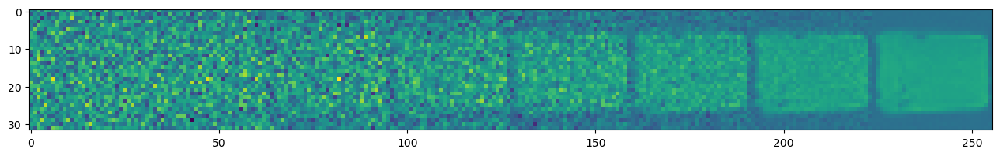

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 30/40] [loss: 0.0437]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 31/40] [loss: 0.0441]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 32/40] [loss: 0.0439]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 33/40] [loss: 0.0428]


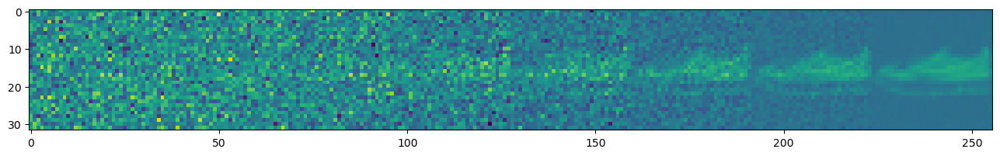

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 34/40] [loss: 0.0431]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 35/40] [loss: 0.0428]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 36/40] [loss: 0.0433]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 37/40] [loss: 0.0429]


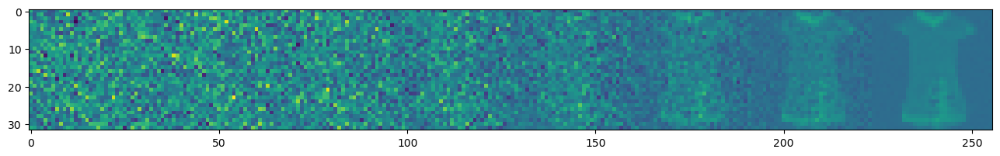

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 38/40] [loss: 0.0427]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 39/40] [loss: 0.0428]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 40/40] [loss: 0.0427]


{'loss': [0.12315948924950246,
  0.0663062091101768,
  0.05994350082671375,
  0.05529570178374282,
  0.05366390713330521,
  0.052523911138449814,
  0.05123222136836233,
  0.05054902792843645,
  0.04937882771121145,
  0.0487411157541144,
  0.04791239184290648,
  0.047952439429252355,
  0.04722794671140396,
  0.04646202368639894,
  0.04664733003041724,
  0.04644469871695612,
  0.0459634140750101,
  0.04543917900668964,
  0.045429827909809296,
  0.04458911861854595,
  0.04503936261900779,
  0.044617061740783386,
  0.04426446330824046,
  0.044260210634915906,
  0.04475602961822215,
  0.044291385118486785,
  0.04343828267498357,
  0.04360298128160494,
  0.04344416009371538,
  0.04369243279719683,
  0.044054255591210456,
  0.043930355248736216,
  0.04281238136512874,
  0.04313753624799539,
  0.042841017242270574,
  0.04331913196035485,
  0.042940305194071035,
  0.042737640903640454,
  0.04278000233259565,
  0.042728489280748905]}

In [ ]:
ddpm = DDPMManager() # You can pass your arguments to the call.
ddpm_history = ddpm.train(dataloader)
ddpm_history

### ❓ **Question 4**
> + *(4 points)* How can we generate images from a specific target class in DDPM?
+ *(Bonus - 25 points)* Implement your idea and plot one trajectory of denoised images per class.

Just like other generative model, i concat an embeding of labels with input. in this model, i also add label's embeding to botellneck layer becuase i just test it and it has better result, acctualy i search about it and the bottleneck layer of a DDPM model serves as a compressed representation of the input data. By adding an embedding of labels to the bottleneck layer, the model can learn to represent the label information in this compressed form, which can help capture the relationships between the input data and the labels. 

In [ ]:
##########################################################
# TODO (40 points): 
# Complete each class based on the previous explanations.
##########################################################

class ConConvResNet(nn.Module):
    def __init__(self, in_channels, out_channels, residual=False, kernel_size=3, padding=1):
        super(ConConvResNet, self).__init__()
        self.residual = residual
        self.conv_net = nn.Sequential(
            nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding),
            nn.GroupNorm(1, out_channels),
            nn.GELU(),
            nn.Conv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=kernel_size, padding=padding),
            nn.GroupNorm(1, out_channels),
        )
          

    def forward(self, x):
        if self.residual:
            return x + self.conv_net(x)
        else:
            return self.conv_net(x)

def encoding(t, channel_size, embeding_size, T=10000):
        inv_freq = (
            1.0 / 
             (T ** (torch.arange(0, channel_size, 2, device=DEVICE).float() / channel_size))
        )
        positional_encoding = (
            torch.cat([
                torch.sin(t.repeat(1, channel_size // 2) * inv_freq), 
                torch.cos(t.repeat(1, channel_size // 2) * inv_freq)
                ], dim=-1)
            .view(-1, channel_size, 1, 1)
            .repeat(1, 1, embeding_size, embeding_size)
        )
        return  positional_encoding

class ConDown(nn.Module):
    def __init__(self, in_channels, out_channels, embeding_size):
        super(ConDown, self).__init__()
        self.net = nn.Sequential(
            ConConvResNet(in_channels, in_channels, True), 
            ConConvResNet(in_channels, out_channels), 
        )
        self.max_pooling = nn.MaxPool2d(2)
        self.out_channels = out_channels
        self.embeding_size = embeding_size

    def forward(self, x, t):
        skip = self.net(x)
        out = self.max_pooling(skip)
        out = out + encoding(t, self.out_channels, self.embeding_size)
        return out, skip


class ConUp(nn.Module):
    def __init__(self, in_channels, out_channels, embeding_size):
        super(ConUp, self).__init__()
        self.up = nn.ConvTranspose2d(in_channels, in_channels//2, kernel_size=(2, 2), stride=2, padding=0)
        self.net = nn.Sequential(
            ConConvResNet(in_channels, in_channels, residual=True),
            ConConvResNet(in_channels, out_channels),
        )
        self.in_channels = in_channels
        self.embeding_size = embeding_size

    def forward(self, x, skip, t):
        x = self.up(x)
        # print(skip.shape)
        x = torch.cat((skip, x), 1)
        x = x + encoding(t, self.in_channels, self.embeding_size)
        return self.net(x)


class Attention(nn.Module):
    def __init__(self, hidden_dim, embeding_size, n_heads=4):
        super().__init__()
        self.embeding_size = embeding_size
        self.hidden_dim = hidden_dim

        self.norm = nn.LayerNorm(hidden_dim)

        self.multihead_attn = nn.MultiheadAttention(hidden_dim, n_heads, batch_first=True)

        self.feedforward = nn.Sequential( 
            nn.LayerNorm(hidden_dim),
            nn.Linear(hidden_dim, 2 * hidden_dim),
            nn.ReLU(),
            nn.Linear(2 * hidden_dim, hidden_dim),
        )

    def forward(self, x):
        x = x.view(-1, self.hidden_dim, self.embeding_size * self.embeding_size).swapaxes(1, 2)
        # print(x.shape)
        norm_x = self.norm(x)

        attn_output, _ = self.multihead_attn(norm_x, norm_x, norm_x)
        attn_output = attn_output + x
        attn_output = self.feedforward(attn_output) + attn_output
        # print(attn_output.shape)
        attn_output = attn_output.swapaxes(2, 1).view(-1, self.hidden_dim, self.embeding_size, self.embeding_size)
        return attn_output


class ConUNet(nn.Module):
    def __init__(self, *args, **kwargs):
        super(ConUNet, self).__init__()
        self.embeding = nn.Embedding(10, 32)


        self.conv1 = ConConvResNet(1 + 32, 16)

        self.down1 = ConDown(16, 32, 16)
        self.attn1 = Attention(32, 16)

        self.down2 = ConDown(32, 64, 8)
        self.attn2 = Attention(64, 8)

        self.down3 = ConDown(64, 128, 4)
        self.attn3 = Attention(128, 4)

        self.net = nn.Sequential(
            ConConvResNet(128 + 32, 128),
            ConConvResNet(128, 256),
        )

        self.up1 = ConUp(256, 128, 8)
        self.attn4 = Attention(128, 8)

        self.up2 = ConUp(128, 64, 16)
        self.attn5 = Attention(64, 16)

        self.up3 = ConUp(64, 32, 32)
        self.attn6 = Attention(32, 32)


        self.output = nn.Conv2d(32, 1, kernel_size=1)


    def forward(self, x, labels, t):
        embeding_labels = self.embeding(labels)

        x = self.conv1(torch.cat([x, (
            embeding_labels
            .view(x.size(0), 32, 1, 1)
            .repeat(1, 1, 32, 32)
        )], dim=1))

        x, skip_1 = self.down1(x, t) 
        x = self.attn1(x)
        x, skip_2 = self.down2(x, t)  
        x = self.attn2(x)
        x, skip_3 = self.down3(x, t) 
        x = self.attn3(x)
        
        x = self.net(torch.cat([x, (
            embeding_labels
            .view(x.size(0), 32, 1, 1)
            .repeat(1, 1, 4, 4)
        )], dim=1))
        
        x = self.up1(x, skip_3, t)
        x = self.attn4(x)
        x = self.up2(x, skip_2, t)
        x = self.attn5(x)
        x = self.up3(x, skip_1, t)
        x = self.attn6(x)
        
        return self.output(x)

In [ ]:
import math
from torch.optim.lr_scheduler import ReduceLROnPlateau

class ConDDPMManager():
    def __init__(self):

        self.T = 1000
        self.beta_start = 1e-4 # \beta_t is the sqrt(\sigma_t) from the pseudocode.
        self.beta_end = 0.02

        ##########################################################
        # TODO (6 points): 
        # Instantiate the model and the optimizer. You can use Adam.
        # Define \alpha, \beta, and \bar{alpha} for all T time steps. 
        # Use cosine scheduling for \beta.
        ##########################################################

        self.beta_list = torch.tensor(
             -1 * 
             np.cos(np.pi * np.linspace(0, self.T, self.T) / (2 * self.T)) * 
             (self.beta_end - self.beta_start) + self.beta_end, 
             dtype=torch.float32, device=DEVICE
             )
        self.alpha_list = 1 - self.beta_list

        self.alpha_bar_lsit = torch.tensor(
            [torch.prod(self.alpha_list[:i + 1]) 
            for i in range(len(self.alpha_list))]
            ).to(DEVICE)


        self.con_unet = ConUNet().to(DEVICE)
        self.optimizer = torch.optim.Adam(self.con_unet.parameters(), lr=0.0002)
        self.lr_scheduler = ReduceLROnPlateau(self.optimizer, mode='min', 
                                              factor=0.2, patience=5, 
                                              verbose=True)

    def train(self, dataloader, **kwargs):

        history = dict(loss=[])
        for epoch in range(EPOCHS - 10):
            total_loss = []
            for i, (batch_x, labels) in enumerate(tqdm(dataloader)):
                batch_x = batch_x.to(DEVICE)
                labels = labels.to(DEVICE)

                ##########################################################
                # TODO (15 points): 
                # Sample a time step `t` and create noisy images for the  
                # `t`th step of the diffusion according to \bar{alpha} 
                # values. Then predict the noise using self.unet.
                # Compute the loss and backpropagate.
                ##########################################################

                self.optimizer.zero_grad()

                t_list = torch.randint(0, self.T, [batch_x.size(0)]).to(DEVICE)
                epsilons = torch.randn(batch_x.shape).to(DEVICE)

                image_t = []
                for index, t in enumerate(t_list):
                    alpha_bar = self.alpha_bar_lsit[t]
                    image_t.append(
                        (math.sqrt(alpha_bar) * batch_x[index]) + 
                        (math.sqrt(1 - alpha_bar) * epsilons[index])
                    )
                image_t = torch.stack(image_t, dim=0)

                t = t_list.unsqueeze(-1).type(torch.float)
                pred = self.con_unet(image_t, labels, t)

                loss = F.mse_loss(pred.reshape(-1, 32 * 32), 
                                  epsilons.reshape(-1, 32 * 32))
                
                loss.backward()
                self.optimizer.step()
                total_loss.append(loss.item())

            mean_loss = np.mean(total_loss)
            print(
                "[Epoch: %d/%d] [loss: %.4f]"
                % (epoch+1, EPOCHS, mean_loss)
            )

            if epoch % 6 == 0:
              self.sample(8, plot=True)

            history['loss'].append(mean_loss)

        return history
    
    def sample(self, n, plot=True):

        ##########################################################
        # TODO (8 points): 
        # Generate a random pattern `x`. 
        # Then denoise `x` for self.T time steps.
        # Choose `n` images from the generated images during self.T 
        # time steps (`xs`).
        # The purpose is to show how denoising converts the pure 
        # noise to an image after self.T time steps.
        ##########################################################

        with torch.no_grad():
            xs = []
            for label in range(10):
              x = torch.randn(1, 1, 32, 32).to(DEVICE)
              for t in range(self.T)[::-1]:
                if t == 0:
                  epslions = torch.zeros(1, 1, 32, 32).to(DEVICE)
                else:
                  epslions = torch.randn(1, 1, 32, 32).to(DEVICE)

                
                pred = self.con_unet(x, torch.tensor(label).to(DEVICE), torch.tensor(t).to(DEVICE))
                x = (
                    1 / math.sqrt(self.alpha_list[t]) * 
                    (x - (1 - self.alpha_list[t]) * pred / 
                      math.sqrt(1- self.alpha_bar_lsit[t]))
                )
                x = x + math.sqrt(self.beta_list[t]) * epslions

                #save only the last iamge
                if t == 0:
                  xs.append(x.clone().cpu().reshape(1, 1, 32, 32))                  

            xs = torch.cat(xs, dim=0).reshape(10, 1, 32, 32)
            if plot:
                plot_images(xs)
            return x

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 1/40] [loss: 0.1592]


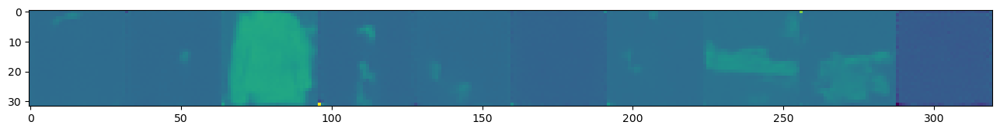

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 2/40] [loss: 0.0692]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 3/40] [loss: 0.0614]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 4/40] [loss: 0.0573]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 5/40] [loss: 0.0550]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 6/40] [loss: 0.0530]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 7/40] [loss: 0.0520]


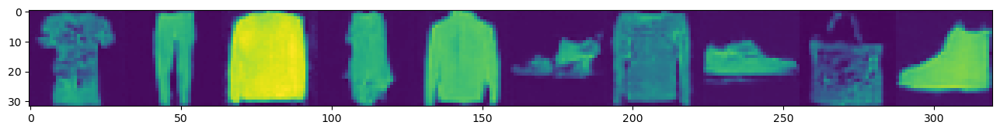

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 8/40] [loss: 0.0505]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 9/40] [loss: 0.0502]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 10/40] [loss: 0.0491]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 11/40] [loss: 0.0485]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 12/40] [loss: 0.0475]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 13/40] [loss: 0.0472]


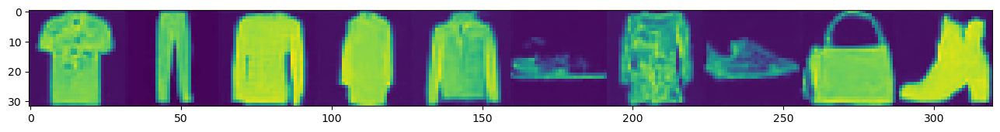

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 14/40] [loss: 0.0472]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 15/40] [loss: 0.0468]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 16/40] [loss: 0.0463]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 17/40] [loss: 0.0454]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 18/40] [loss: 0.0453]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 19/40] [loss: 0.0453]


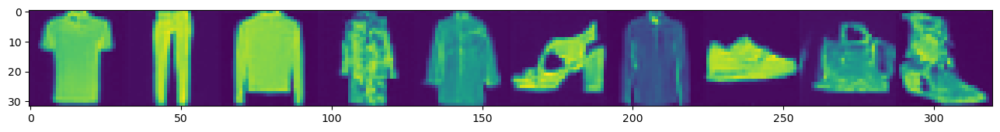

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 20/40] [loss: 0.0451]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 21/40] [loss: 0.0449]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 22/40] [loss: 0.0447]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 23/40] [loss: 0.0444]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 24/40] [loss: 0.0443]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 25/40] [loss: 0.0438]


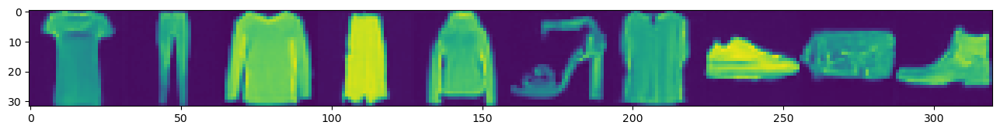

  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 26/40] [loss: 0.0439]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 27/40] [loss: 0.0436]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 28/40] [loss: 0.0436]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 29/40] [loss: 0.0432]


  0%|          | 0/937 [00:00<?, ?it/s]

[Epoch: 30/40] [loss: 0.0431]


{'loss': [0.15924231884971246,
  0.0691522524325354,
  0.06135036834299946,
  0.05726416463086038,
  0.05496793988547432,
  0.05296409580749216,
  0.05197997234777618,
  0.05051730466825667,
  0.05024519186415247,
  0.049108388413264634,
  0.04845586978495439,
  0.047470317861281947,
  0.04722309688040579,
  0.04718250883673591,
  0.046818167758407817,
  0.046337784537319945,
  0.04540138554897481,
  0.045301768242947064,
  0.04533871627445536,
  0.04507899806380526,
  0.04488002570701829,
  0.044658424203525615,
  0.04442115991178546,
  0.044251426271179825,
  0.043830050638575695,
  0.043899019873972385,
  0.04364441143171892,
  0.04363489657314445,
  0.043246848317878984,
  0.043144150830908674]}

In [ ]:
con_ddpm = ConDDPMManager() # You can pass your arguments to the call.
con_ddpm_history = con_ddpm.train(dataloader)
con_ddpm_history

## Comparisons (10 points)

History of each training has been stored in `[MODEL]_history`. Plot the losses for each model. Also sample images from each model and compare your results. 

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_loss(loss_list, model_name):

    losses = {'Epoch': range(1, len(loss_list)+1), 'Loss': loss_list}
    
    sns.set(style="darkgrid")
    sns.lineplot(x='Epoch', y='Loss', data=losses)
    
    # Set the title and axis labels
    plt.title(f'Loss of {model_name}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    
    # Show the plot
    plt.show()

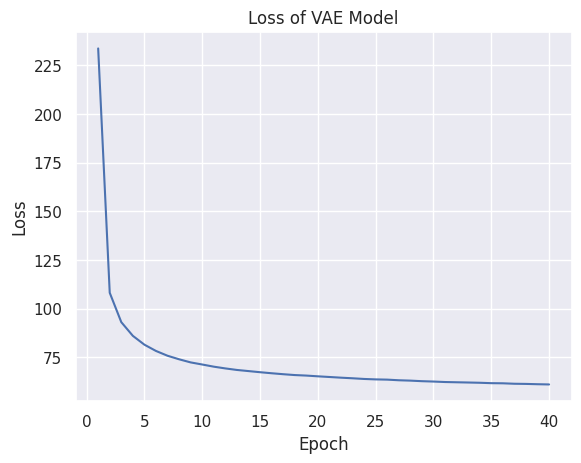

In [ ]:
plot_loss(vae_history, 'VAE Model')

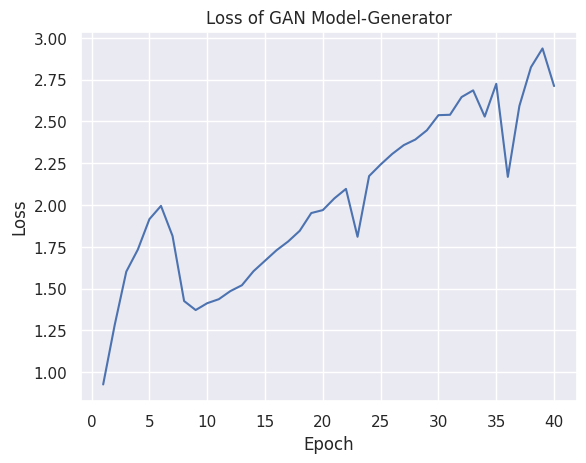

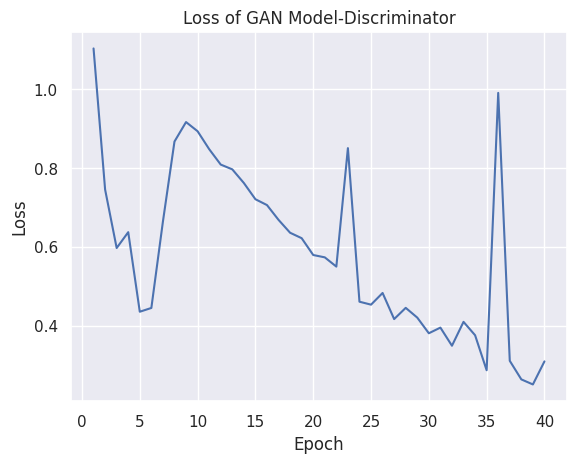

In [ ]:
plot_loss(gan_history['g_loss'], 'GAN Model-Generator')
plot_loss(gan_history['d_loss'], 'GAN Model-Discriminator')

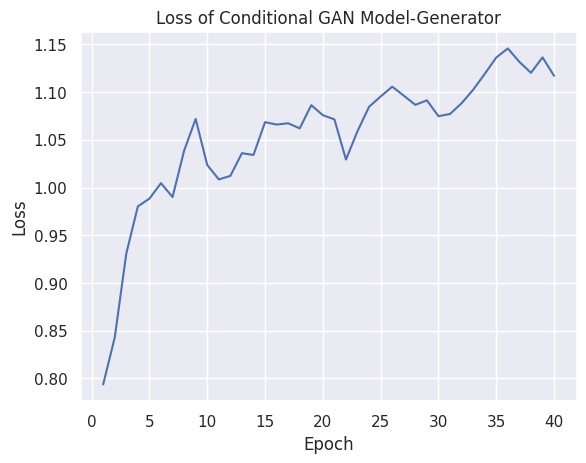

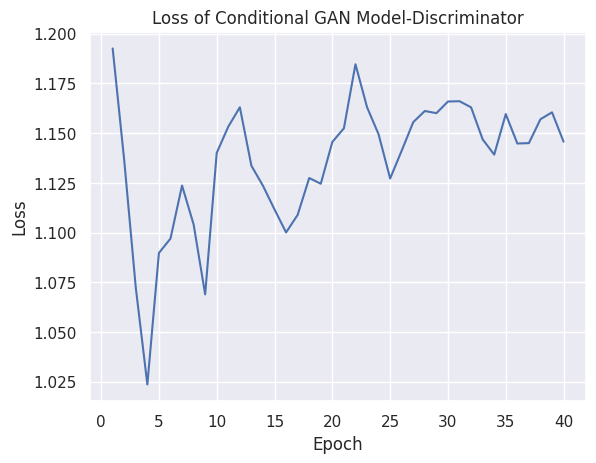

In [ ]:
plot_loss(con_gan_history['g_loss'], 'Conditional GAN Model-Generator')
plot_loss(con_gan_history['d_loss'], 'Conditional GAN Model-Discriminator')

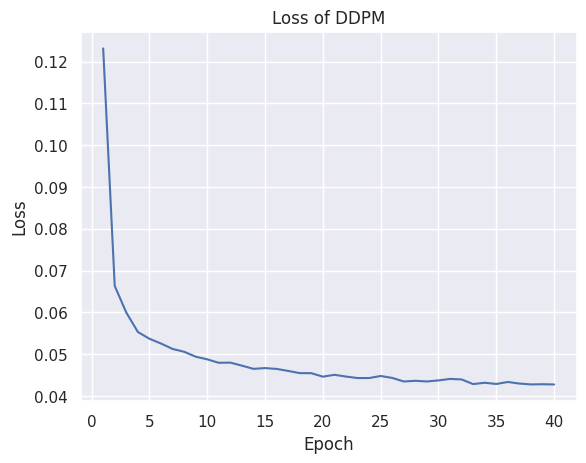

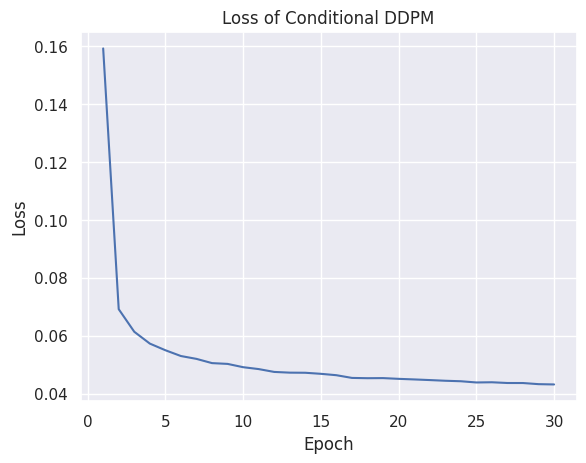

In [ ]:
plot_loss(ddpm_history, 'DDPM')
plot_loss(con_ddpm_history, 'Conditional DDPM')

برای مقایسه مدل ها، با نگاهیی به خروجی ها اولا در میابیم که مدل های که شرطی هستند عملکرد بهتری دارند-هرچند من از خروجی مدل وی ای ای هم خیلی خوشم اومد واقعا نتایجش جالب بود-هم برای مدل گن و هم مدل دیفیوژن تقریبا خروجی شرطی عملکرد بهتری داره چون امبدینگ بهتری هم داره. بین مدل ها هم خب خیلی خیلی بدهیی هستش که مدل دیفیوژن خروجی بهتری داشته باشه و خب همونطور که از این مدل ها انتظار میره، عکسایی که جنریت می کنن خیلی کیفیت بهتری دارند

پی نوشت:  من بخشی از این کد رو روی لپتاب خودم،بخشیش رو روی کولب، و بخشیش رو هم روی کگل ران گرفتم.ایموچی خنده. امکان داره توی کپی پیست کردن کد ها اتفاق عجیب و غریبی افتاده باشه. تا جایی که من الان چک کردم اوکی بودش ولی اگر مشکلی بودش تو تلگرام بهم پیام بدین. چون تو کولب و کگل ران گرفتم تمام هیستوری ها و لاگ ها هستش می تونیم اونجا بهتر بررسی کنیم.